#### <center><h1><b>Importing Libraries</b></h1></center>

In [1]:
#Importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import copy
import shap
from shap.maskers import Independent
import tqdm as notebook_tqdm
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, roc_curve, auc
from scipy.stats import norm
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [2]:
from qiskit.circuit.library import ZZFeatureMap, PauliFeatureMap , RealAmplitudes, EfficientSU2
from qiskit_algorithms.utils import algorithm_globals
import qiskit_algorithms.optimizers as op
from qiskit.primitives import Sampler
from qiskit_machine_learning.algorithms.classifiers import VQC

#### <center><h1><b>Data Cleaning</b></h1></center>

In [3]:
df1 = pd.read_excel('../Dataset/Hum_ZP_updated_AT_220224.xlsx', sheet_name = 'Group_1_Healthy_EVs')

In [4]:
df2 = pd.read_excel('../Dataset/Hum_ZP_updated_AT_220224.xlsx', sheet_name = 'Group_2_Cancer_EVs')

In [5]:
df3 = pd.read_excel('../Dataset/Hum_ZP_updated_AT_220224.xlsx', sheet_name = 'Group_3_Cancer_EVs_NP')

In [6]:
df4 = pd.read_excel('../Dataset/Hum_ZP_updated_AT_220224.xlsx', sheet_name = 'Group_4_Healthy EVs_NP')

In [7]:
df5 = pd.read_excel('../Dataset/Hum_ZP_updated_AT_220224.xlsx', sheet_name = 'Group_5_Healthy Plasma')

In [8]:
df6 = pd.read_excel('../Dataset/Hum_ZP_updated_AT_220224.xlsx', sheet_name = 'Group_6_Cancer Plasma')

In [9]:
df7 = pd.read_excel('../Dataset/Hum_ZP_updated_AT_220224.xlsx', sheet_name = 'Group_7_Healthy Palsma_NP')

In [10]:
df8 = pd.read_excel('../Dataset/Hum_ZP_updated_AT_220224.xlsx', sheet_name = 'Group_8_Cancer Plasma_NP')

In [11]:
df1.head()

,Record,Type,Sample Name,Measurement Date and Time,T,Surface Zeta Potential,Surface Zeta Potential Uncertainty,Zeta Potential,Mob,Cond,Tracer Zeta Potential,Mean Count Rate
0,,NaN,,,°C,mV,mV,mV,µmcm/Vs,mS/cm,mV,kcps
1,1,Zeta,Hum_H1 1,"Thursday, November 30, 2023 7:58:08 PM",25,NaN,NaN,-5.69,-0.4461,18.9,NaN,210.8
2,2,Zeta,Hum_H1 2,"Thursday, November 30, 2023 7:59:49 PM",25,NaN,NaN,-6.28,-0.4924,19.9,NaN,53
3,3,Zeta,Hum_H1 3,"Thursday, November 30, 2023 8:00:10 PM",25,NaN,NaN,-7.12,-0.5582,20.7,NaN,440.6
4,4,Zeta,Hum_H1 4,"Thursday, November 30, 2023 8:00:31 PM",25,NaN,NaN,-5.93,-0.4651,21.2,NaN,177.6


In [12]:
df1 = df1.iloc[1:]
df2 = df2.iloc[1:]
df3 = df3.iloc[1:]
df4 = df4.iloc[1:]
df5 = df5.iloc[1:]
df6 = df6.iloc[1:]
df7 = df7.iloc[1:]
df8 = df8.iloc[1:]

In [13]:
def redefine_sample_name(sample):
    if 'Hum_H' in sample:
        return 0
    elif 'Hum_C_NP' in sample:
        return 2
    elif 'Healthy EVs_NP' in sample:
        return 3
    elif 'Healthy Plasma_NP_' in sample:
        return 6
    elif 'Cancer Plasma_NP_' in sample:
        return 7
    elif 'Healthy Plasma_' in sample:
        return 4
    elif 'Cancer Plasma_' in sample:
        return 5
    else:
        return 1

In [14]:
df4.dtypes

Record                                object
Type                                  object
Sample Name                           object
Measurement Date and Time             object
T                                     object
Surface Zeta Potential                object
Surface Zeta Potential Uncertainty    object
Reported Zeta Potential               object
Mob                                   object
Cond                                  object
Tracer Zeta Potential                 object
Derived Count Rate                    object
dtype: object

In [15]:
df1['Sample Name'] = df1['Sample Name'].apply(redefine_sample_name)
df2['Sample Name'] = df2['Sample Name'].apply(redefine_sample_name)
df3['Sample Name'] = df3['Sample Name'].apply(redefine_sample_name)
df4['Sample Name'] = df4['Sample Name'].apply(redefine_sample_name)
df5['Sample Name'] = df5['Sample Name'].apply(redefine_sample_name)
df6['Sample Name'] = df6['Sample Name'].apply(redefine_sample_name)
df7['Sample Name'] = df7['Sample Name'].apply(redefine_sample_name)
df8['Sample Name'] = df8['Sample Name'].apply(redefine_sample_name)

In [16]:
df1.columns

Index(['Record', 'Type', 'Sample Name', 'Measurement Date and Time', 'T',
       'Surface Zeta Potential', 'Surface Zeta Potential Uncertainty',
       'Zeta Potential', 'Mob', 'Cond', 'Tracer Zeta Potential',
       'Mean Count Rate'],
      dtype='object')

In [17]:
columns = ['Record', 'Type', 'Measurement Date and Time', 'T',
       'Surface Zeta Potential', 'Surface Zeta Potential Uncertainty','Mob',
        'Tracer Zeta Potential']

In [18]:
df1.drop(columns = columns, inplace = True)

In [19]:
df3.drop(columns = columns, inplace = True)

In [20]:
df3.columns

Index(['Sample Name', 'Zeta Potential', 'Cond', 'Mean Count Rate'], dtype='object')

In [21]:
df2.columns

Index(['Record', 'Type', 'Sample Name', 'Measurement Date and Time', 'T',
       'Surface Zeta Potential', 'Surface Zeta Potential Uncertainty',
       'Reported Zeta Potential', 'Mob', 'Cond', 'Tracer Zeta Potential',
       'Derived Count Rate'],
      dtype='object')

In [22]:
columns = ['Record', 'Type', 'Measurement Date and Time', 'T','Mob',
       'Surface Zeta Potential', 'Surface Zeta Potential Uncertainty',
        'Tracer Zeta Potential']

In [23]:
df2.drop(columns = columns, inplace = True)
df4.drop(columns = columns, inplace = True)
df5.drop(columns = columns, inplace = True)
df6.drop(columns = columns, inplace = True)
df7.drop(columns = columns, inplace = True)
df8.drop(columns = columns, inplace = True)

In [24]:
df2.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df4.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df5.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df6.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df7.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df8.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)

In [25]:
df2.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df4.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df5.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df6.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df7.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df8.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)

In [26]:
df1.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [27]:
df2.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [28]:
df3.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [29]:
df4.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [30]:
df5.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [31]:
df6.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [32]:
df7.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [33]:
df8.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [34]:
del columns

In [35]:
df2.columns

Index(['Sample Name', 'Zeta Potential', 'Cond', 'Mean Count Rate'], dtype='object')

In [36]:
dataset1 = pd.concat([df1, df2], axis = 0)
dataset2 = pd.concat([df1, df4], axis = 0)
dataset3 = pd.concat([df2, df3], axis = 0)
dataset4 = pd.concat([df5, df7], axis = 0)
dataset5 = pd.concat([df6, df8], axis = 0)

In [37]:
del df1, df2, df3, df4, df5, df6, df7, df8

In [38]:
columns = ['Zeta Potential', 'Cond', 'Mean Count Rate']

In [39]:
dataset1[columns] = dataset1[columns].astype(float)
dataset2[columns] = dataset2[columns].astype(float)
dataset3[columns] = dataset3[columns].astype(float)
dataset4[columns] = dataset4[columns].astype(float)
dataset5[columns] = dataset5[columns].astype(float)

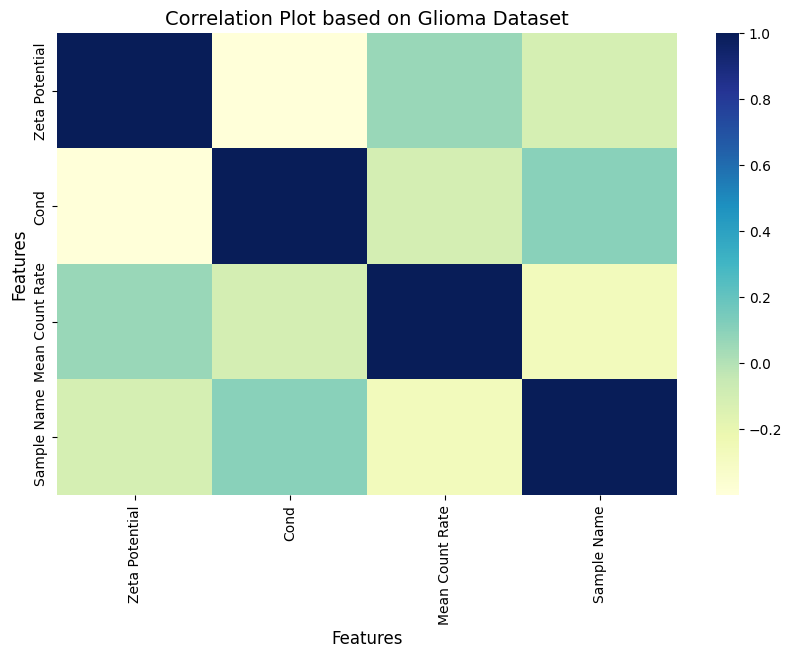

In [40]:
#========================Creating correlation matrix for the Glioma datastet==================================
columns = ['Zeta Potential', 'Cond', 'Mean Count Rate', 'Sample Name']

correlation_matrix = dataset1[columns].corr()
# Create a correlation plot
plt.figure(figsize=(10, 6))  # Set the figure size
sns.heatmap(correlation_matrix, cmap='YlGnBu')
# Add plot title and adjust font size
plt.title('Correlation Plot based on Glioma Dataset', fontsize=14)
# Set the font size of the axis labels
plt.xlabel('Features', fontsize=12)
plt.ylabel('Features', fontsize=12)

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)
# Show the plot
plt.show()
#==========================================================================================================

In [41]:
#================Method to evaluate classical ML models==============
def evaluate_model(model, train_set, X_train, y_train, X_test, y_test):
    acc_ls = []
    pred_ls = []
    train_data = []
    pred_proba_ls = []
    for elm in train_set:
        clf = copy.copy(model)
        X_t, dummy_x, y_t, dummy_y = train_test_split(copy.copy(X_train), y_train, train_size=elm, random_state=algorithm_globals.random_seed)
        # Fitting the classifier to the training data
        clf.fit(X_t, y_t)
        train_data.append(y_t)
        # Making predictions on the testing data
        y_pred = clf.predict(X_test)
        y_pred_proba = clf.predict_proba(X_t)
        pred_ls.append(y_pred)
        pred_proba_ls.append(y_pred_proba)
        # Evaluating the accuracy of the model
        accuracy = accuracy_score(y_test, y_pred)
        acc_ls.append(accuracy)
        print(f'Accuracy score({clf.__class__.__name__} model): {accuracy:.6f} with {elm*100}% training records')
    return acc_ls, pred_ls, train_data, pred_proba_ls

In [42]:
#=====================Method to show ROC Curve of the model based on different training set===========================
def evaluate_ROC(train_set, y_test, pred_ls):
    for i in range(len(train_set)):
        # Compute the ROC curve and AUC
        fpr, tpr, thresholds = roc_curve(y_test, pred_ls[i])
        roc_auc = auc(fpr, tpr)
        # Compute the confidence interval
        std_err = np.sqrt(np.divide(tpr * (1 - tpr), y_test.size, where=(y_test.size != 0)) * (fpr + tpr))
        # Compute the confidence interval with explicit broadcasting
        upper_bound = tpr + std_err * 1.96
        lower_bound = tpr - std_err * 1.96
        # Plot the ROC curve
        plt.figure()
        plt.plot(fpr, tpr, color='b', label='AUC = %0.2f' % roc_auc)
        plt.fill_between(fpr, lower_bound, upper_bound, color='lightblue', alpha=0.5,label = '\n95%% CI: [%0.2f, %0.2f]' % (lower_bound[1], upper_bound[1]))
        plt.plot([0, 1], [0, 1], color='r', linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.xlabel('FPR')
        plt.ylabel('TPR')
        plt.title(f'ROC Curve (95% CI), {train_set[i]*100}% Training Data')
        plt.legend(loc="lower right")
        plt.show()

In [43]:
#=========================Method to show Confusion Matrix on different Training Set==============================
def evaluate_con_mat(train_set, y_test, pred_ls):
    for i in range(len(train_set)):
        # Calculate the confusion matrix
        cm = confusion_matrix(y_test, pred_ls[i])
        # Create a heatmap of the confusion matrix
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.xlabel('Predicted Labels')
        plt.ylabel('True Labels')
        plt.title(f'Confusion Matrix ({train_set[i]*100}% Training Data)')
        plt.show()

In [44]:
train_set = [0.70, 0.50, 0.1, 0.05]

In [45]:
training_sample = []
for i in range(len(train_set)):
    training_sample.append(train_set[i] * 100)

In [46]:
scaler = StandardScaler()
algorithm_globals.random_seed = 123

# <center><h1><b>Task 1 (Healthy_EVs vs Cancer_EVs)</b></h1></center>

In [46]:
#==================Predictor Variables=====================================
X = dataset1[['Zeta Potential', 'Cond', 'Mean Count Rate']]
#X = dataset.drop(['Grade','Age_in_years'], axis = 1)
#===================Output Variable========================================
y = dataset1['Sample Name']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=algorithm_globals.random_seed)

## Logistic Regression

### Logistic Regression without hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [47]:
#=====================Logistic Regression Model with different training sets================
eval_mod=evaluate_model(LogisticRegression(solver='lbfgs', max_iter=1000), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.766667 with 70.0% training records
Accuracy score(LogisticRegression model): 0.700000 with 50.0% training records
Accuracy score(LogisticRegression model): 0.733333 with 10.0% training records
Accuracy score(LogisticRegression model): 0.700000 with 5.0% training records


In [48]:
#===============================Hyperparameter Tuning================================
clf_LR = LogisticRegression(solver = 'lbfgs', max_iter=1000)
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],'penalty': ['l2'], 'solver': ['newton-cg','lbfgs' ,'liblinear', 'saga']}
grid_search = GridSearchCV(clf_LR, param_grid, cv=10, verbose=0 ,scoring='accuracy')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 0.001, 'penalty': 'l2', 'solver': 'saga'}


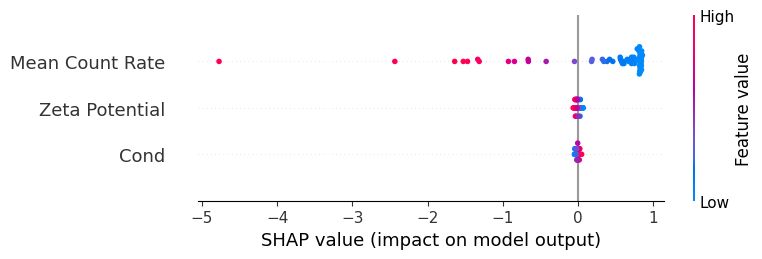

In [49]:
best_model = grid_search.best_estimator_
# Use SHAP's LinearExplainer with the best model
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    explainer = shap.LinearExplainer(best_model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

### Logistic Regression with hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [50]:
#==============================Logistic Regression Model with Hyperparameter Tuning===========================
acc_LR, pred_LR, train_data, pred_proba_LR = evaluate_model(LogisticRegression(solver = best_params['solver'], penalty=best_params['penalty'], C = best_params['C']), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.633333 with 70.0% training records
Accuracy score(LogisticRegression model): 0.633333 with 50.0% training records
Accuracy score(LogisticRegression model): 0.550000 with 10.0% training records
Accuracy score(LogisticRegression model): 0.666667 with 5.0% training records


### Learning Curve for Logistic Regression (Healthy_EVs vs Cancer_EVs)

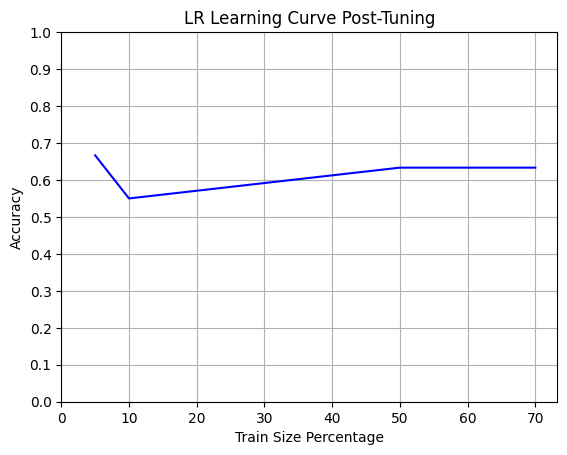

In [51]:
#===============================Learning Curve for LR===========================================
plt.plot(training_sample,acc_LR, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Logistic Regression (Healthy_EVs vs Cancer_EVs)

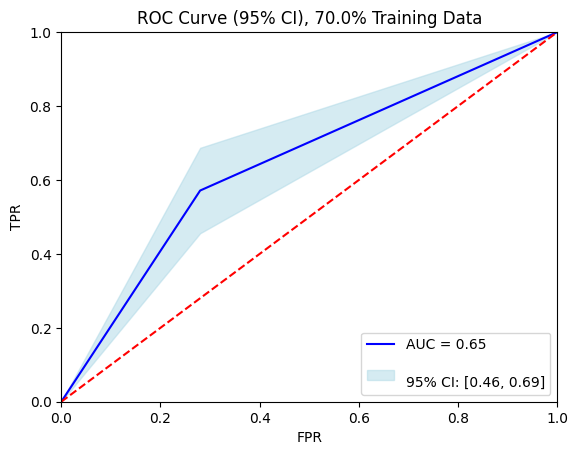

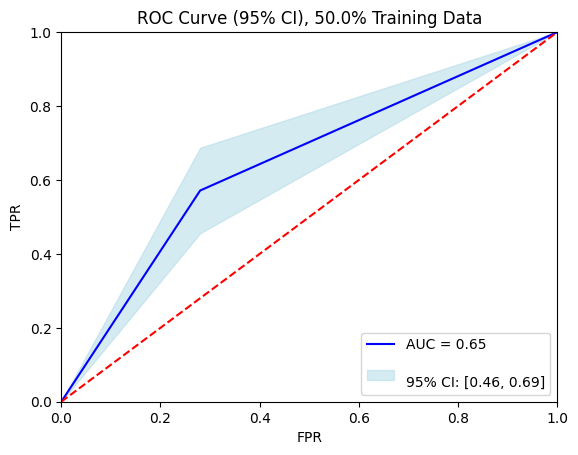

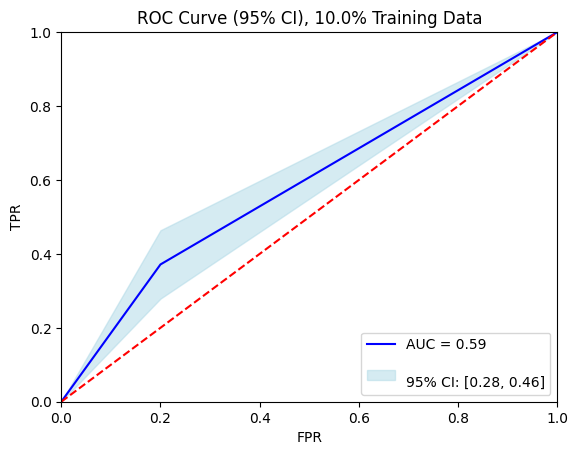

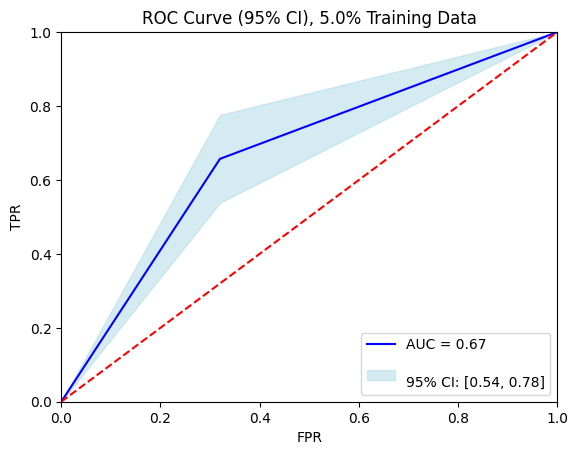

In [52]:
evaluate_ROC(train_set, y_test, pred_LR)

### Confusion Matrix for Logistic Regression (Healthy_EVs vs Cancer_EVs)

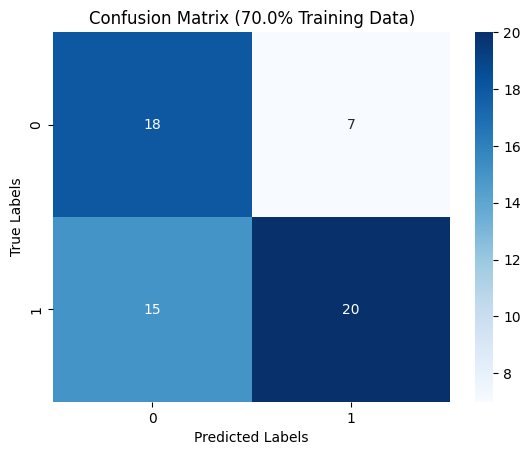

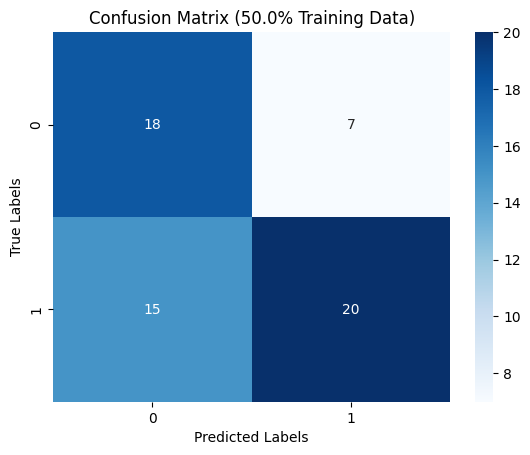

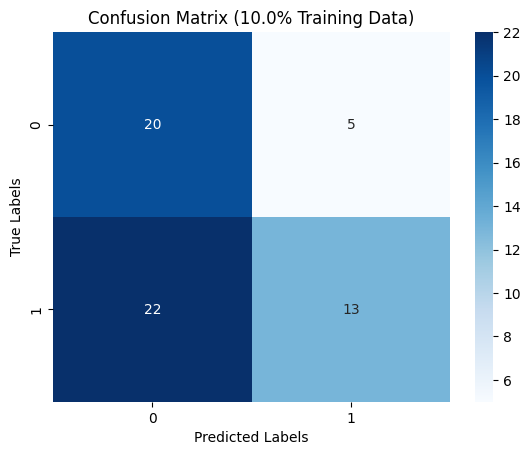

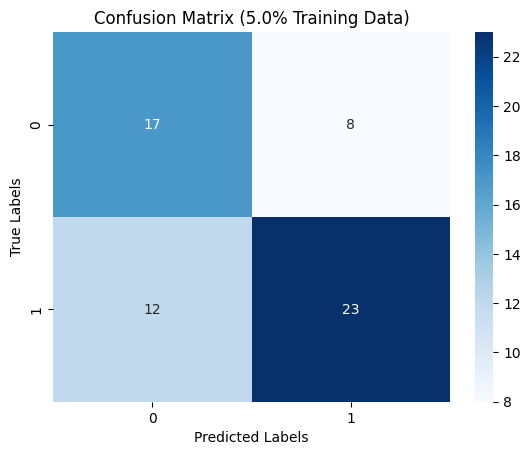

In [53]:
evaluate_con_mat(train_set, y_test, pred_LR)

In [54]:
del acc_LR, pred_LR, train_data, pred_proba_LR, best_params, clf_LR

## Random Forest

### Random Forest without hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [55]:
eval_mod=evaluate_model(RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10), train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.716667 with 70.0% training records
Accuracy score(RandomForestClassifier model): 0.800000 with 50.0% training records
Accuracy score(RandomForestClassifier model): 0.583333 with 10.0% training records
Accuracy score(RandomForestClassifier model): 0.583333 with 5.0% training records


In [56]:
#==============================Hyperparameter  Tuning======================================
clf_RF = RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=clf_RF, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 100}


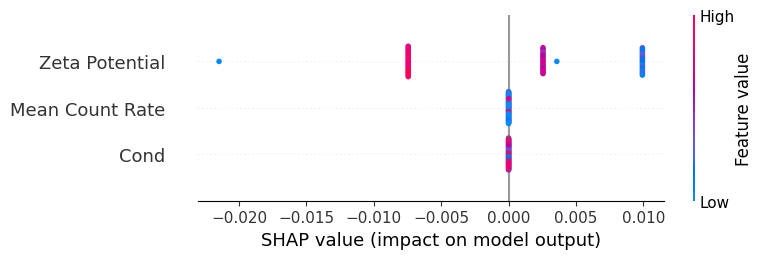

In [57]:
scaler = StandardScaler()
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_norm = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
explainer_rf = shap.Explainer(grid_search.best_estimator_, X_train_norm)
shap_values_rf = explainer_rf(X_test_norm)
shap_values_class_1 = shap_values_rf.values[..., 1]
shap.summary_plot(shap_values_class_1, X_test_norm)

### Random Forest with hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [58]:
#==============================Random Forest Model with Hyperparameter Tuning===========================
acc_RF, pred_RF, train_data, pred_proba_RF = evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.700000 with 70.0% training records
Accuracy score(RandomForestClassifier model): 0.750000 with 50.0% training records
Accuracy score(RandomForestClassifier model): 0.583333 with 10.0% training records
Accuracy score(RandomForestClassifier model): 0.583333 with 5.0% training records


### Learning Curve for Random Forest (Healthy_EVs vs Cancer_EVs)

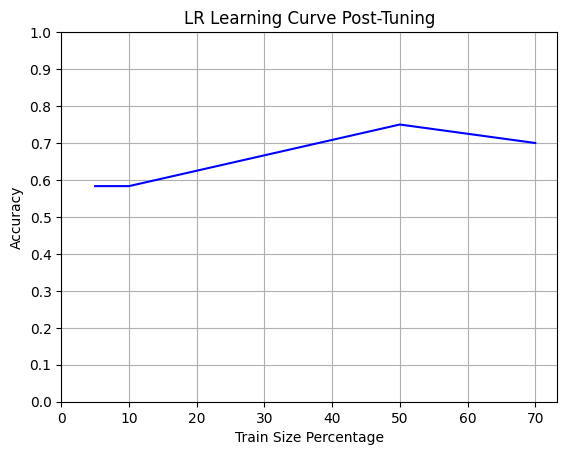

In [59]:
#===============================Learning Curve for Random Forest===========================================
plt.plot(training_sample,acc_RF, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Random Forest (Healthy_EVs vs Cancer_EVs)

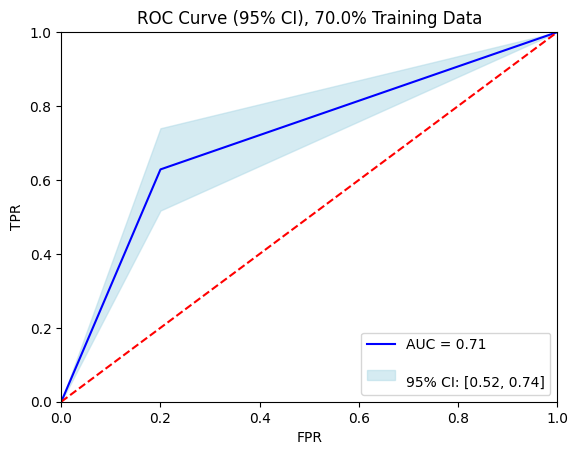

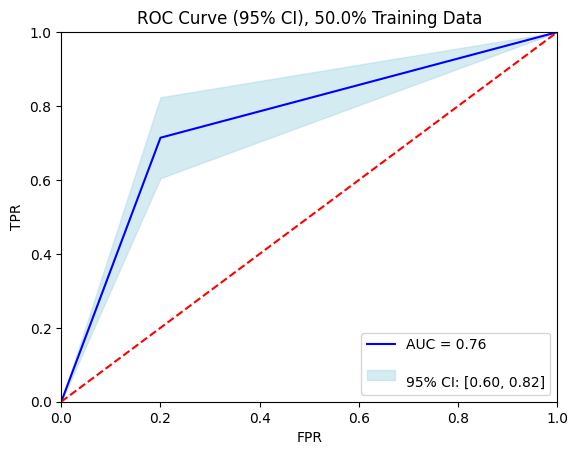

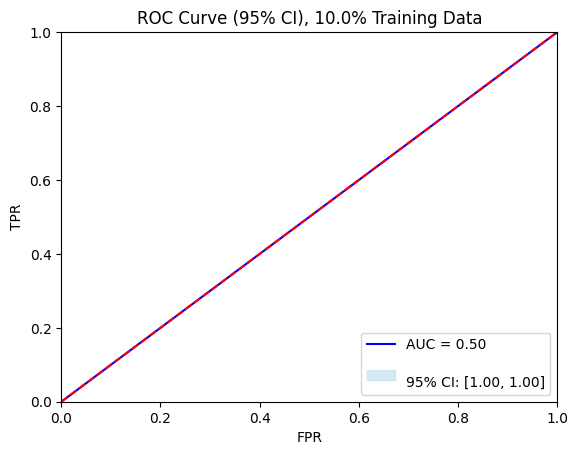

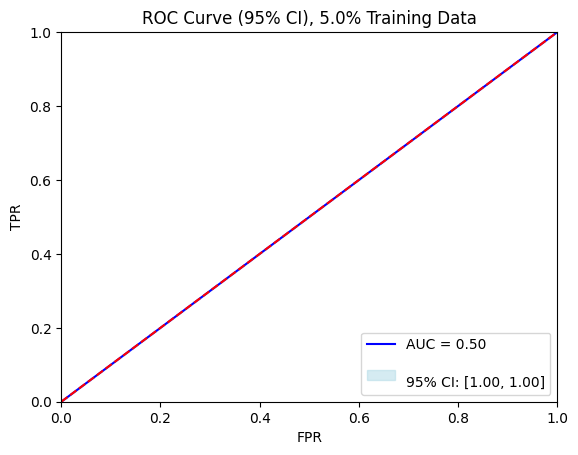

In [60]:
evaluate_ROC(train_set, y_test, pred_RF)

### Confusion Matrix for Random Forest (Healthy_EVs vs Cancer_EVs)

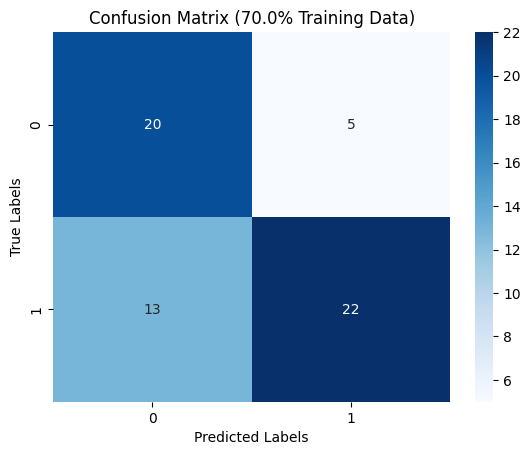

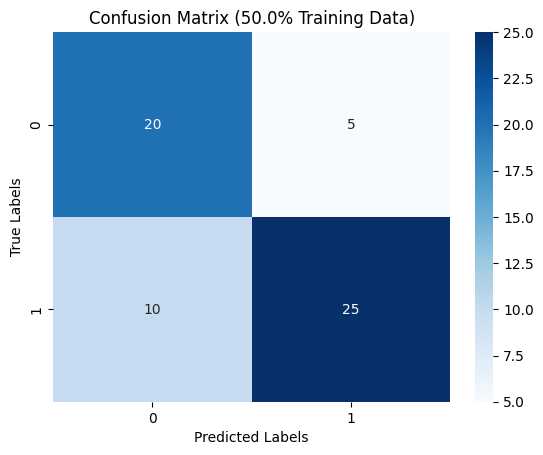

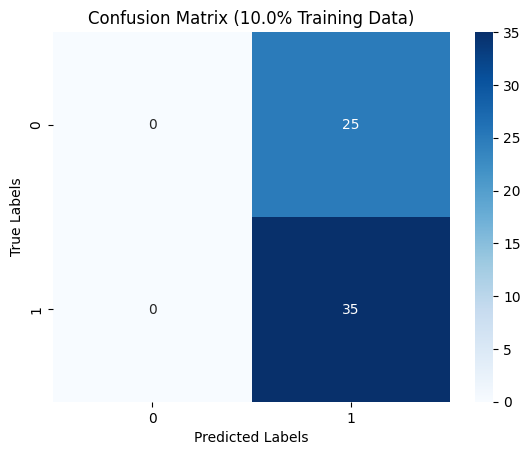

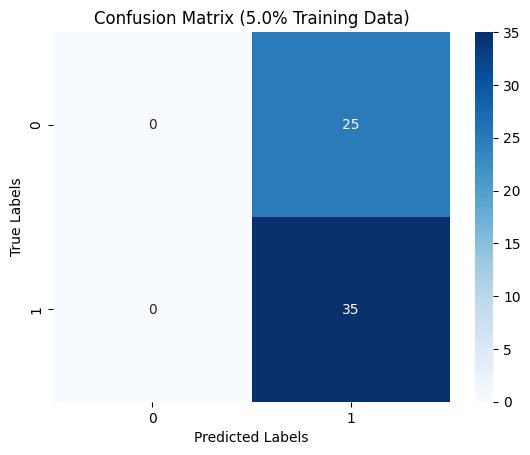

In [61]:
evaluate_con_mat(train_set, y_test, pred_RF)

In [62]:
del  acc_RF, pred_RF, train_data, pred_proba_RF, best_params, clf_RF

## Support Vector Classifier

### Support Vector Classifier  without hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [63]:
eval_mod=evaluate_model(SVC(kernel='sigmoid', probability=True, C = 100, gamma='auto'), train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.416667 with 70.0% training records
Accuracy score(SVC model): 0.583333 with 50.0% training records
Accuracy score(SVC model): 0.583333 with 10.0% training records
Accuracy score(SVC model): 0.583333 with 5.0% training records


In [64]:
#==========================Hyperparameter Tuning==========================
clf_SVM = SVC(probability=True)
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': [0.01, 0.1]
}
grid_search = GridSearchCV(estimator=clf_SVM, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}


Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/60 [00:00<?, ?it/s]

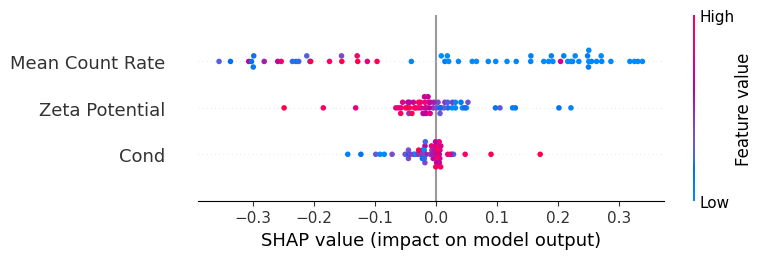

In [65]:
best_model = grid_search.best_estimator_
explainer_svc = shap.KernelExplainer(best_model.predict_proba, X_train)
shap_values_svc = explainer_svc(X_test)
shap_values_svc_class_1 = shap_values_svc.values[..., 1]
shap.summary_plot(shap_values_svc_class_1, X_test)

### Support Vector Classifier with hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [66]:
acc_SVC, pred_SVC, train_data, pred_proba_SVC=evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.700000 with 70.0% training records
Accuracy score(SVC model): 0.733333 with 50.0% training records
Accuracy score(SVC model): 0.566667 with 10.0% training records
Accuracy score(SVC model): 0.700000 with 5.0% training records


### Learning Curve for Support Vector Classifier (Healthy_EVs vs Cancer_EVs)

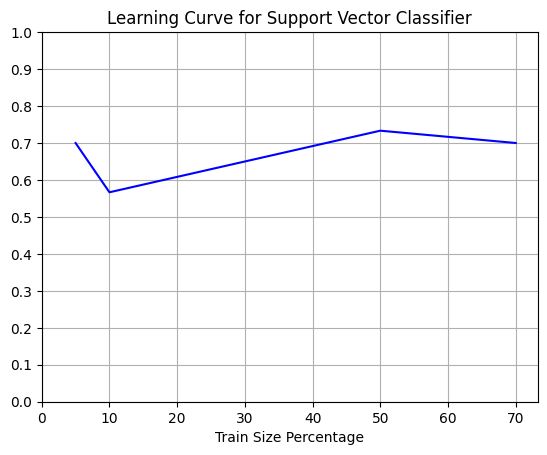

In [67]:
#===============================Learning Curve for SVC===========================================
plt.plot(training_sample,acc_SVC, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for Support Vector Classifier')
plt.show()

### ROC Curve for Support Vector Classifier (Healthy_EVs vs Cancer_EVs)

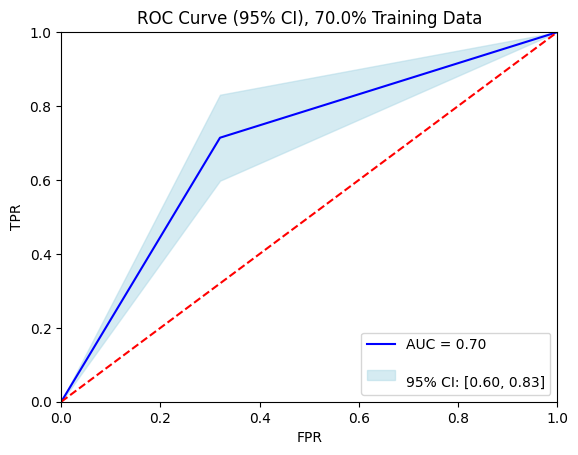

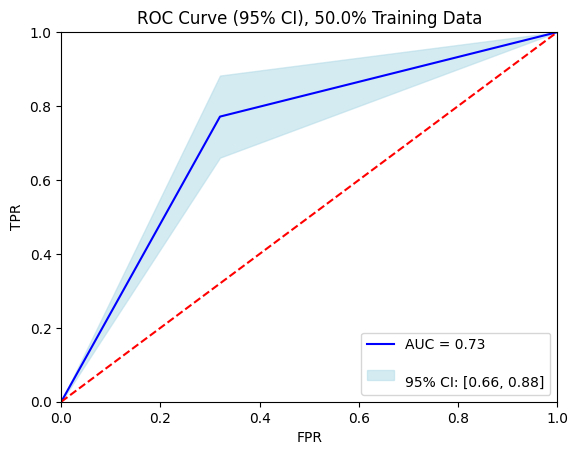

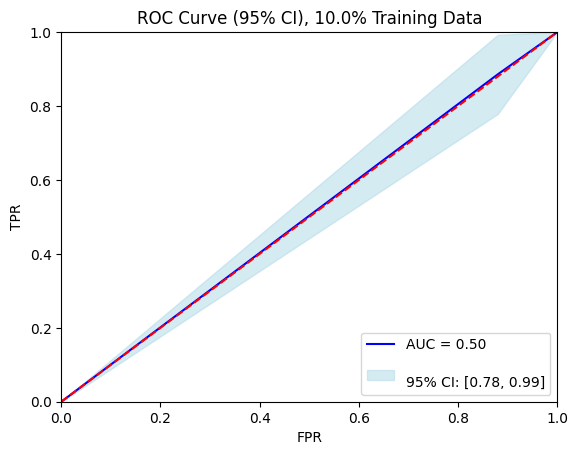

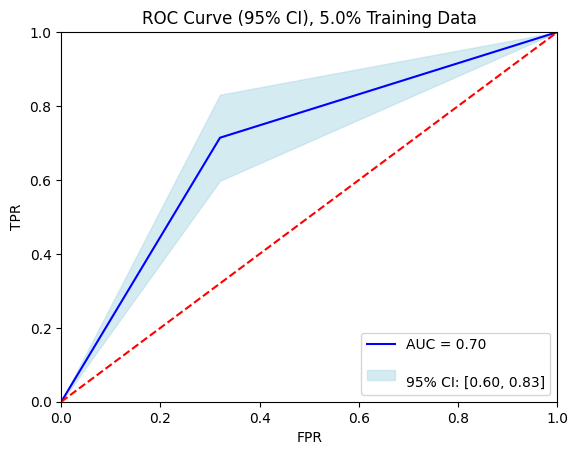

In [68]:
evaluate_ROC(train_set, y_test, pred_SVC)

### Confusion Matrix for Support Vector Classifier (Healthy_EVs vs Cancer_EVs)

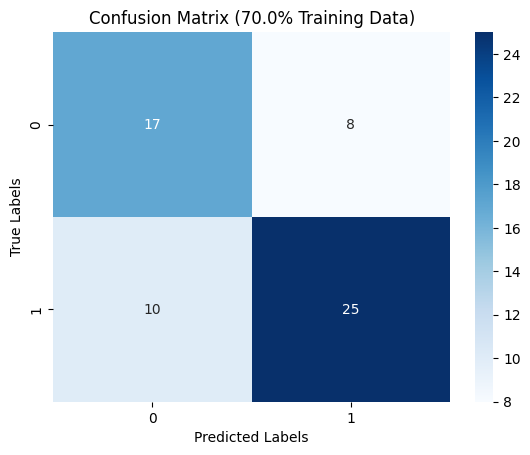

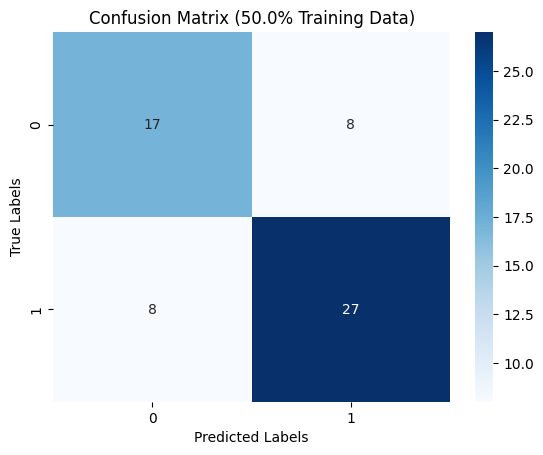

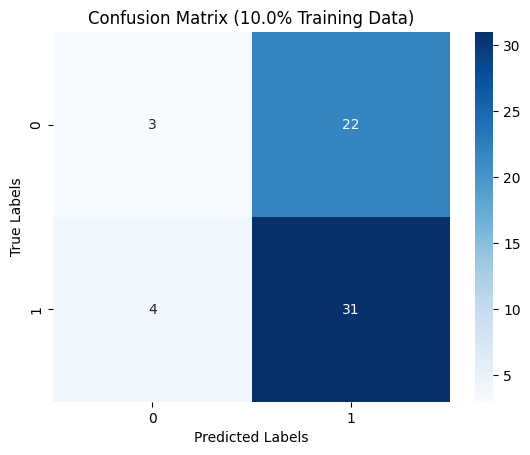

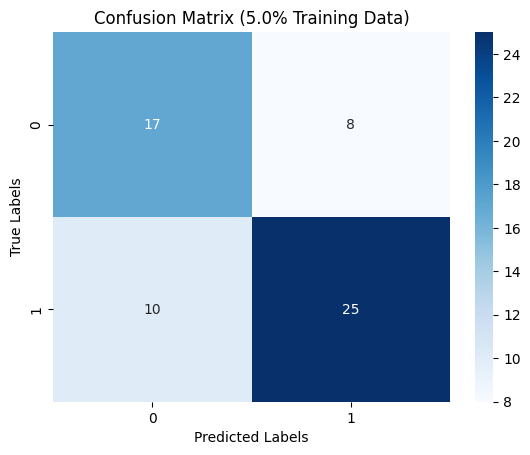

In [69]:
evaluate_con_mat(train_set, y_test, pred_SVC)

In [70]:
del acc_SVC, pred_SVC, train_data, pred_proba_SVC, best_params, clf_SVM

## Vector Quantum Classifier

In [50]:
#=====================Vector Quantum Classifier Model with different training sets================
train_features = MinMaxScaler().fit_transform(X_train)
train_labels = y_train
test_features = MinMaxScaler().fit_transform(X_test)
test_labels = y_test
num_features = train_features.shape[1]
feature_map = ZZFeatureMap(feature_dimension=num_features, reps=1)

In [48]:
del X_train, y_train

In [52]:
ansatz = EfficientSU2(num_qubits=num_features, reps=3)

In [56]:
optimizer = op.POWELL(maxiter=250)

In [57]:
sampler = Sampler()

### Vector Quantum Classifier with Hyperparameter Tuning (Healthy_EVs vs Cancer_EVs)

In [59]:
#======================================VQC=================================================
clf_vqc = VQC(
    sampler=sampler,
    feature_map=feature_map,
    ansatz=ansatz,
    loss = 'squared_error',
    optimizer=optimizer
)
acc_vqtask1 = []
pred_vqtask1 = []
for elm in train_set:
    vqc = copy.copy(clf_vqc)
    X_t, dummy_x, y_t, dummy_y = train_test_split(train_features, train_labels, train_size=elm, random_state=algorithm_globals.random_seed)
    vqc.fit(X_t, y_t.values)
    pred = vqc.predict(test_features)
    accuracy = accuracy_score(test_labels.values, pred)
    pred_vqtask1.append(pred)
    acc_vqtask1.append(accuracy)
    print(f'Accuracy score(VQC Model): {accuracy} with {elm*100}% training records')
#======================================VQC=================================================

Accuracy score(VQC Model): 0.55 with 70.0% training records
Accuracy score(VQC Model): 0.6 with 50.0% training records
Accuracy score(VQC Model): 0.7666666666666667 with 10.0% training records
Accuracy score(VQC Model): 0.6833333333333333 with 5.0% training records


## Learning Curve for VQC

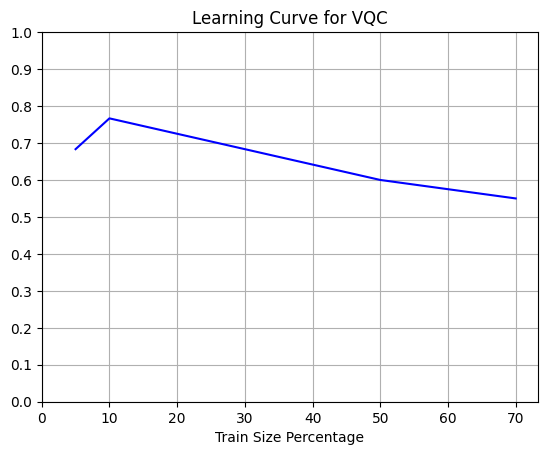

In [60]:
#===============================Learning Curve for VQC===========================================
plt.plot(training_sample,acc_vqtask1, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for VQC')
plt.show()

### 3D Scatter Plot for VQC Model (Healthy_EVs vs Cancer_EVs)

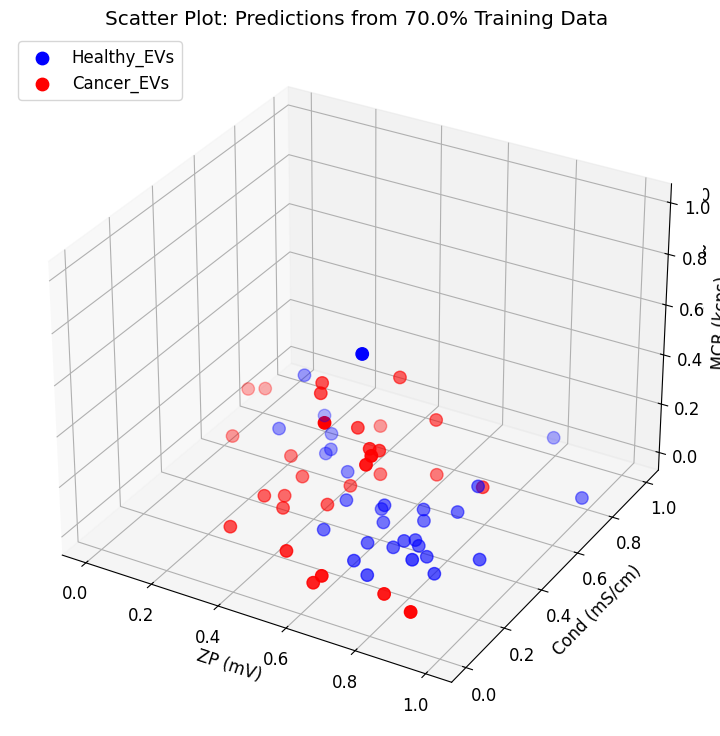

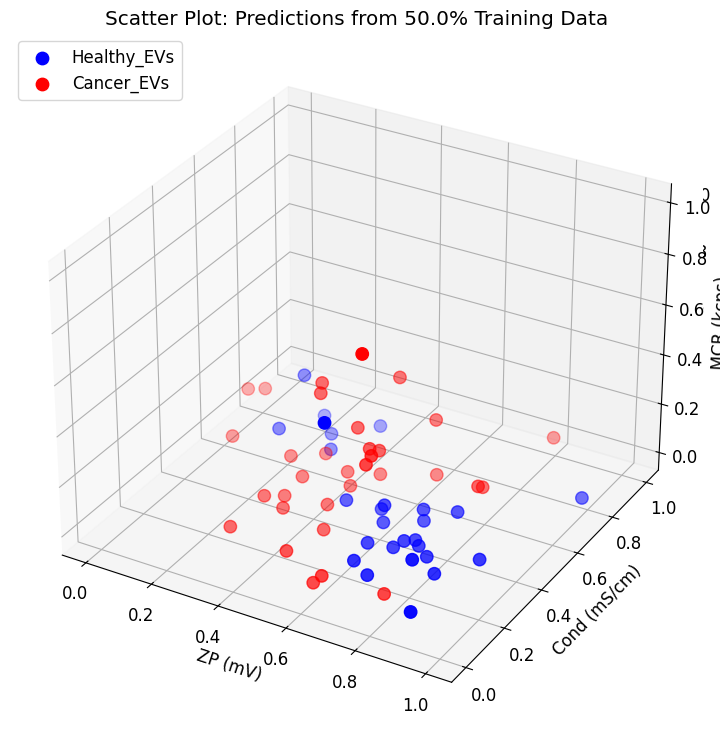

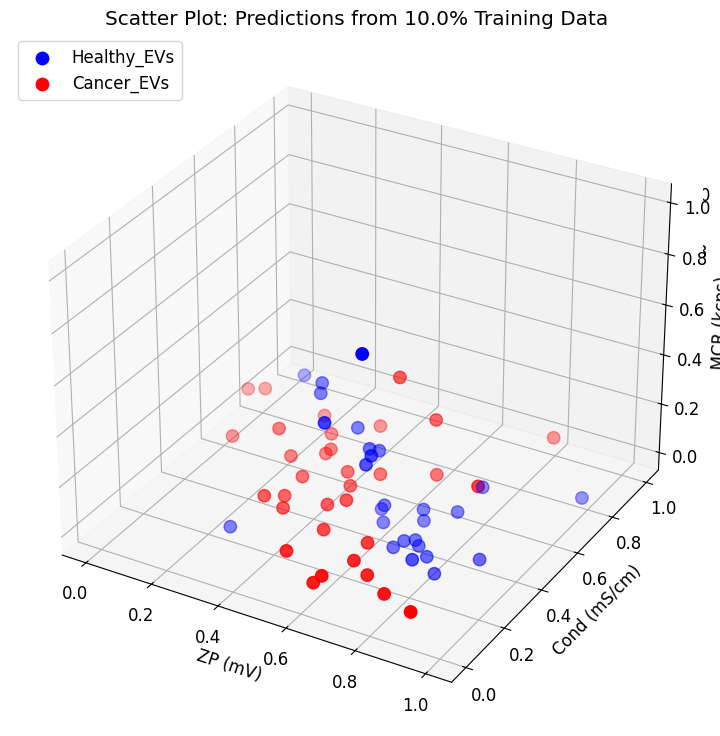

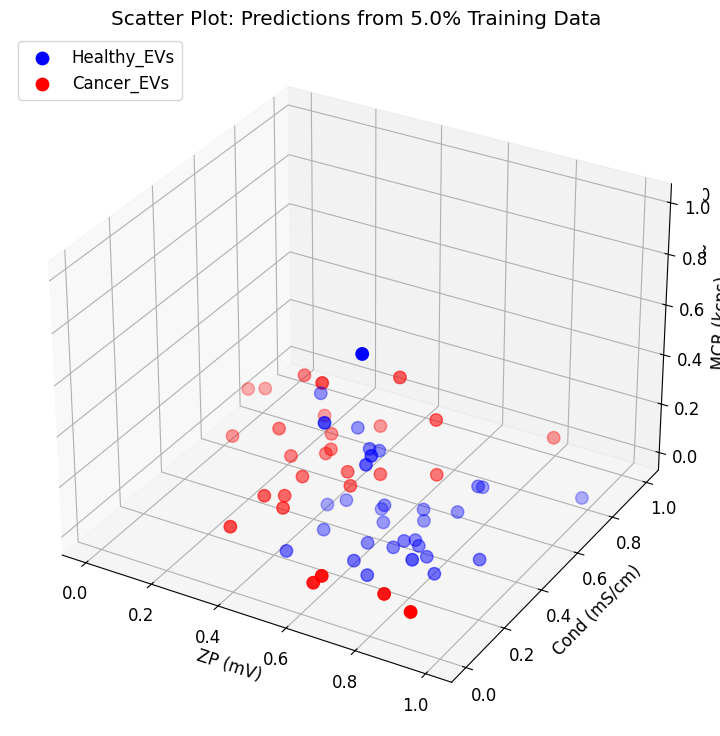

In [67]:
#=======================================3D Scatter Plot===============================
for i in range(len(train_set)):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(9,9))
    ax = plt.subplot(1,1,1,projection='3d')
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(test_features[pred_vqtask1[i]==0,0], test_features[pred_vqtask1[i]==0,1], test_features[pred_vqtask1[i]==0,2], c='blue', marker='o', label='Healthy_EVs', s=80)
    ax.scatter(test_features[pred_vqtask1[i]==1,0], test_features[pred_vqtask1[i]==1,1], test_features[pred_vqtask1[i]==1,2], c='red', marker='o', label='Cancer_EVs',s=80)
  # Set labels for each axis
    ax.set_xlabel('ZP (mV)')
    ax.set_ylabel('Cond (mS/cm)')
    ax.set_zlabel('MCR (kcps)')
    ax.set_title(f'Scatter Plot: Predictions from {train_set[i]*100}% Training Data')
    ax.tick_params("z", which="major",length=15,width = 2.0)
    ax.legend(loc='upper left')
    plt.show()

### ROC Curve for Vector Quantum Classifier (Healthy_EVs vs Cancer_EVs)

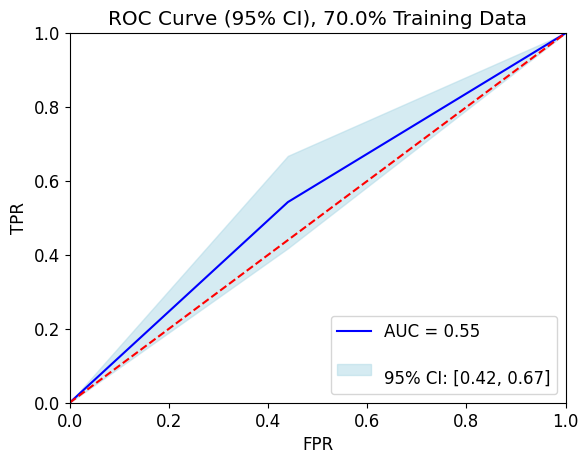

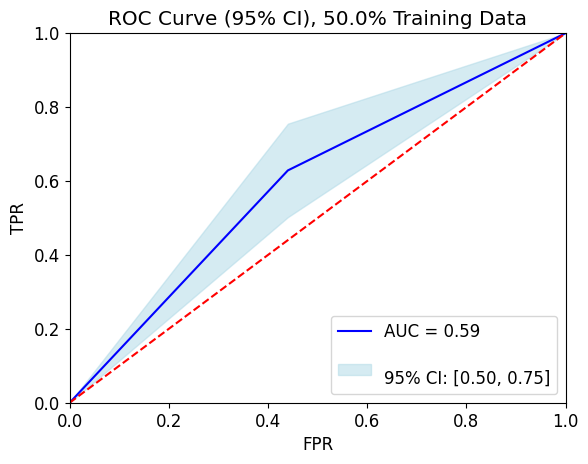

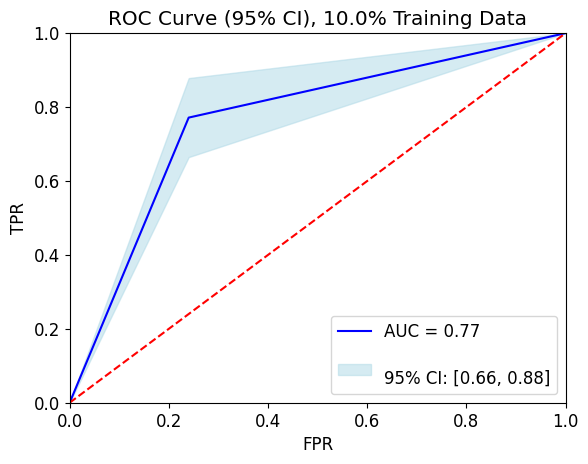

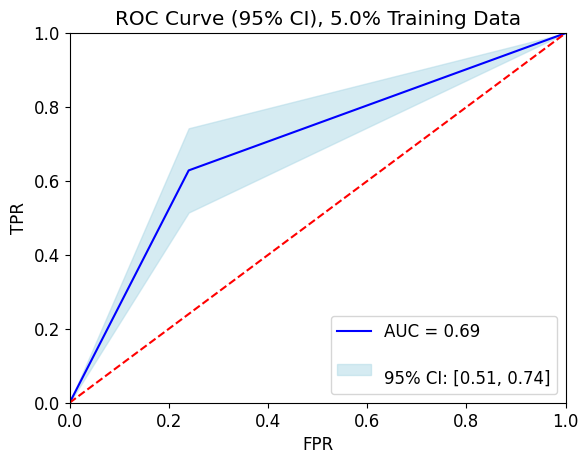

In [68]:
evaluate_ROC(train_set, test_labels, pred_vqtask1)

### Confusion Matrix for Vector Quantum Classifier (Healthy_EVs vs Cancer_EVs)

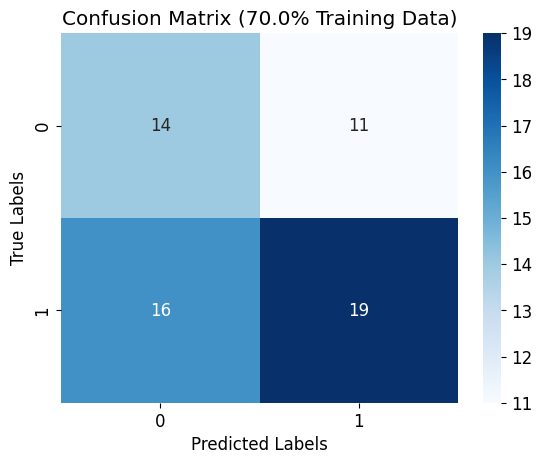

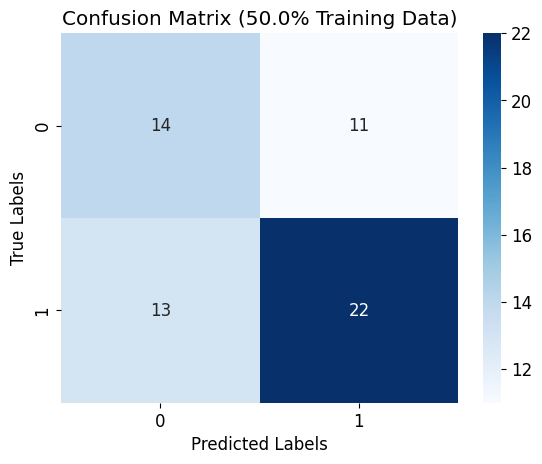

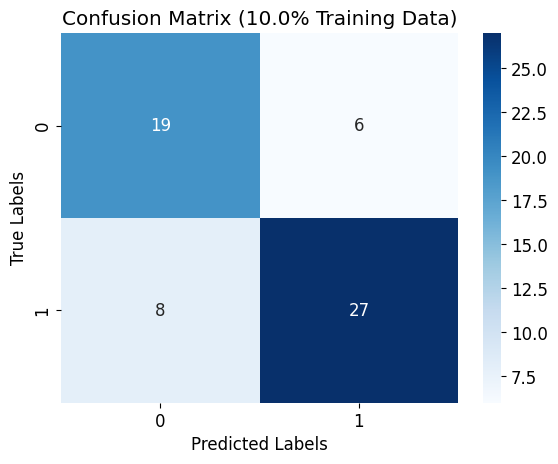

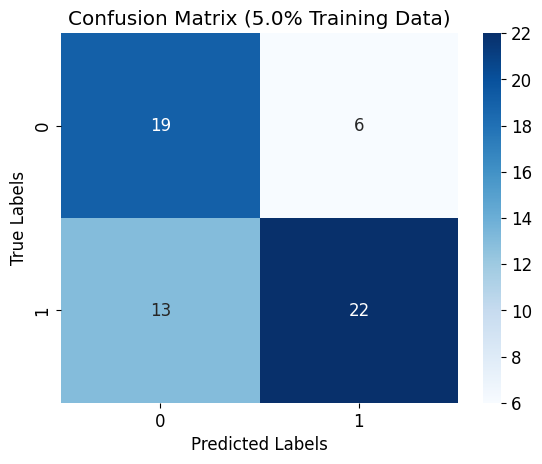

In [69]:
evaluate_con_mat(train_set, test_labels, pred_vqtask1)

# <center><h1><b>Task 2 (Healthy_EVs vs Healthy_EVs_NPs)</b></h1></center>

In [47]:
#==================Predictor Variables for dataset 2=====================================
X = dataset2[['Zeta Potential', 'Cond', 'Mean Count Rate']]
#X = dataset.drop(['Grade','Age_in_years'], axis = 1)
#===================Output Variable========================================
y = dataset2['Sample Name']
y = y.map(lambda x: 1 if x == 3 else 0)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=algorithm_globals.random_seed)

## Logistic Regression

### Logistic Regression without hyperparameter tuning

In [48]:
#=====================Logistic Regression Model with different training sets================
eval_mod=evaluate_model(LogisticRegression(solver='lbfgs', max_iter=1000), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.966667 with 70.0% training records
Accuracy score(LogisticRegression model): 0.966667 with 50.0% training records
Accuracy score(LogisticRegression model): 0.933333 with 10.0% training records
Accuracy score(LogisticRegression model): 0.916667 with 5.0% training records


In [72]:
#===============================Hyperparameter Tuning================================
warnings.filterwarnings("ignore", category=ConvergenceWarning)
clf_LR = LogisticRegression(solver = 'lbfgs', max_iter=1000)
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],'penalty': ['l2'], 'solver': ['newton-cg','lbfgs' ,'liblinear', 'saga']}
grid_search = GridSearchCV(clf_LR, param_grid, cv=10, verbose=0 ,scoring='accuracy')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}


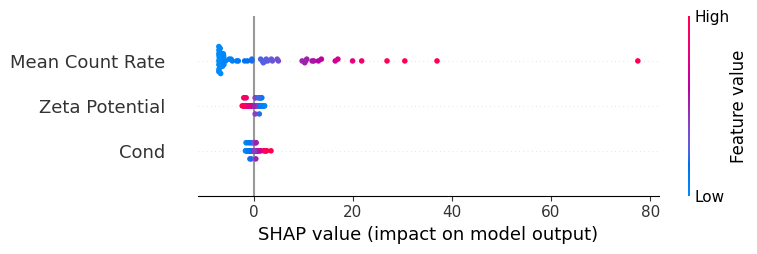

In [73]:
best_model = grid_search.best_estimator_
# Use SHAP's LinearExplainer with the best model
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    explainer = shap.LinearExplainer(best_model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

### Logistic Regression with hyperparameter tuning

In [74]:
#==============================Logistic Regression Model with Hyperparameter Tuning===========================
acc_LR, pred_LR, train_data, pred_proba_LR = evaluate_model(LogisticRegression(solver = best_params['solver'], penalty=best_params['penalty'], C = best_params['C']), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.966667 with 70.0% training records
Accuracy score(LogisticRegression model): 0.966667 with 50.0% training records
Accuracy score(LogisticRegression model): 0.933333 with 10.0% training records
Accuracy score(LogisticRegression model): 0.916667 with 5.0% training records


### Learning Curve for Logistic Regression

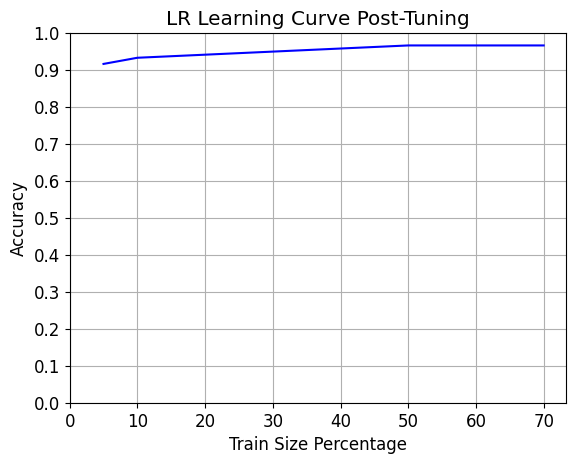

In [75]:
#===============================Learning Curve for LR===========================================
plt.plot(training_sample,acc_LR, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Logistic Regression

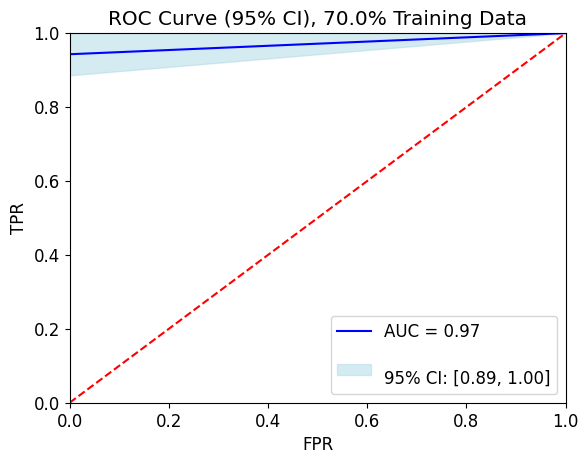

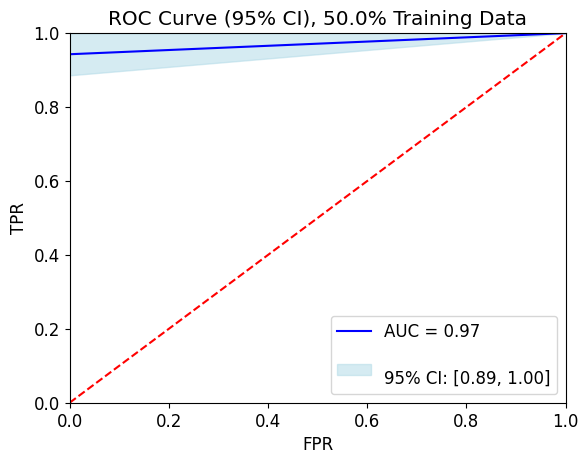

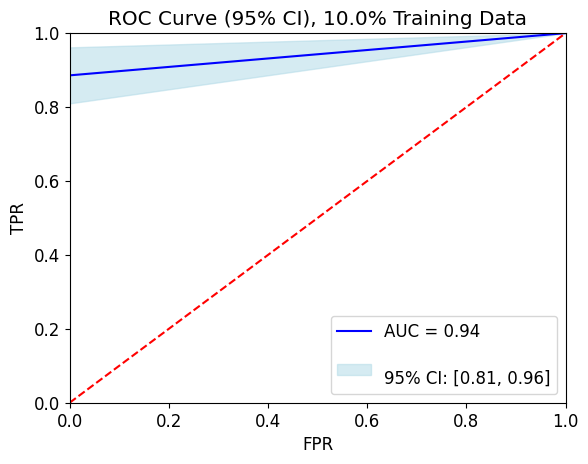

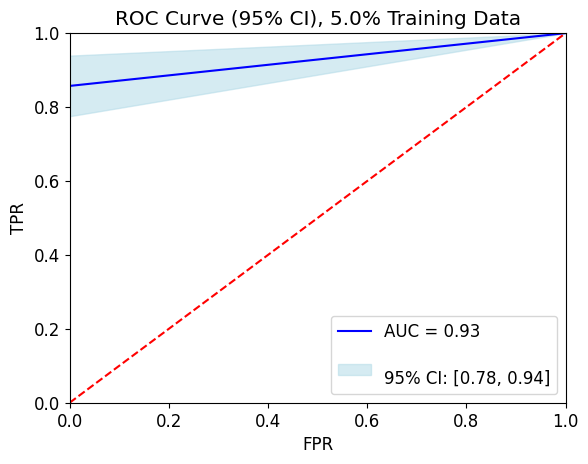

In [76]:
evaluate_ROC(train_set, y_test, pred_LR)

### Confusion Matrix for Logistic Regression

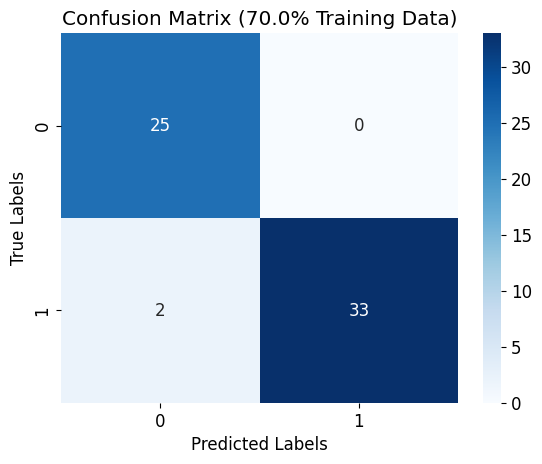

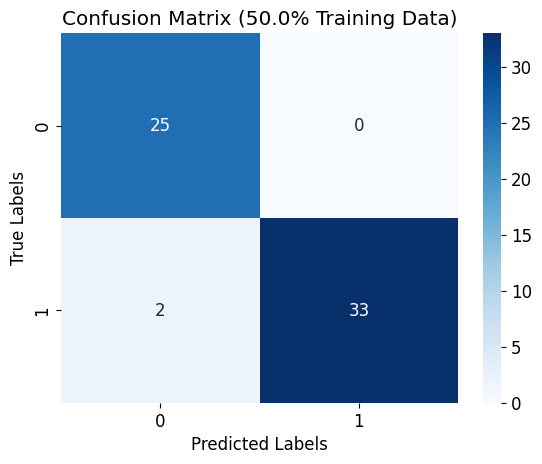

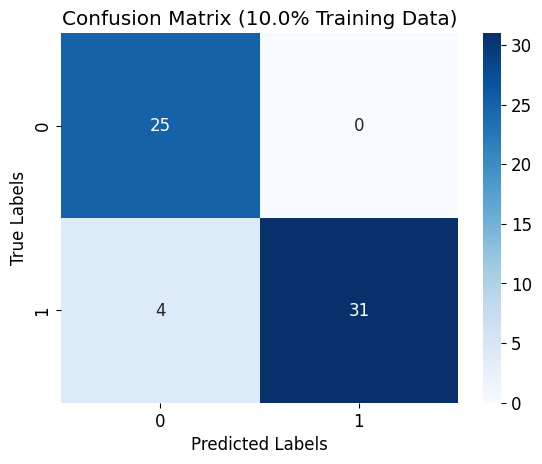

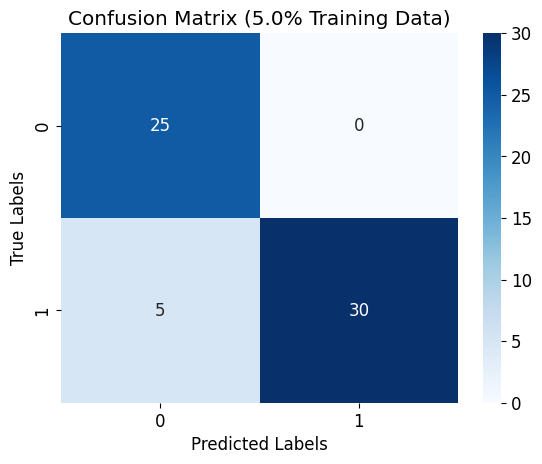

In [77]:
evaluate_con_mat(train_set, y_test, pred_LR)

In [78]:
del acc_LR, pred_LR, train_data, pred_proba_LR, best_params, clf_LR

## Random Forest

### Random Forest without hyperparameter tuning

In [79]:
eval_mod=evaluate_model(RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10), train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.983333 with 70.0% training records
Accuracy score(RandomForestClassifier model): 0.983333 with 50.0% training records
Accuracy score(RandomForestClassifier model): 0.933333 with 10.0% training records
Accuracy score(RandomForestClassifier model): 0.583333 with 5.0% training records


In [80]:
#==============================Hyperparameter  Tuning======================================
clf_RF = RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=clf_RF, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 300}


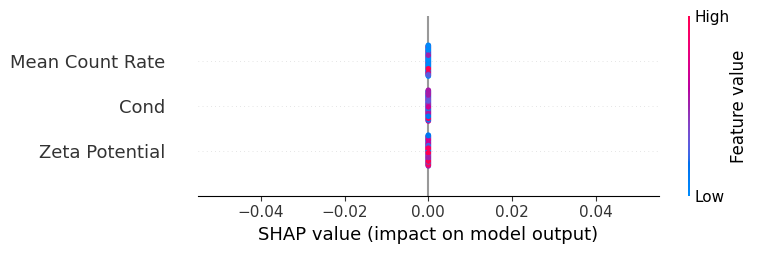

In [83]:
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_norm = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
explainer_rf = shap.Explainer(grid_search.best_estimator_, X_train_norm)
shap_values_rf = explainer_rf(X_test_norm)
shap_values_class_1 = shap_values_rf.values[..., 1]
shap.summary_plot(shap_values_class_1, X_test_norm)

### Random Forest with hyperparameter tuning

In [84]:
#==============================Random Forest Model with Hyperparameter Tuning===========================
acc_RF, pred_RF, train_data, pred_proba_RF = evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.983333 with 70.0% training records
Accuracy score(RandomForestClassifier model): 0.983333 with 50.0% training records
Accuracy score(RandomForestClassifier model): 0.616667 with 10.0% training records
Accuracy score(RandomForestClassifier model): 0.583333 with 5.0% training records


### Learning Curve for Random Forest

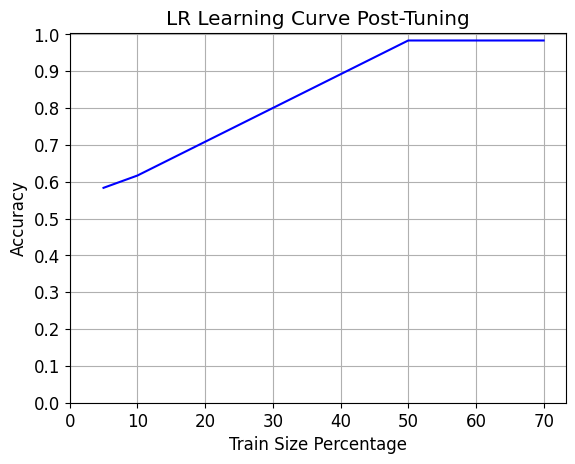

In [85]:
#===============================Learning Curve for Random Forest===========================================
plt.plot(training_sample,acc_RF, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Random Forest

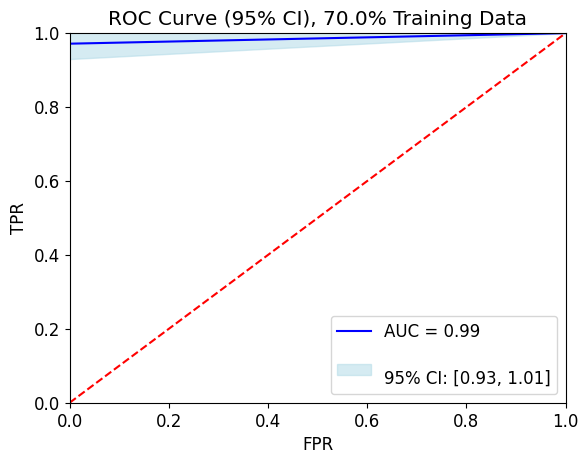

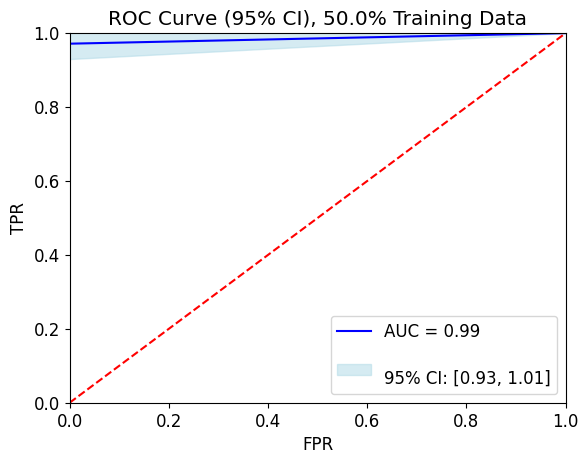

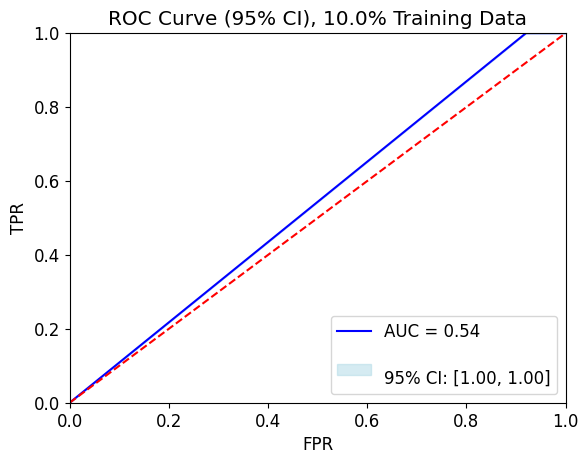

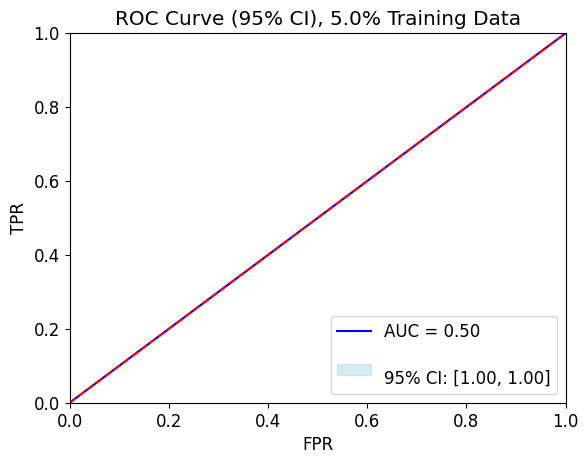

In [86]:
evaluate_ROC(train_set, y_test, pred_RF)

### Confusion Matrix for Random Forest

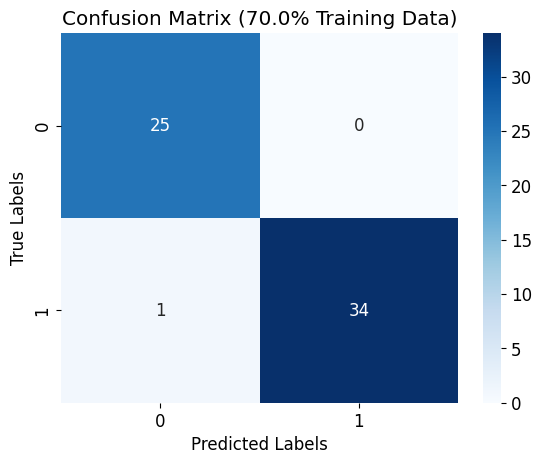

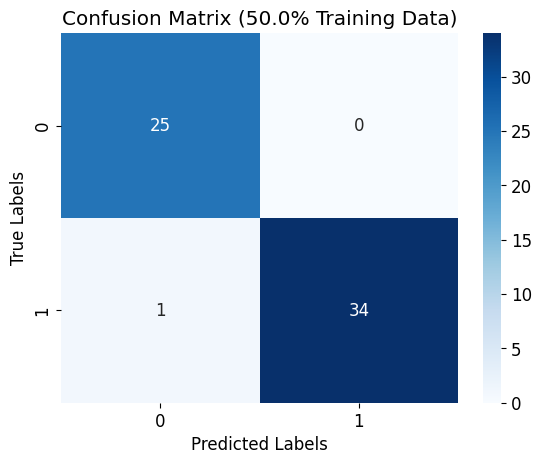

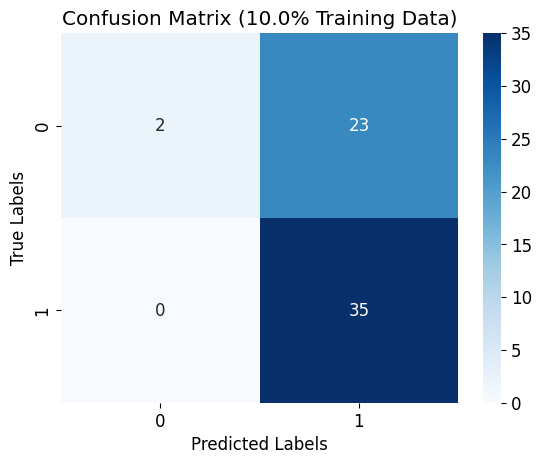

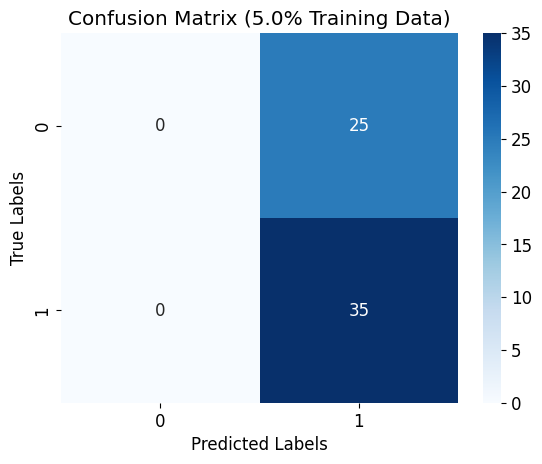

In [87]:
evaluate_con_mat(train_set, y_test, pred_RF)

In [88]:
del  acc_RF, pred_RF, train_data, pred_proba_RF, best_params, clf_RF

## Support Vector Classifier

### Support Vector Classifier without hyperparameter tuning

In [89]:
eval_mod=evaluate_model(SVC(kernel='sigmoid', probability=True, C = 100, gamma='auto'), train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.416667 with 70.0% training records
Accuracy score(SVC model): 0.583333 with 50.0% training records
Accuracy score(SVC model): 0.583333 with 10.0% training records
Accuracy score(SVC model): 0.583333 with 5.0% training records


In [90]:
#==========================Hyperparameter Tuning==========================
clf_SVM = SVC(probability=True)
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': [0.01, 0.1]
}
grid_search = GridSearchCV(estimator=clf_SVM, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear'}


Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/60 [00:00<?, ?it/s]

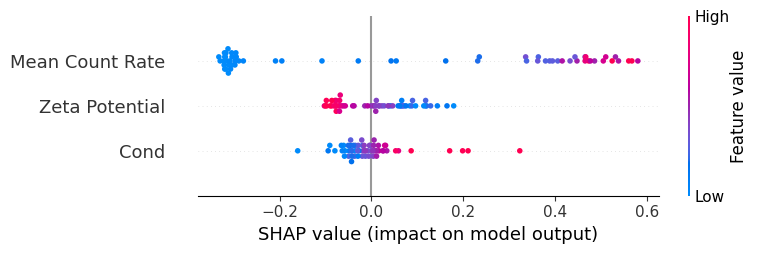

In [91]:
best_model = grid_search.best_estimator_
explainer_svc = shap.KernelExplainer(best_model.predict_proba, X_train)
shap_values_svc = explainer_svc(X_test)
shap_values_svc_class_1 = shap_values_svc.values[..., 1]
shap.summary_plot(shap_values_svc_class_1, X_test)

### Support Vector Classifier with hyperparameter tuning

In [92]:
acc_SVC, pred_SVC, train_data, pred_proba_SVC=evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.950000 with 70.0% training records
Accuracy score(SVC model): 0.966667 with 50.0% training records
Accuracy score(SVC model): 0.933333 with 10.0% training records
Accuracy score(SVC model): 0.916667 with 5.0% training records


### Learning Curve for Support Vector Classifier

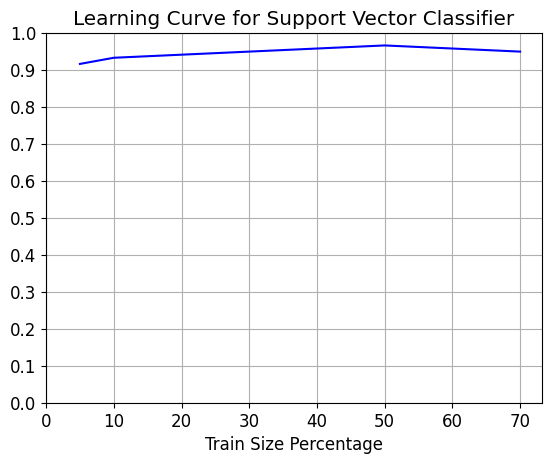

In [93]:
#===============================Learning Curve for SVC===========================================
plt.plot(training_sample,acc_SVC, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for Support Vector Classifier')
plt.show()

### ROC Curve for Support Vector Classifier

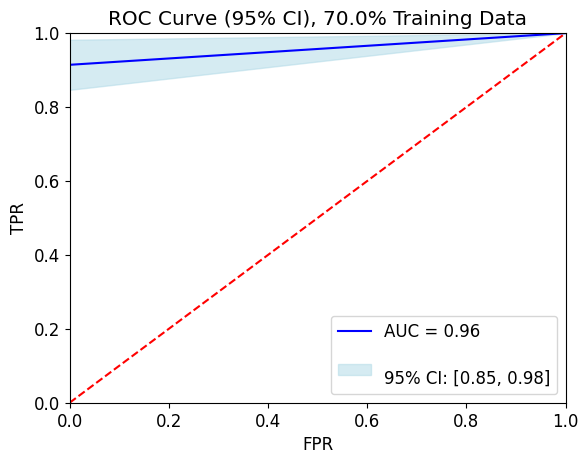

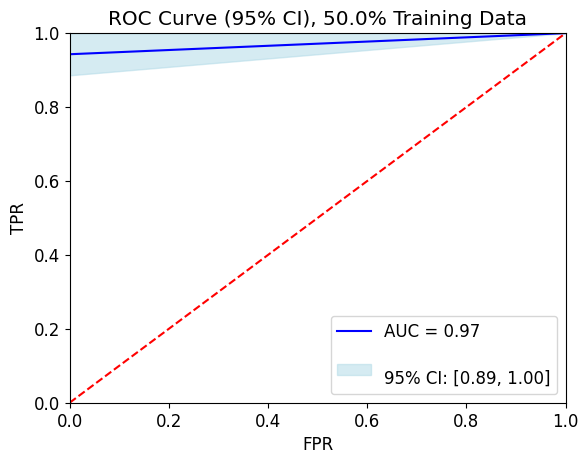

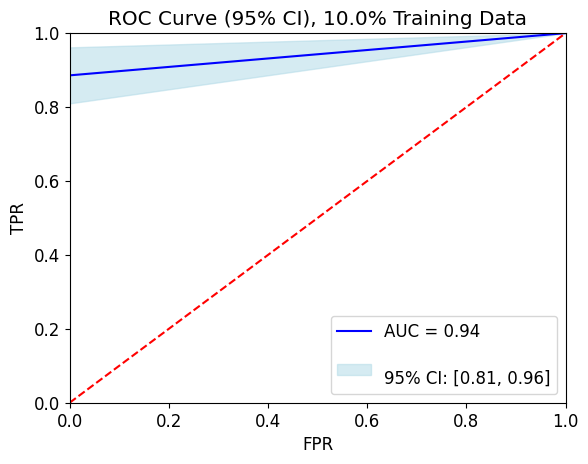

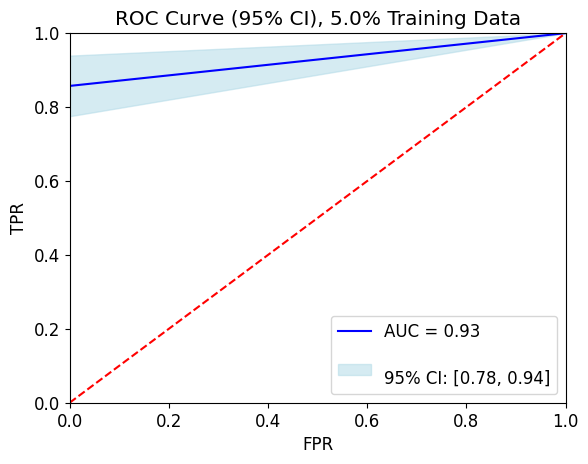

In [94]:
evaluate_ROC(train_set, y_test, pred_SVC)

### Confusion Matrix for Support Vector Classifier

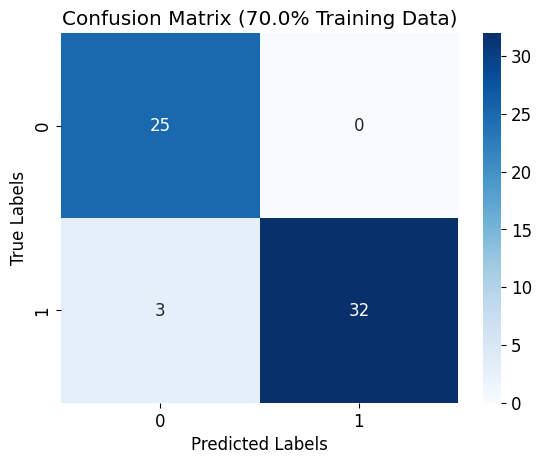

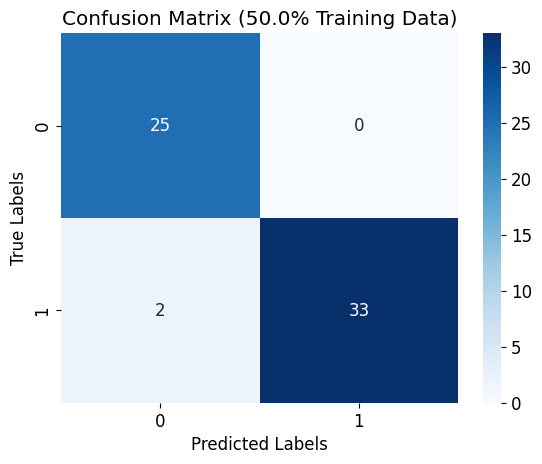

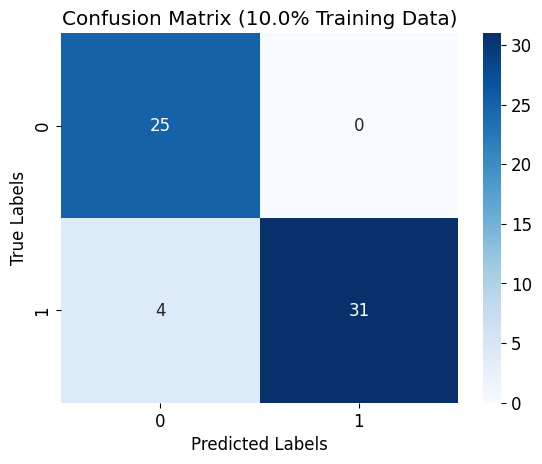

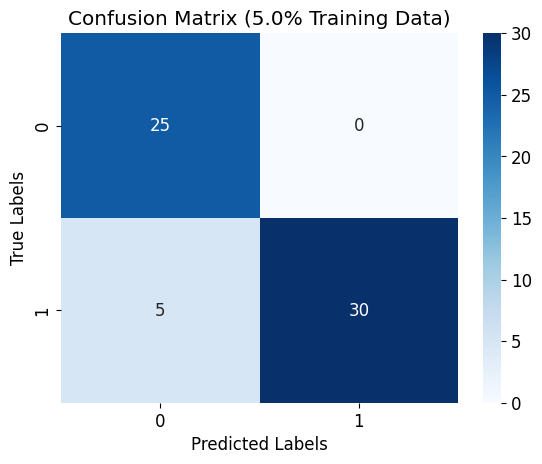

In [95]:
evaluate_con_mat(train_set, y_test, pred_SVC)

In [96]:
del acc_SVC, pred_SVC, train_data, pred_proba_SVC, best_params, clf_SVM

## Vector Quantum Classifier

In [48]:
#=====================Vector Quantum Classifier Model with different training sets================
train_features = MinMaxScaler().fit_transform(X_train)
train_labels = y_train
test_features = MinMaxScaler().fit_transform(X_test)
test_labels = y_test
num_features = train_features.shape[1]
feature_map = ZZFeatureMap(feature_dimension=num_features, reps=1)

In [50]:
del X_train, y_train

In [49]:
ansatz = EfficientSU2(num_qubits=num_features, reps=3)

In [58]:
optimizer = op.POWELL(maxiter=250)

In [59]:
sampler = Sampler()

### Vector Quantum Classifier with Hyperparameter Tuning

In [60]:
#======================================VQC=================================================
clf_vqc = VQC(
    sampler=sampler,
    feature_map=feature_map,
    ansatz=ansatz,
    loss = 'squared_error',
    optimizer=optimizer
)
acc_vqtask1 = []
pred_vqtask1 = []
for elm in train_set:
    vqc=copy.copy(clf_vqc)
    X_t, dummy_x, y_t, dummy_y = train_test_split(train_features, train_labels, train_size=elm, random_state=algorithm_globals.random_seed)
    vqc.fit(X_t, y_t.values)
    pred = vqc.predict(test_features)
    accuracy = accuracy_score(test_labels.values, pred)
    pred_vqtask1.append(pred)
    acc_vqtask1.append(accuracy)
    print(f'Accuracy score(VQC Model): {accuracy} with {elm*100}% training records')
#======================================VQC=================================================

Accuracy score(VQC Model): 0.85 with 70.0% training records
Accuracy score(VQC Model): 0.95 with 50.0% training records
Accuracy score(VQC Model): 0.95 with 10.0% training records
Accuracy score(VQC Model): 0.85 with 5.0% training records


## Learning Curve for VQC

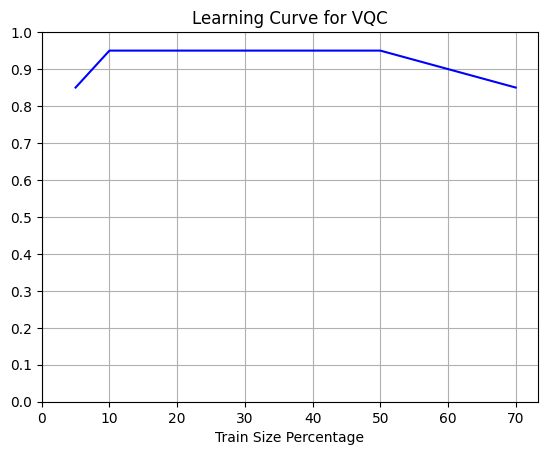

In [61]:
#===============================Learning Curve for VQC===========================================
plt.plot(training_sample,acc_vqtask1, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for VQC')
plt.show()

### 3D Scatter Plot for VQC Model

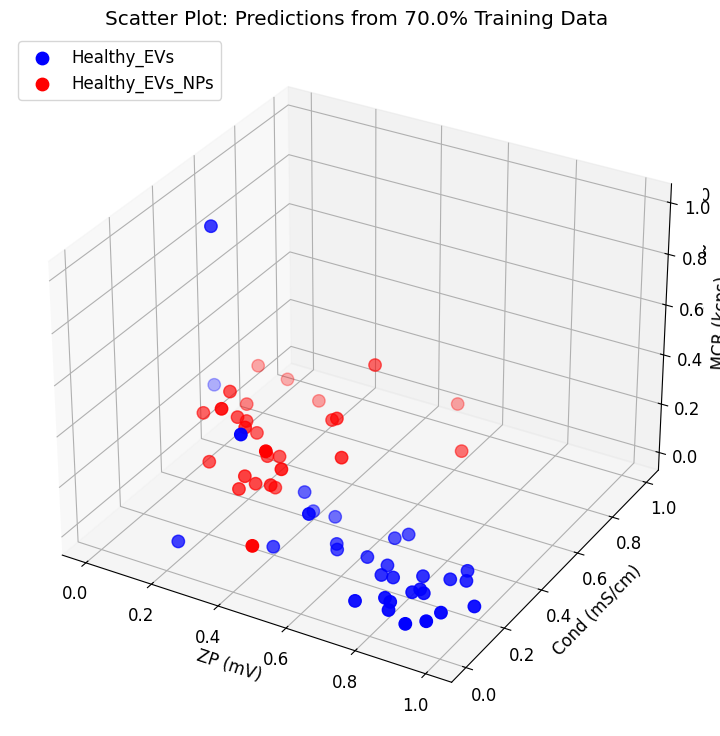

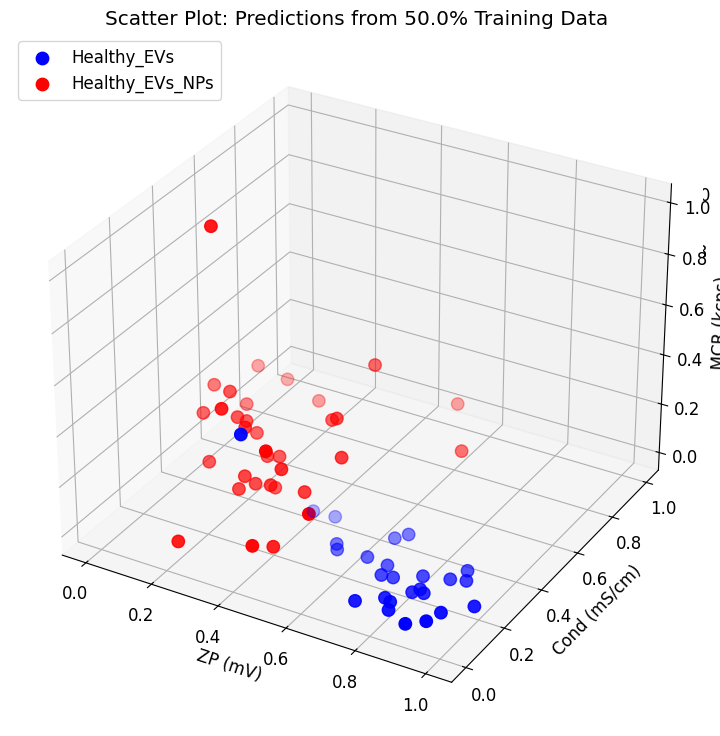

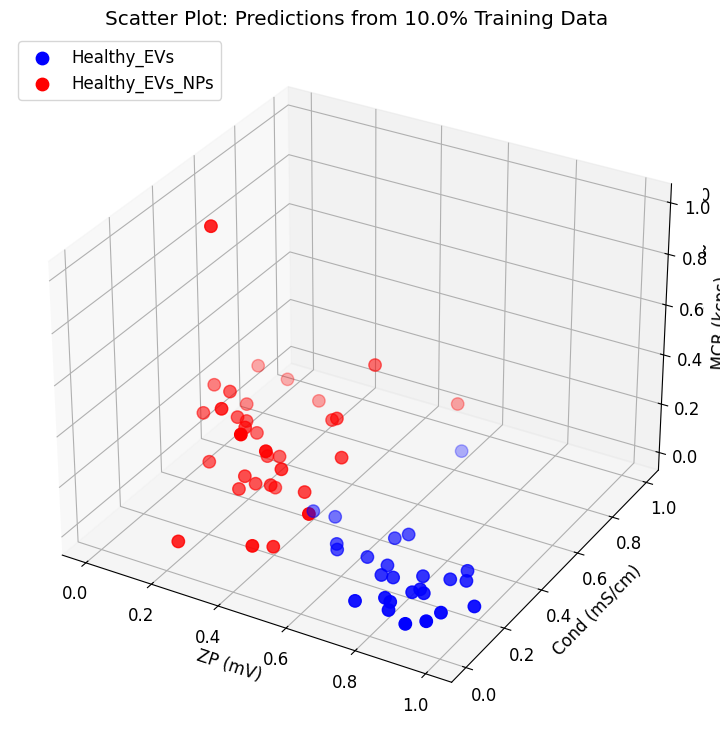

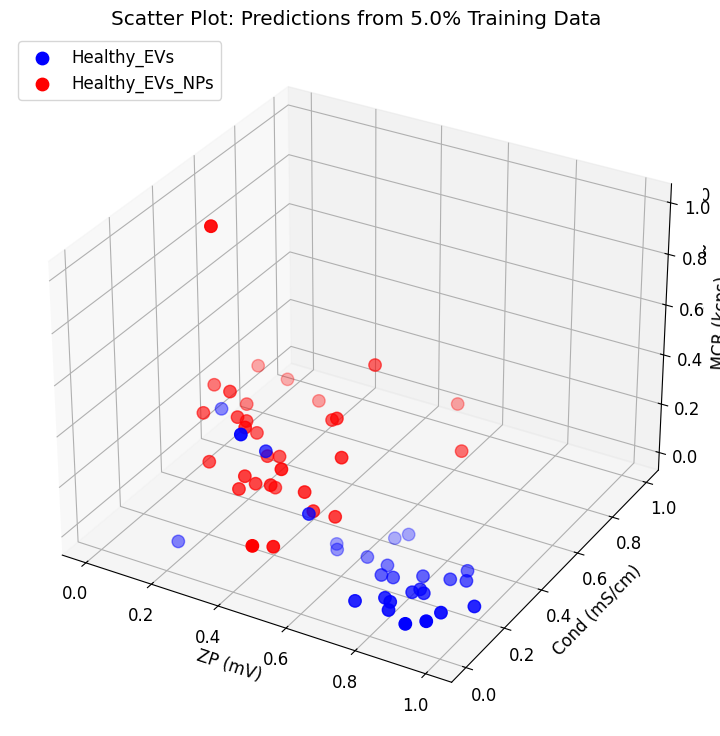

In [63]:
#=======================================3D Scatter Plot===============================
for i in range(len(train_set)):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(9,9))
    ax = plt.subplot(1,1,1,projection='3d')
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(test_features[pred_vqtask1[i]==0,0], test_features[pred_vqtask1[i]==0,1], test_features[pred_vqtask1[i]==0,2], c='blue', marker='o', label='Healthy_EVs', s=80)
    ax.scatter(test_features[pred_vqtask1[i]==1,0], test_features[pred_vqtask1[i]==1,1], test_features[pred_vqtask1[i]==1,2], c='red', marker='o', label='Healthy_EVs_NPs',s=80)
  # Set labels for each axis
    ax.set_xlabel('ZP (mV)')
    ax.set_ylabel('Cond (mS/cm)')
    ax.set_zlabel('MCR (kcps)')
    ax.set_title(f'Scatter Plot: Predictions from {train_set[i]*100}% Training Data')
    ax.tick_params("z", which="major",length=15,width = 2.0)
    ax.legend(loc='upper left')
    plt.show()

### ROC Curve for Vector Quantum Classifier

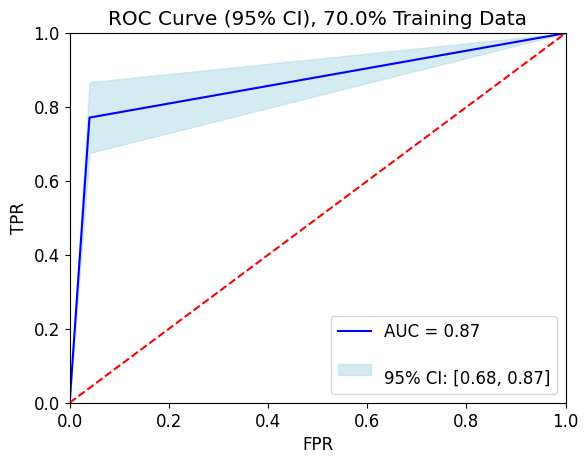

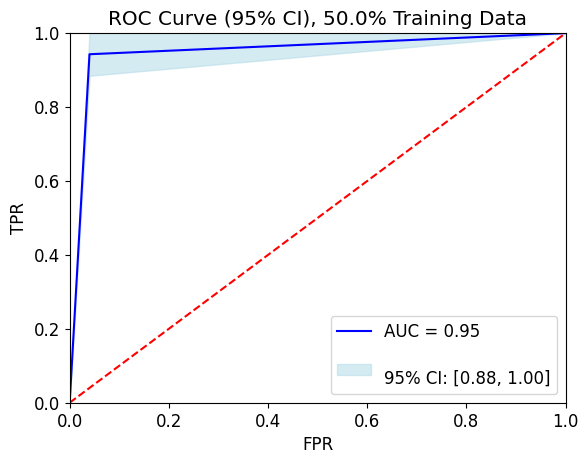

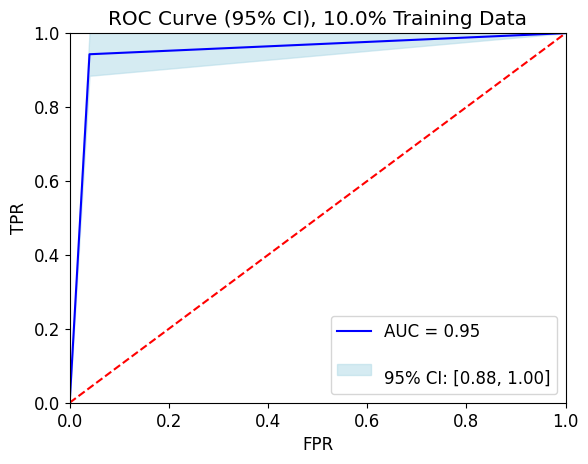

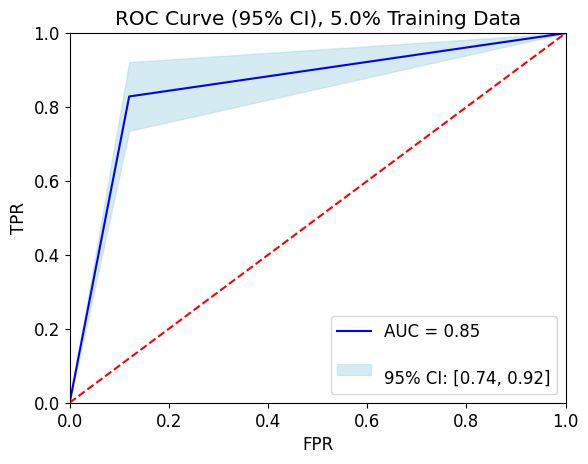

In [64]:
evaluate_ROC(train_set, test_labels, pred_vqtask1)

### Confusion Matrix for Vector Quantum Classifier

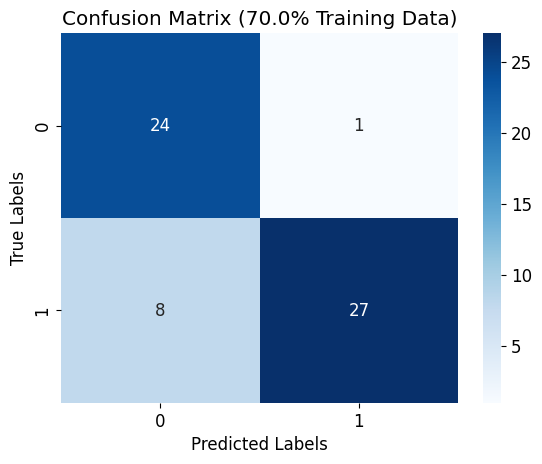

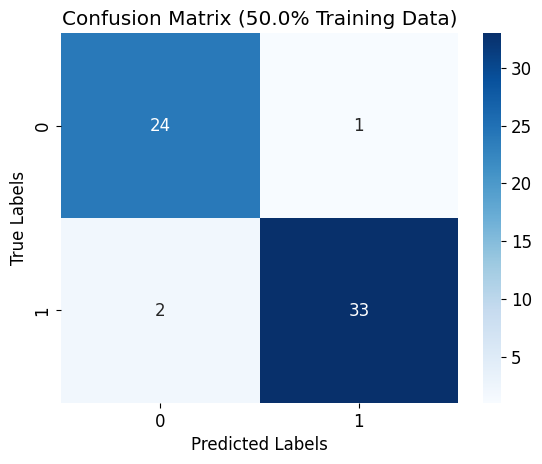

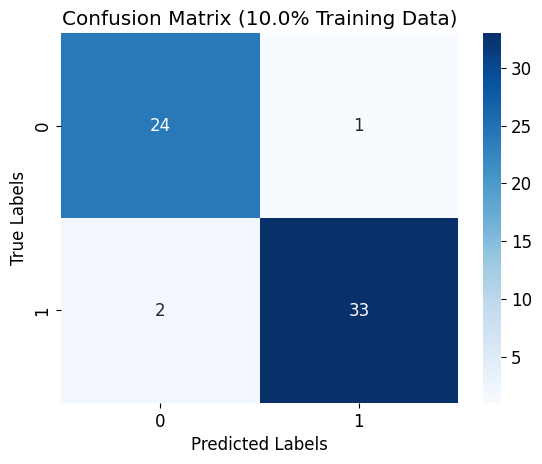

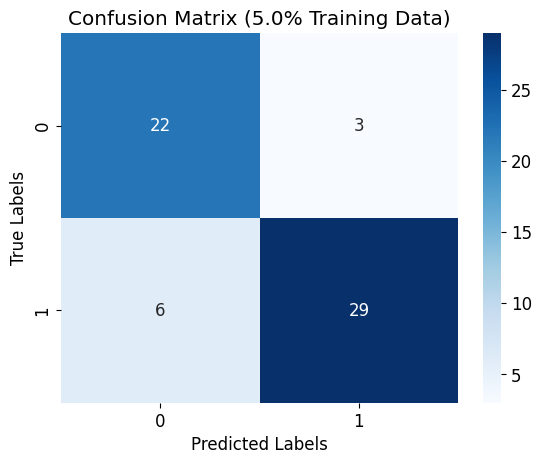

In [65]:
evaluate_con_mat(train_set, test_labels, pred_vqtask1)

# <center><h1><b>Task 3 (Cancer_EVs vs Cancer_EVs_NPs)</b></h1></center>

In [47]:
#==================Predictor Variables for dataset 3===================================
X = dataset3[['Zeta Potential', 'Cond', 'Mean Count Rate']]
#X = dataset.drop(['Grade','Age_in_years'], axis = 1)
#===================Output Variable========================================
y = dataset3['Sample Name']
y = y.map(lambda x: 1 if x == 2 else 0)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=algorithm_globals.random_seed)

## Logistic Regression

### Logistic Regression without hyperparameter tuning

In [48]:
#=====================Logistic Regression Model with different training sets================
eval_mod=evaluate_model(LogisticRegression(solver='lbfgs', max_iter=1000), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.950000 with 70.0% training records
Accuracy score(LogisticRegression model): 0.933333 with 50.0% training records
Accuracy score(LogisticRegression model): 0.966667 with 10.0% training records
Accuracy score(LogisticRegression model): 0.966667 with 5.0% training records


In [49]:
#===============================Hyperparameter Tuning================================
import warnings
from sklearn.exceptions import ConvergenceWarning
# Supressing Warning related to convergence
warnings.filterwarnings("ignore", category=ConvergenceWarning)

clf_LR = LogisticRegression(solver = 'lbfgs', max_iter=1000)
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],'penalty': ['l2'], 'solver': ['newton-cg','lbfgs' ,'liblinear', 'saga']}
grid_search = GridSearchCV(clf_LR, param_grid, cv=10, verbose=0 ,scoring='accuracy')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}


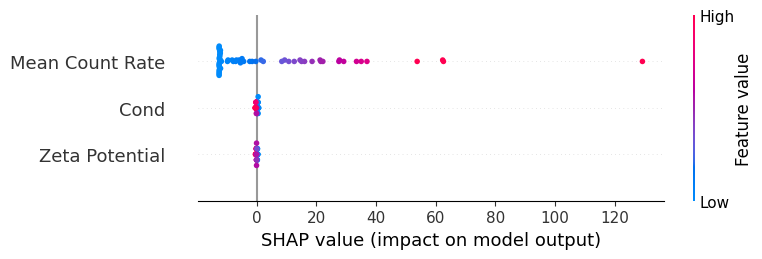

In [50]:
best_model = grid_search.best_estimator_
# Use SHAP's LinearExplainer with the best model
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    explainer = shap.LinearExplainer(best_model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

### Logistic Regression with hyperparameter tuning

In [51]:
#==============================Logistic Regression Model with Hyperparameter Tuning===========================
acc_LR, pred_LR, train_data, pred_proba_LR = evaluate_model(LogisticRegression(solver = best_params['solver'], penalty=best_params['penalty'], C = best_params['C']), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.966667 with 70.0% training records
Accuracy score(LogisticRegression model): 0.966667 with 50.0% training records
Accuracy score(LogisticRegression model): 0.966667 with 10.0% training records
Accuracy score(LogisticRegression model): 0.966667 with 5.0% training records


### Learning Curve for Logistic Regression

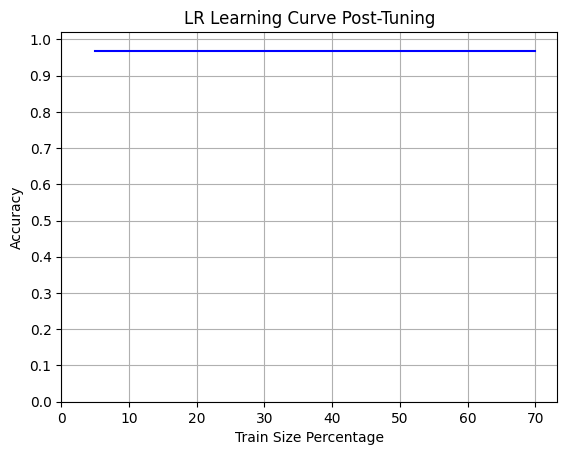

In [52]:
#===============================Learning Curve for LR===========================================
plt.plot(training_sample,acc_LR, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Logistic Regression

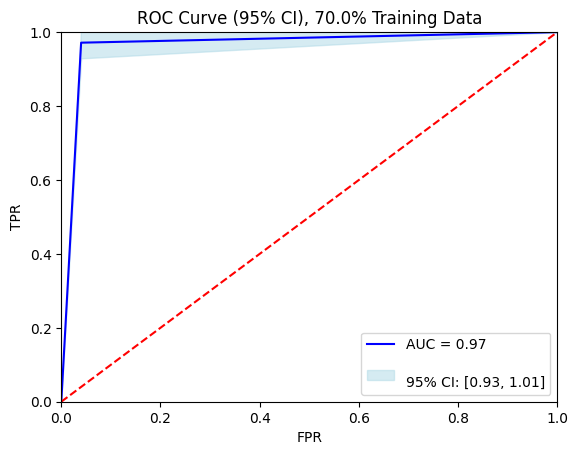

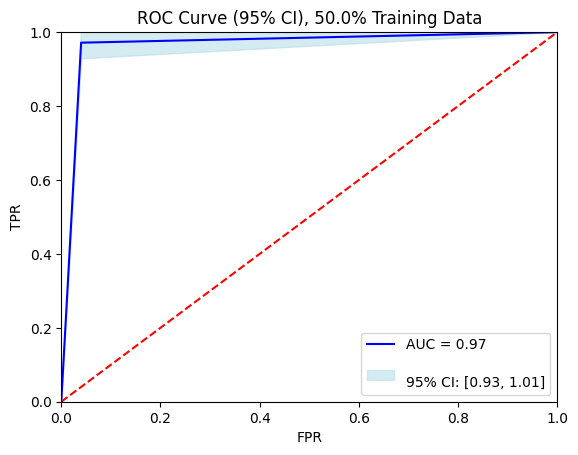

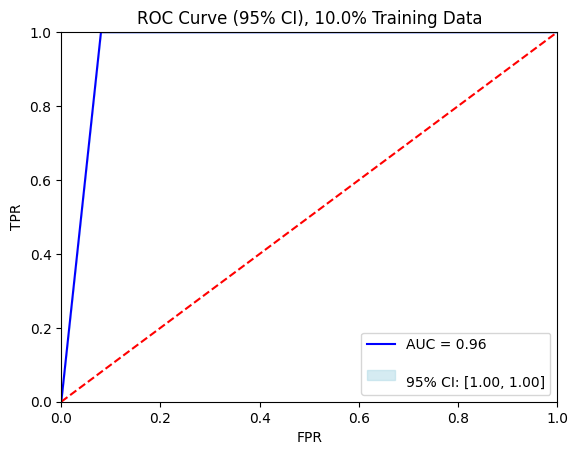

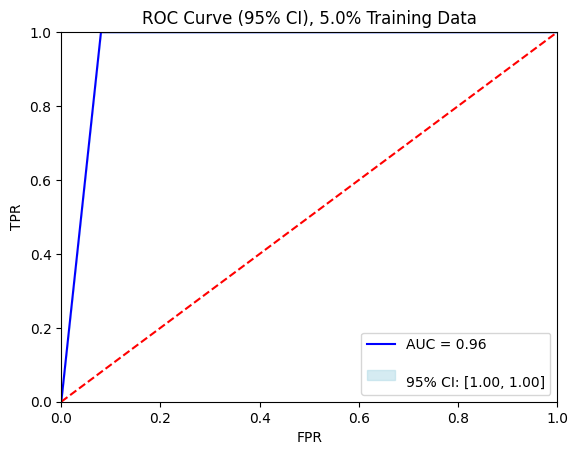

In [53]:
evaluate_ROC(train_set, y_test, pred_LR)

### Confusion Matrix for Logistic Regression

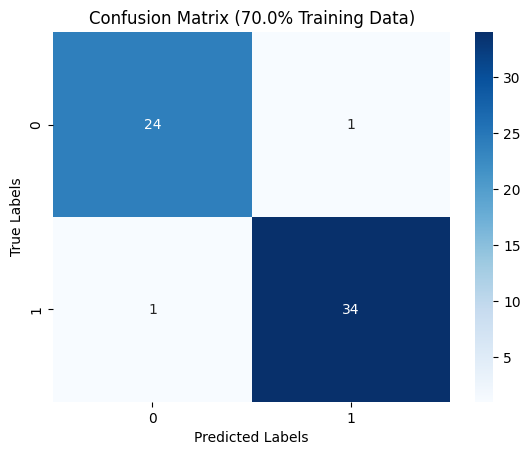

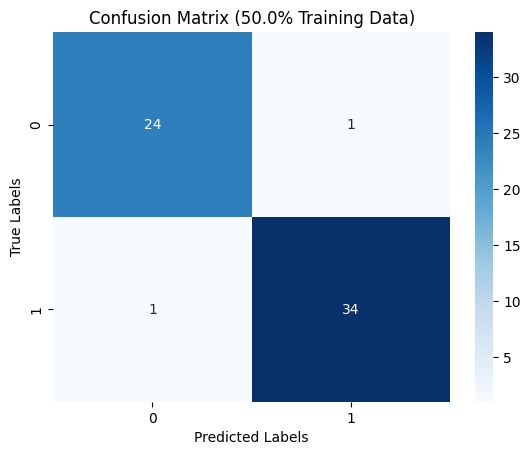

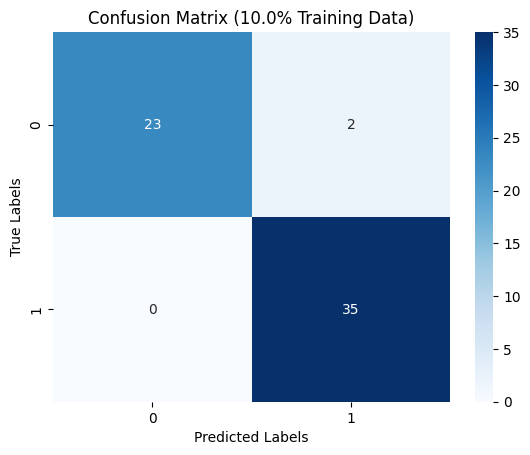

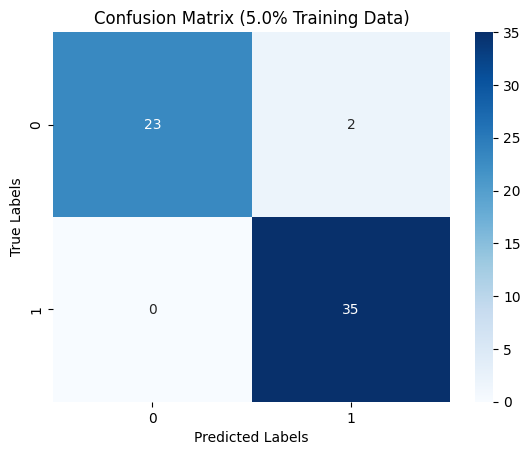

In [54]:
evaluate_con_mat(train_set, y_test, pred_LR)

In [55]:
del acc_LR, pred_LR, train_data, pred_proba_LR, best_params, clf_LR

## Random Forest

### Random Forest without hyperparameter tuning

In [56]:
eval_mod=evaluate_model(RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10), train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.983333 with 70.0% training records
Accuracy score(RandomForestClassifier model): 1.000000 with 50.0% training records
Accuracy score(RandomForestClassifier model): 0.583333 with 10.0% training records
Accuracy score(RandomForestClassifier model): 0.583333 with 5.0% training records


In [57]:
#==============================Hyperparameter  Tuning======================================
clf_RF = RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=clf_RF, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}


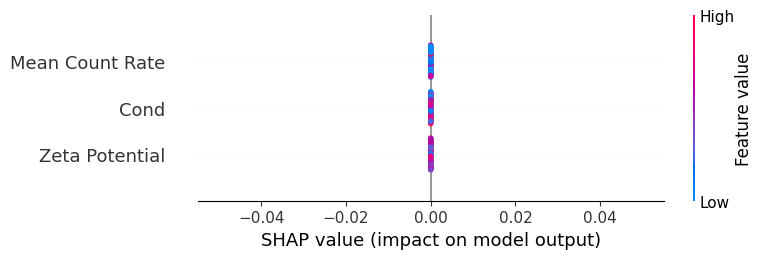

In [58]:
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_norm = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
explainer_rf = shap.Explainer(grid_search.best_estimator_, X_train_norm)
shap_values_rf = explainer_rf(X_test_norm)
shap_values_class_1 = shap_values_rf.values[..., 1]
shap.summary_plot(shap_values_class_1, X_test_norm)

### Random Forest with hyperparameter tuning

In [59]:
#==============================Random Forest Model with Hyperparameter Tuning===========================
acc_RF, pred_RF, train_data, pred_proba_RF = evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 1.000000 with 70.0% training records
Accuracy score(RandomForestClassifier model): 1.000000 with 50.0% training records
Accuracy score(RandomForestClassifier model): 0.966667 with 10.0% training records
Accuracy score(RandomForestClassifier model): 0.866667 with 5.0% training records


### Learning Curve for Random Forest

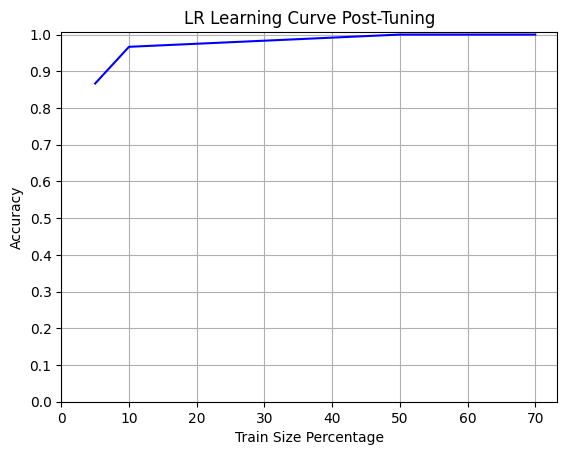

In [60]:
#===============================Learning Curve for Random Forest===========================================
plt.plot(training_sample,acc_RF, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Random Forest

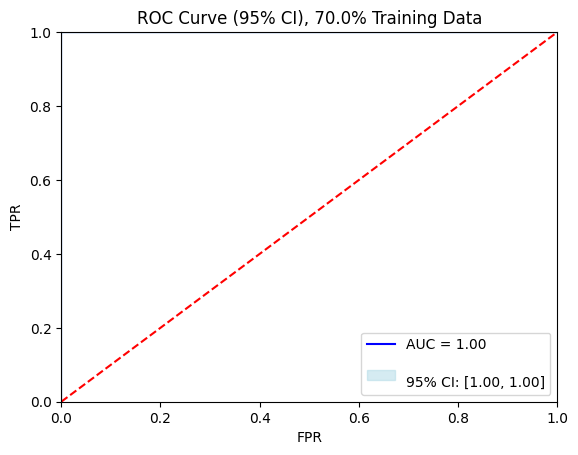

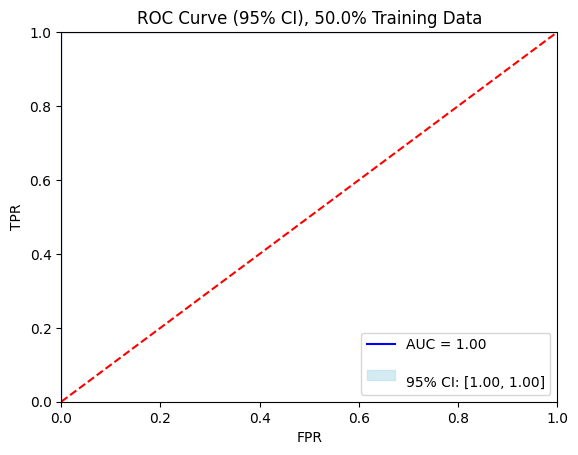

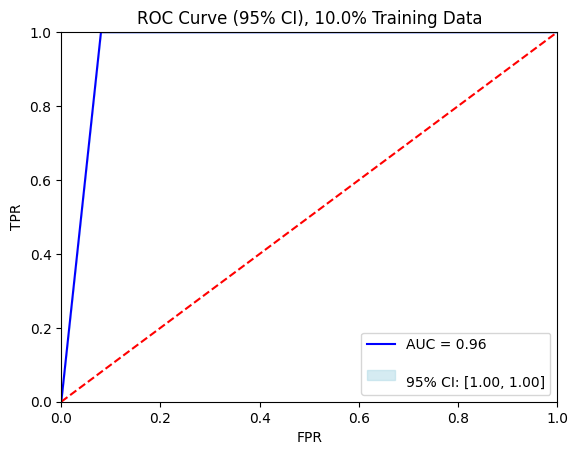

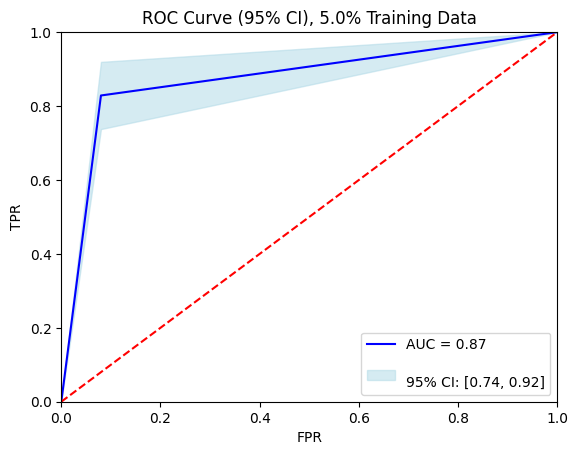

In [61]:
evaluate_ROC(train_set, y_test, pred_RF)

### Confusion Matrix for Random Forest

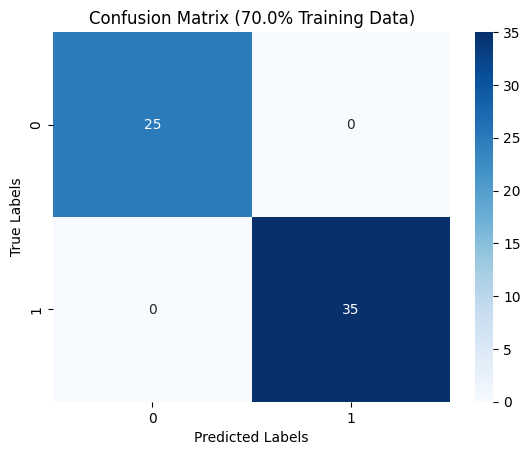

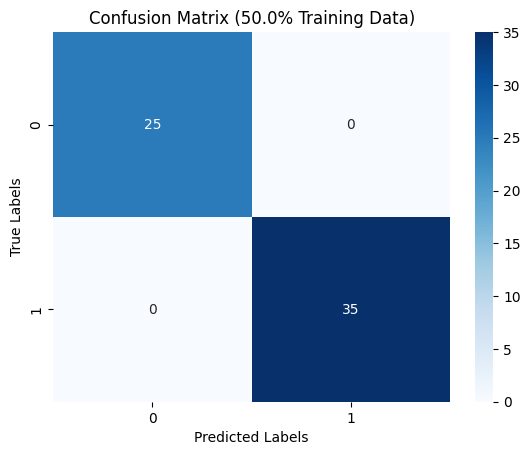

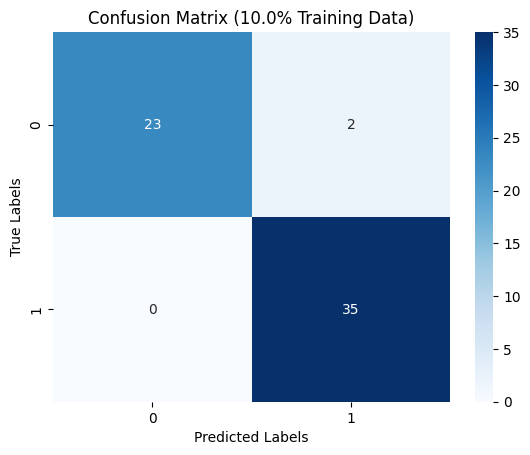

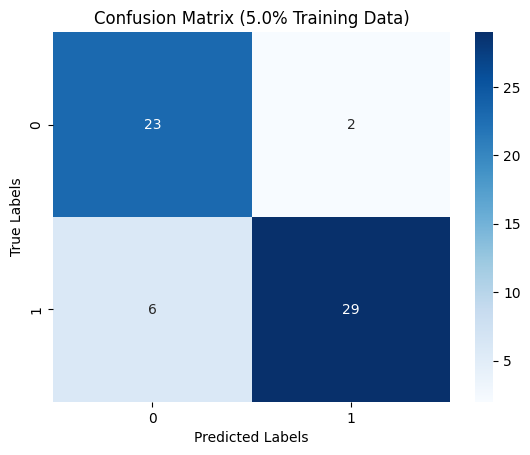

In [62]:
evaluate_con_mat(train_set, y_test, pred_RF)

In [63]:
del acc_RF, pred_RF, train_data, pred_proba_RF, best_params, clf_RF

## Support Vector Classifier

### Support Vector Classifier without hyperparameter tuning

In [64]:
eval_mod=evaluate_model(SVC(kernel='sigmoid', probability=True, C = 100, gamma='auto'), train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.416667 with 70.0% training records
Accuracy score(SVC model): 0.583333 with 50.0% training records
Accuracy score(SVC model): 0.583333 with 10.0% training records
Accuracy score(SVC model): 0.583333 with 5.0% training records


In [65]:
#==========================Hyperparameter Tuning==========================
clf_SVM = SVC(probability=True)
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': [0.01, 0.1]
}
grid_search = GridSearchCV(estimator=clf_SVM, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear'}


Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/60 [00:00<?, ?it/s]

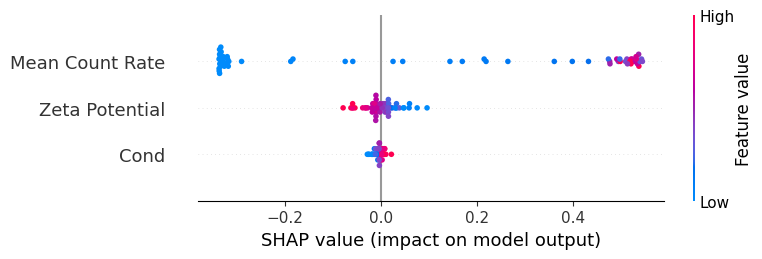

In [66]:
best_model = grid_search.best_estimator_
explainer_svc = shap.KernelExplainer(best_model.predict_proba, X_train)
shap_values_svc = explainer_svc(X_test)
shap_values_svc_class_1 = shap_values_svc.values[..., 1]
shap.summary_plot(shap_values_svc_class_1, X_test)

### Support Vector Classifier with hyperparameter tuning

In [67]:
acc_SVC, pred_SVC, train_data, pred_proba_SVC=evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.966667 with 70.0% training records
Accuracy score(SVC model): 0.950000 with 50.0% training records
Accuracy score(SVC model): 0.966667 with 10.0% training records
Accuracy score(SVC model): 0.966667 with 5.0% training records


### Learning Curve for Support Vector Classifier

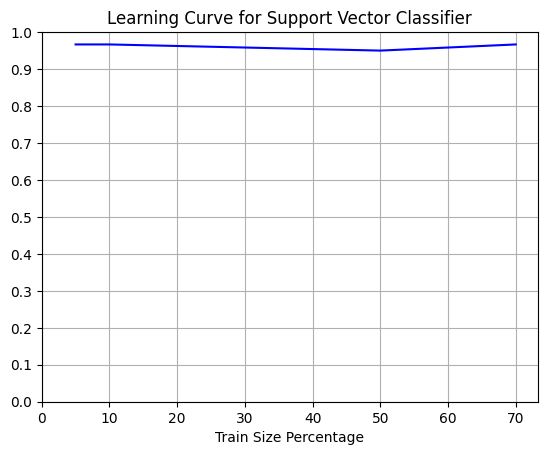

In [68]:
#===============================Learning Curve for SVC===========================================
plt.plot(training_sample,acc_SVC, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for Support Vector Classifier')
plt.show()

### ROC Curve for Support Vector Classifier

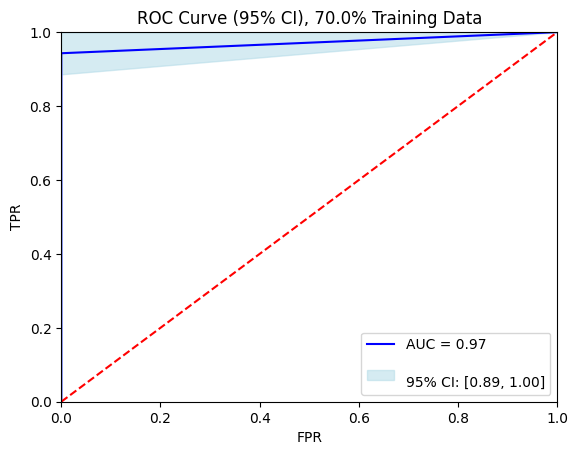

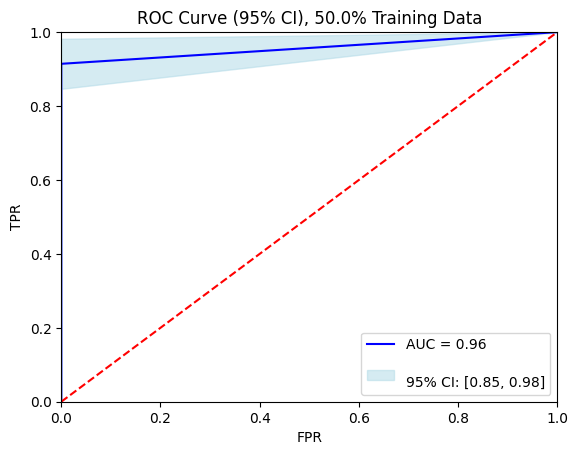

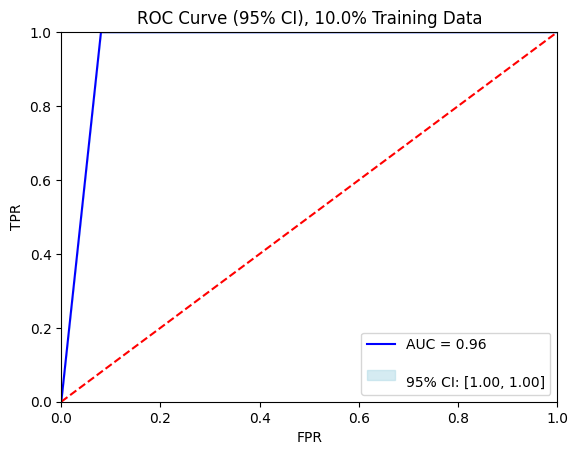

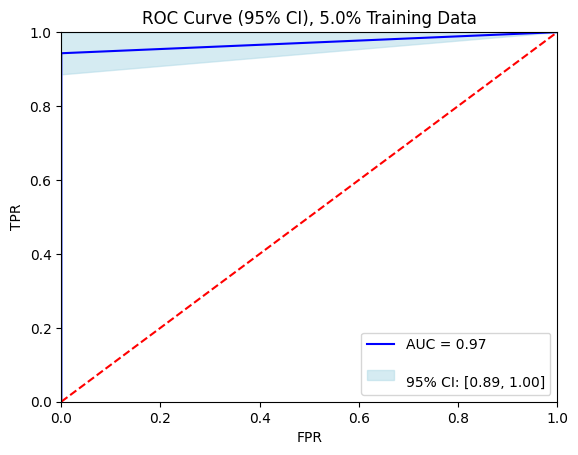

In [69]:
evaluate_ROC(train_set, y_test, pred_SVC)

### Confusion Matrix for Support Vector Classifier

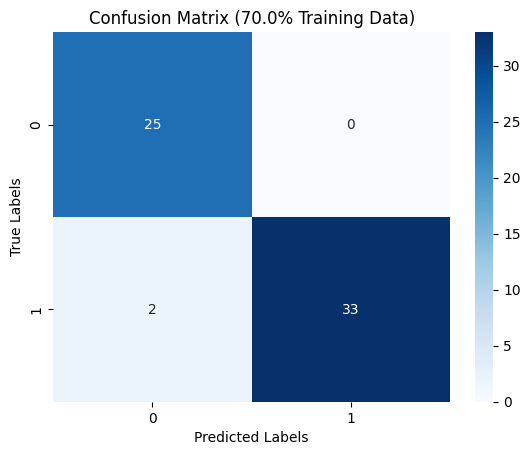

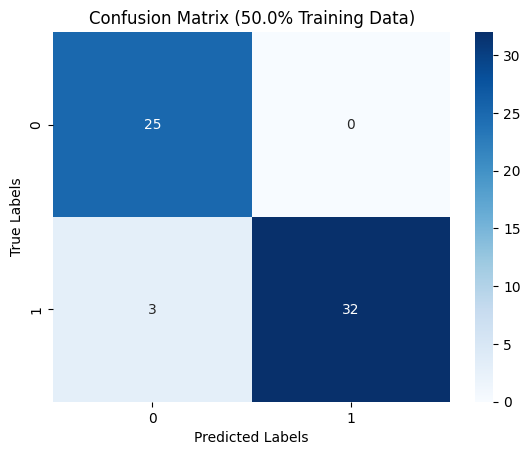

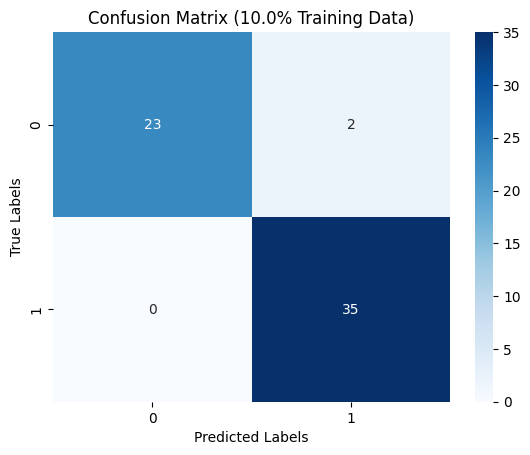

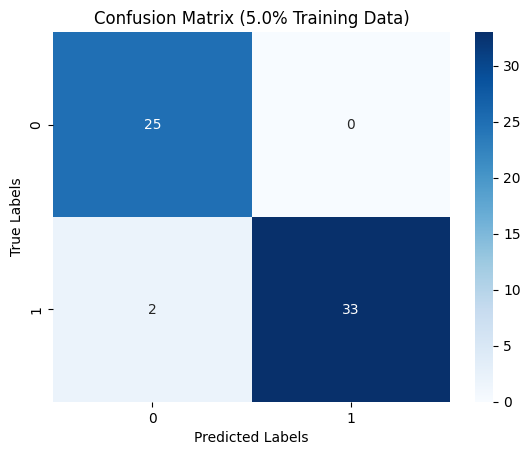

In [70]:
evaluate_con_mat(train_set, y_test, pred_SVC)

In [71]:
del acc_SVC, pred_SVC, train_data, pred_proba_SVC, best_params, clf_SVM

## Vector Quantum Classifier

In [74]:
#=====================Vector Quantum Classifier Model with different training sets================
train_features = MinMaxScaler().fit_transform(X_train)
train_labels = y_train
test_features = MinMaxScaler().fit_transform(X_test)
test_labels = y_test
num_features = train_features.shape[1] 
feature_map = PauliFeatureMap(feature_dimension=num_features, reps=2, paulis=['X', 'Z'])

In [75]:
del X_train, y_train

In [76]:
ansatz = EfficientSU2(num_qubits=num_features, reps=3)

In [77]:
optimizer = op.SPSA(maxiter=350)

In [78]:
sampler = Sampler()

### Vector Quantum Classifier with Hyperparameter Tuning

In [80]:
# #======================================VQC=================================================
clf_vqc = VQC(
    sampler=sampler,
    feature_map=feature_map,
    ansatz=ansatz,
    loss = 'squared_error',
    optimizer=optimizer
)
acc_vqtask1 = []
pred_vqtask1 = []
for elm in train_set:
    vqc = copy.copy(clf_vqc)
    X_t, dummy_x, y_t, dummy_y = train_test_split(train_features, train_labels, train_size=elm, random_state=algorithm_globals.random_seed)
    vqc.fit(X_t, y_t.values)
    pred = vqc.predict(test_features)
    accuracy = accuracy_score(test_labels.values, pred)
    pred_vqtask1.append(pred)
    acc_vqtask1.append(accuracy)
    print(f'Accuracy score(VQC Model): {accuracy} with {elm*100}% training records')
# #======================================VQC=================================================

Accuracy score(VQC Model): 0.85 with 70.0% training records
Accuracy score(VQC Model): 0.7666666666666667 with 50.0% training records
Accuracy score(VQC Model): 0.85 with 10.0% training records
Accuracy score(VQC Model): 0.7333333333333333 with 5.0% training records


## Learning Curve for VQC

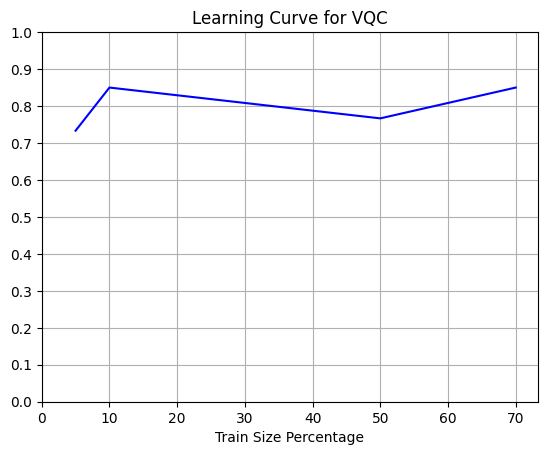

In [81]:
#===============================Learning Curve for VQC===========================================
plt.plot(training_sample,acc_vqtask1, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for VQC')
plt.show()

### 3D Scatter Plot for VQC Model

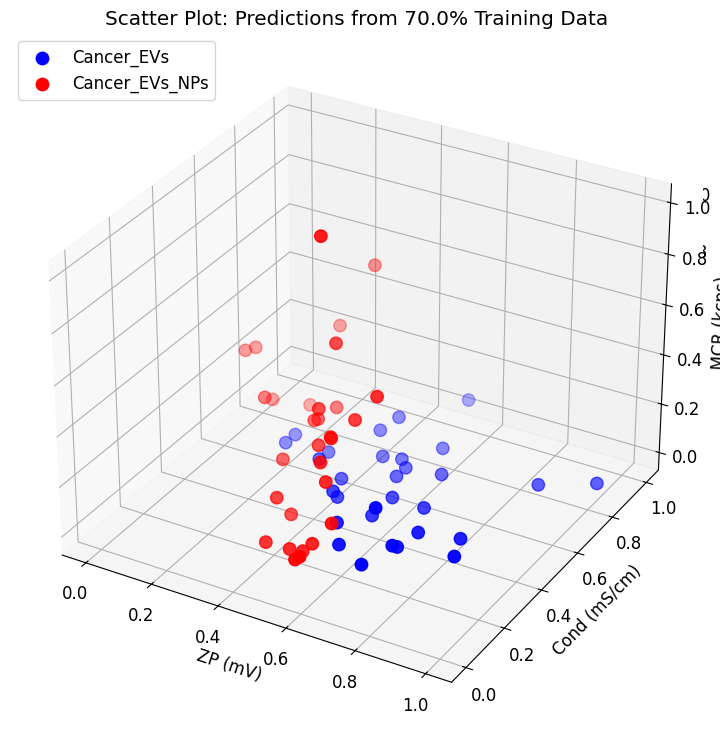

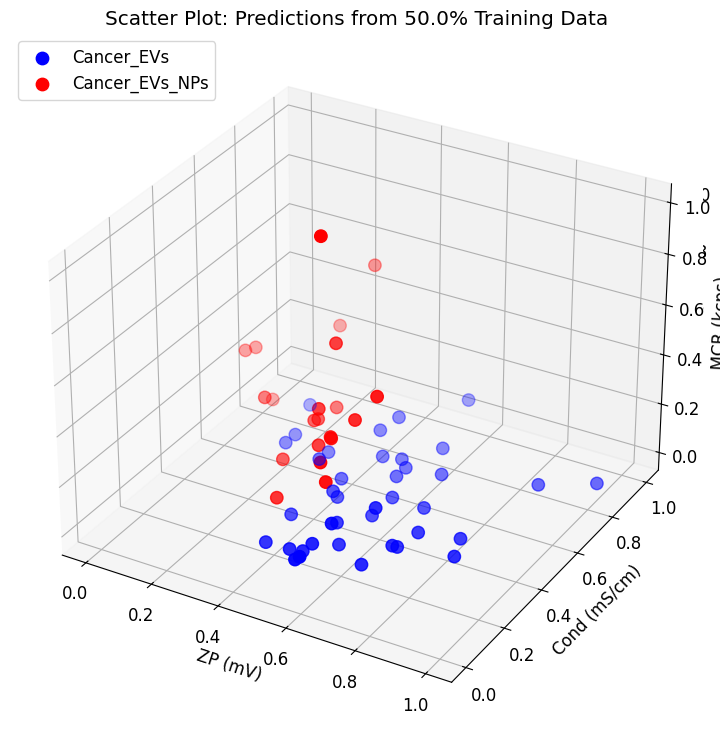

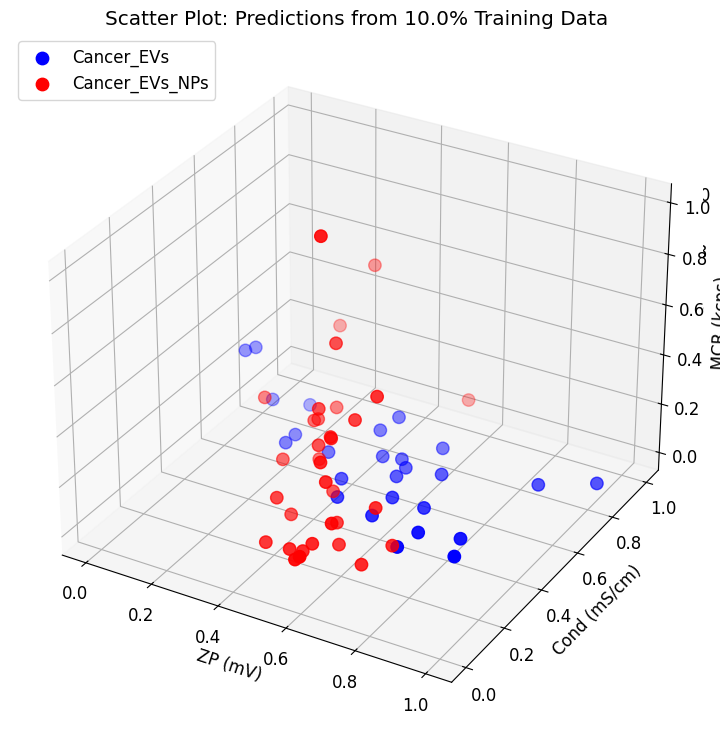

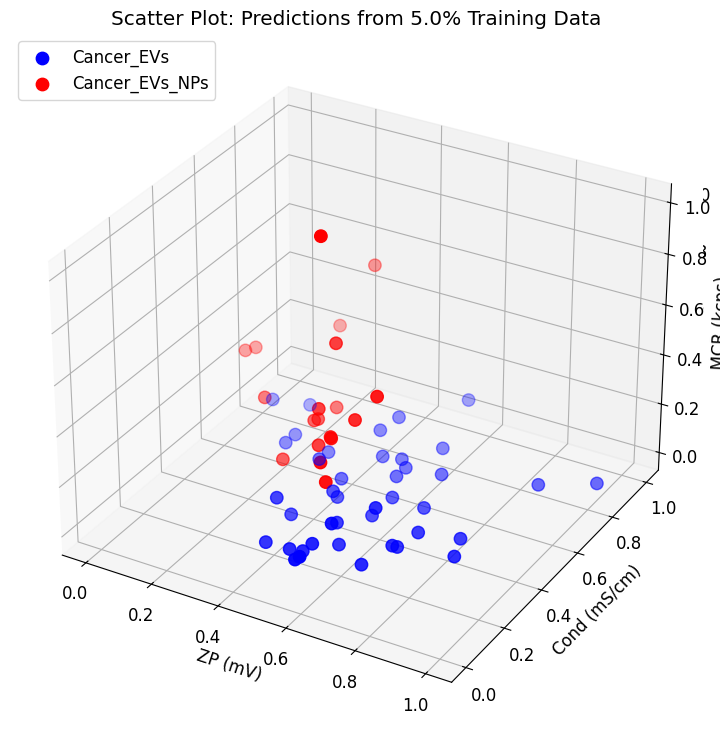

In [82]:
#=======================================3D Scatter Plot===============================
for i in range(len(train_set)):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(9,9))
    ax = plt.subplot(1,1,1,projection='3d')
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(test_features[pred_vqtask1[i]==0,0], test_features[pred_vqtask1[i]==0,1], test_features[pred_vqtask1[i]==0,2], c='blue', marker='o', label='Cancer_EVs', s=80)
    ax.scatter(test_features[pred_vqtask1[i]==1,0], test_features[pred_vqtask1[i]==1,1], test_features[pred_vqtask1[i]==1,2], c='red', marker='o', label='Cancer_EVs_NPs',s=80)
  # Set labels for each axis
    ax.set_xlabel('ZP (mV)')
    ax.set_ylabel('Cond (mS/cm)')
    ax.set_zlabel('MCR (kcps)')
    ax.set_title(f'Scatter Plot: Predictions from {train_set[i]*100}% Training Data')
    ax.tick_params("z", which="major",length=15,width = 2.0)
    ax.legend(loc='upper left')
    plt.show()

### ROC Curve for Vector Quantum Classifier

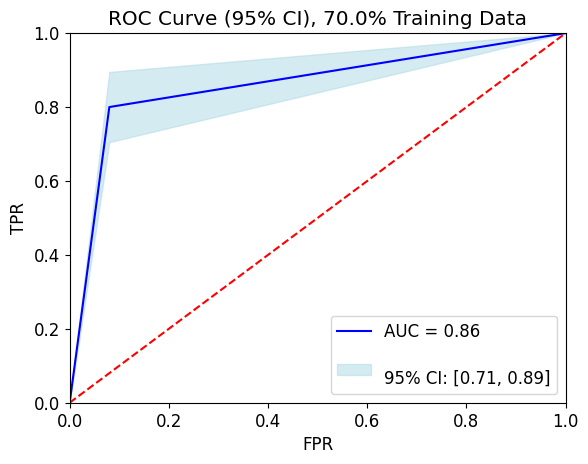

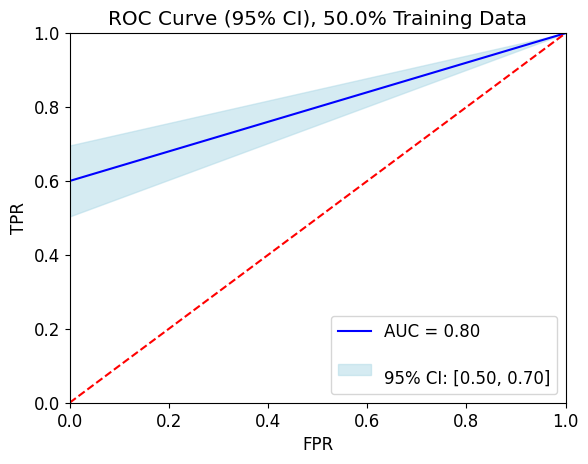

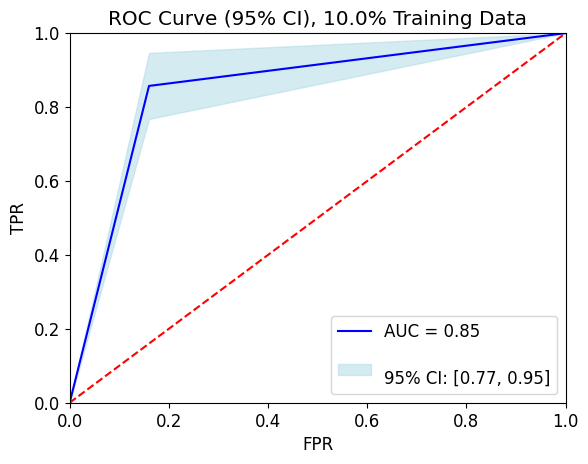

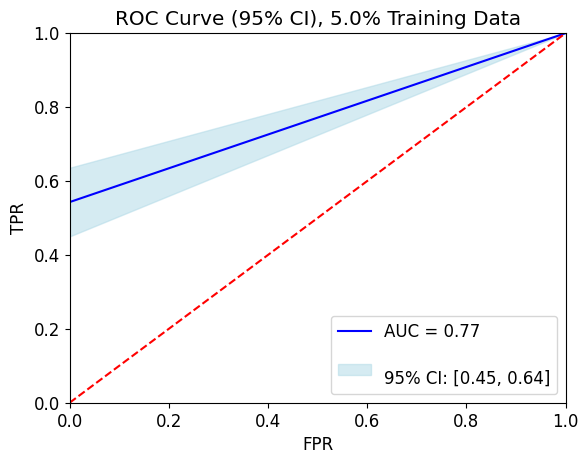

In [83]:
evaluate_ROC(train_set, test_labels, pred_vqtask1)

### Confusion Matrix for Vector Quantum Classifier

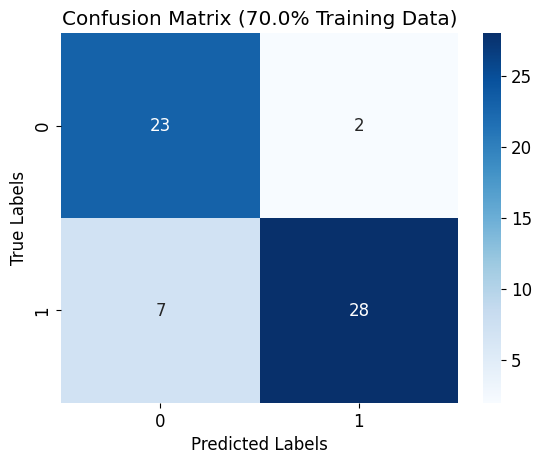

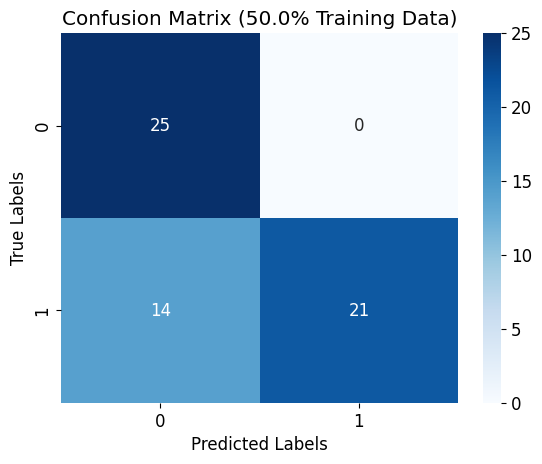

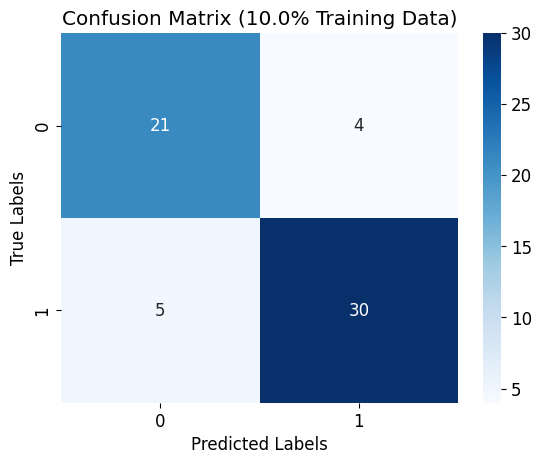

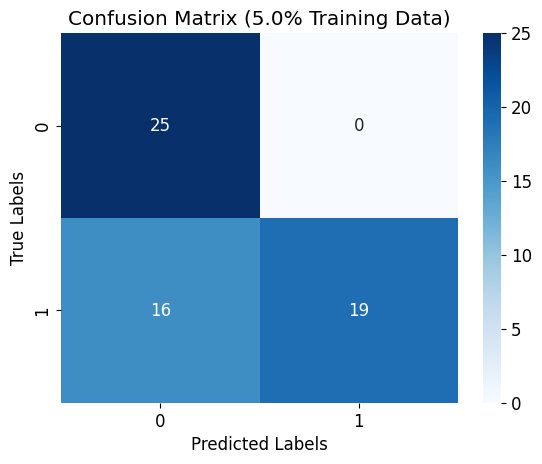

In [84]:
evaluate_con_mat(train_set, test_labels, pred_vqtask1)

# <center><h1><b>Task 4 (Healthy_Plasma vs Healthy_Plasma_NPs)</b></h1></center>

In [48]:
#==================Predictor Variables for dataset 4===================================
X = dataset4[['Zeta Potential', 'Cond', 'Mean Count Rate']]
#X = dataset.drop(['Grade','Age_in_years'], axis = 1)
#===================Output Variable========================================
y = dataset4['Sample Name']
y = y.map(lambda x: 1 if x == 6 else 0)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state = algorithm_globals.random_seed)

## Logistic Regression

### Logistic Regression without hyperparameter tuning

In [48]:
#=====================Logistic Regression Model with different training sets================
eval_mod=evaluate_model(LogisticRegression(solver='lbfgs', max_iter=1000), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.500000 with 70.0% training records
Accuracy score(LogisticRegression model): 0.525000 with 50.0% training records
Accuracy score(LogisticRegression model): 0.500000 with 10.0% training records
Accuracy score(LogisticRegression model): 0.500000 with 5.0% training records


In [49]:
#===============================Hyperparameter Tuning================================
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
clf_LR = LogisticRegression(solver = 'newton-cg', max_iter=1000)
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],'penalty': ['l2'], 'solver': ['newton-cg','liblinear', 'saga']}
grid_search = GridSearchCV(clf_LR, param_grid, cv=10, verbose=0 ,scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}


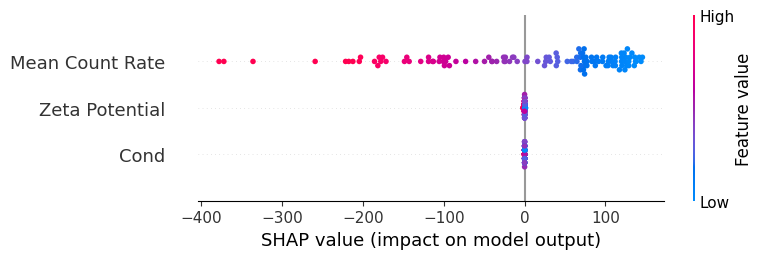

In [50]:
best_model = grid_search.best_estimator_
# Use SHAP's LinearExplainer with the best model
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    explainer = shap.LinearExplainer(best_model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

### Logistic Regression with hyperparameter tuning

In [51]:
#==============================Logistic Regression Model with Hyperparameter Tuning===========================
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
acc_LR, pred_LR, train_data, pred_proba_LR = evaluate_model(LogisticRegression(solver = best_params['solver'], penalty=best_params['penalty'], C = best_params['C']), train_set, X_train_scaled, y_train, X_test_scaled, y_test)

Accuracy score(LogisticRegression model): 0.525000 with 70.0% training records
Accuracy score(LogisticRegression model): 0.508333 with 50.0% training records
Accuracy score(LogisticRegression model): 0.516667 with 10.0% training records
Accuracy score(LogisticRegression model): 0.508333 with 5.0% training records


### Learning Curve for Logistic Regression

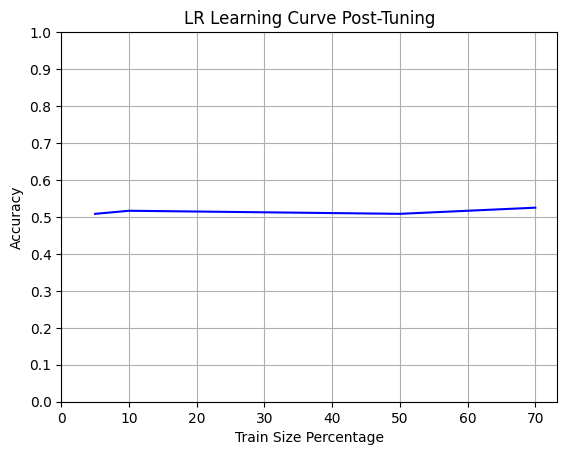

In [52]:
#===============================Learning Curve for LR===========================================
plt.plot(training_sample,acc_LR, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Logistic Regression

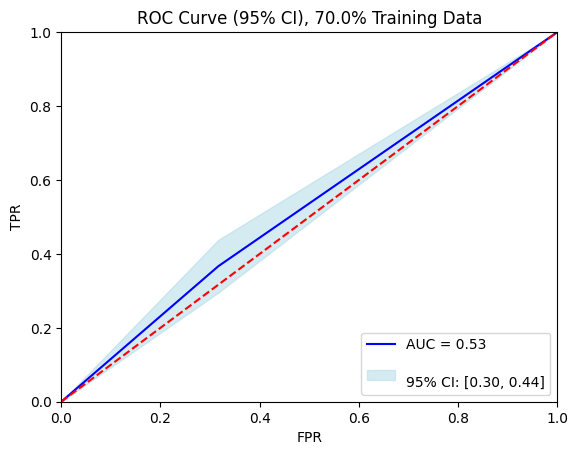

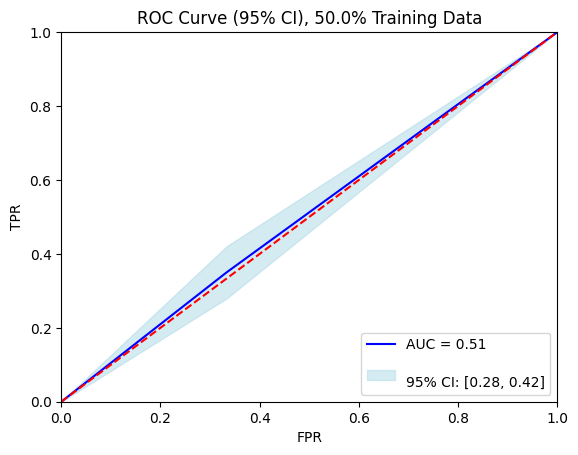

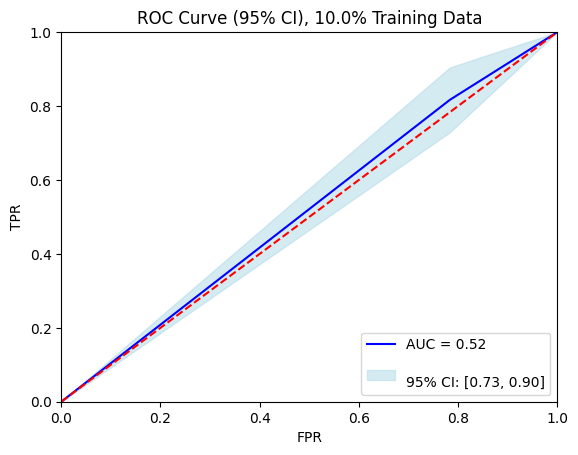

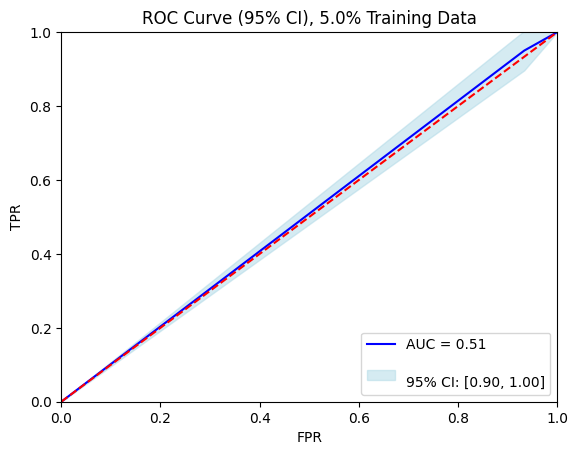

In [53]:
evaluate_ROC(train_set, y_test, pred_LR)

### Confusion Matrix for Logistic Regression

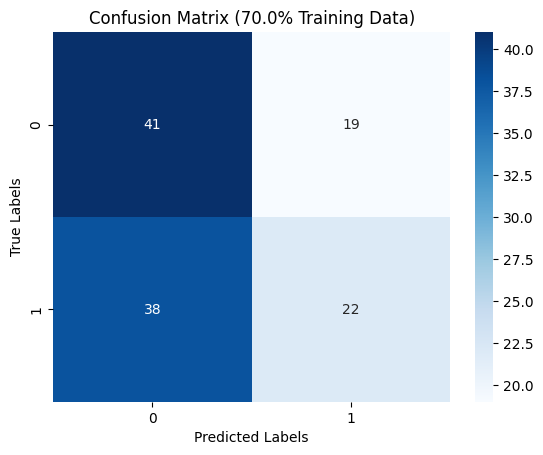

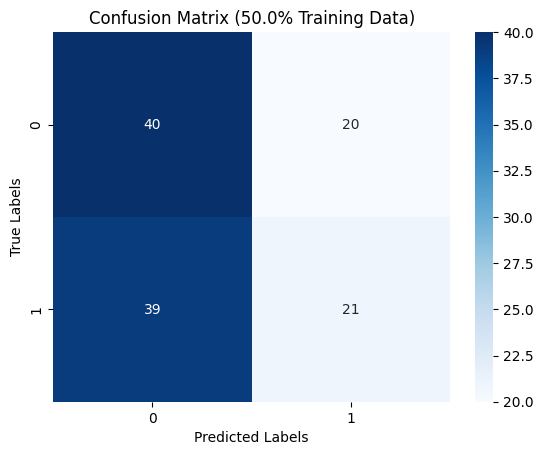

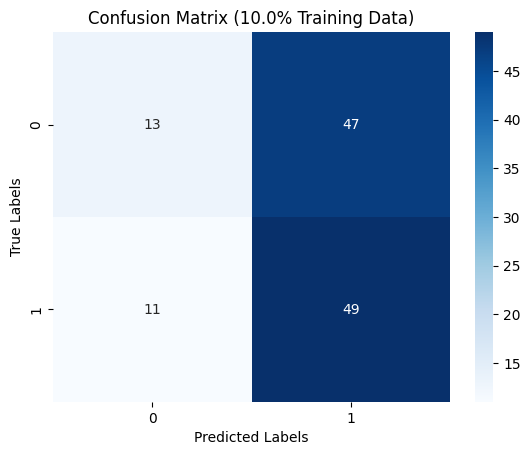

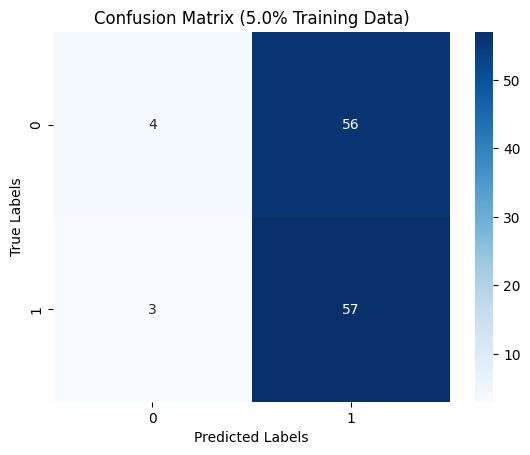

In [54]:
evaluate_con_mat(train_set, y_test, pred_LR)

In [55]:
del acc_LR, pred_LR, train_data, pred_proba_LR, best_params, clf_LR

## Random Forest

### Random Forest without hyperparameter tuning

In [56]:
eval_mod=evaluate_model(RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10), train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.666667 with 70.0% training records
Accuracy score(RandomForestClassifier model): 0.608333 with 50.0% training records
Accuracy score(RandomForestClassifier model): 0.566667 with 10.0% training records
Accuracy score(RandomForestClassifier model): 0.508333 with 5.0% training records


In [57]:
#==============================Hyperparameter  Tuning======================================
clf_RF = RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=clf_RF, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'max_depth': 30, 'min_samples_split': 5, 'n_estimators': 100}


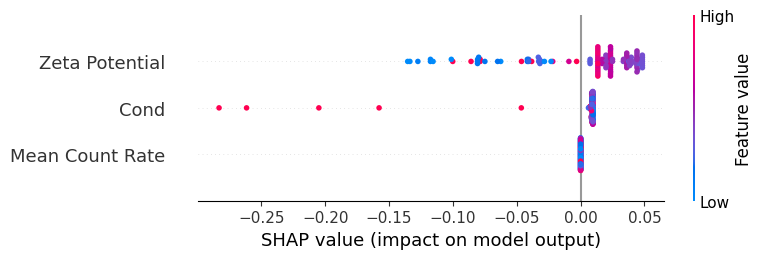

In [58]:
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_norm = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
explainer_rf = shap.Explainer(grid_search.best_estimator_, X_train_norm)
shap_values_rf = explainer_rf(X_test_norm)
shap_values_class_1 = shap_values_rf.values[..., 1]
shap.summary_plot(shap_values_class_1, X_test_norm)

### Random Forest with hyperparameter tuning

In [59]:
#==============================Random Forest Model with Hyperparameter Tuning===========================
acc_RF, pred_RF, train_data, pred_proba_RF = evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.691667 with 70.0% training records
Accuracy score(RandomForestClassifier model): 0.625000 with 50.0% training records
Accuracy score(RandomForestClassifier model): 0.608333 with 10.0% training records
Accuracy score(RandomForestClassifier model): 0.558333 with 5.0% training records


### Learning Curve for Random Forest

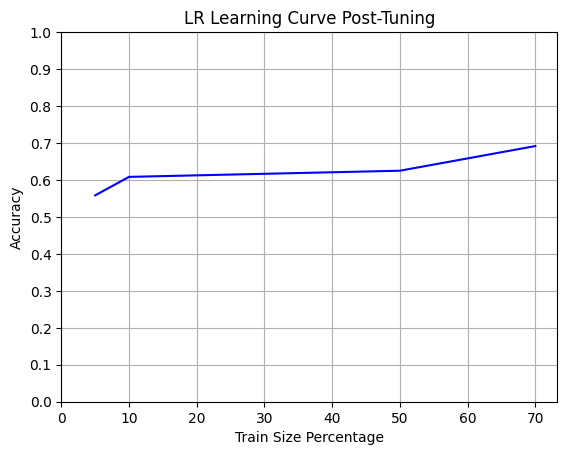

In [60]:
#===============================Learning Curve for Random Forest===========================================
plt.plot(training_sample,acc_RF, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Random Forest

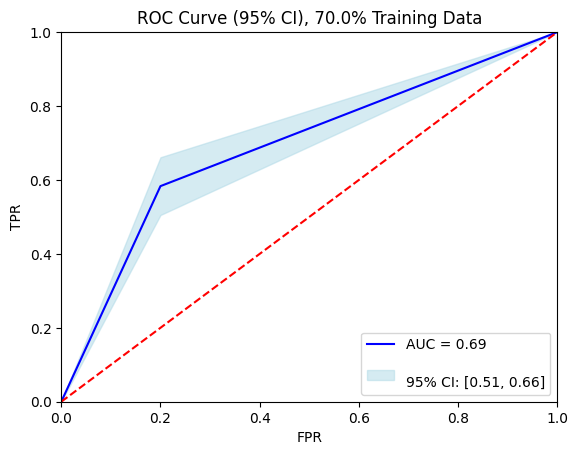

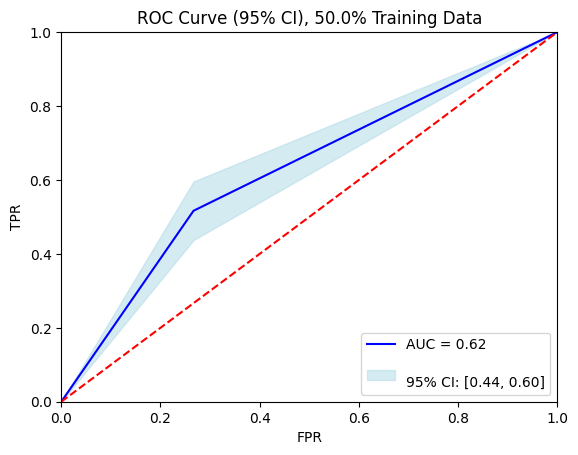

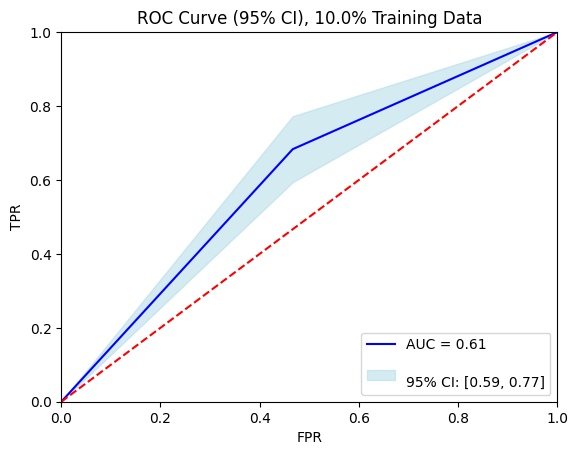

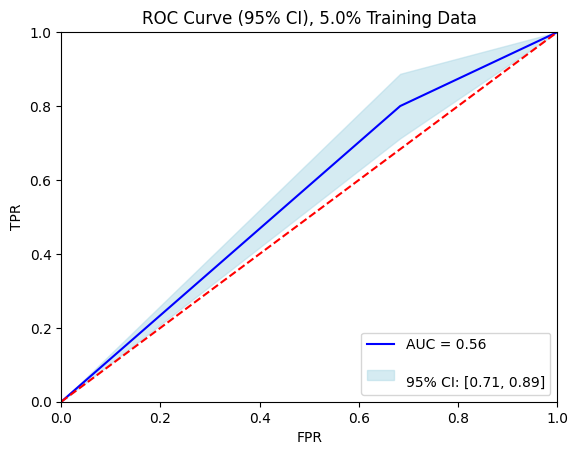

In [61]:
evaluate_ROC(train_set, y_test, pred_RF)

### Confusion Matrix for Random Forest

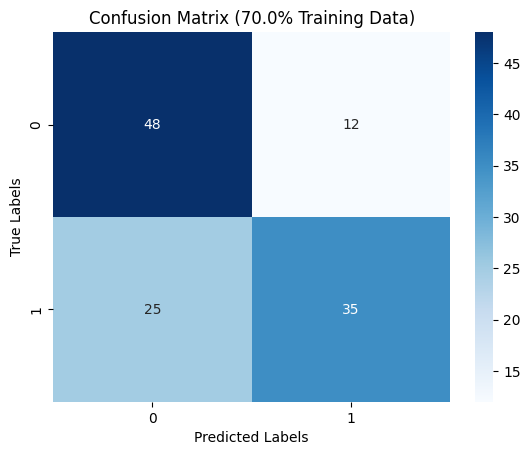

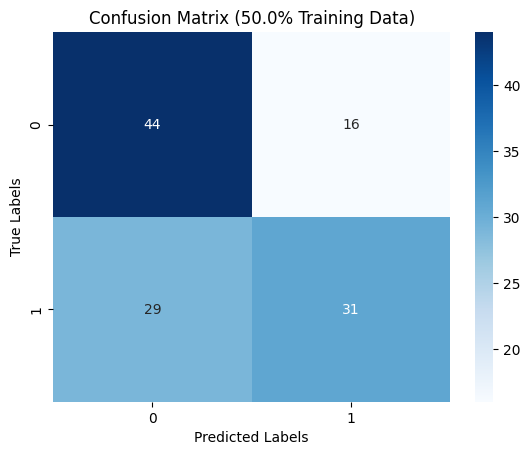

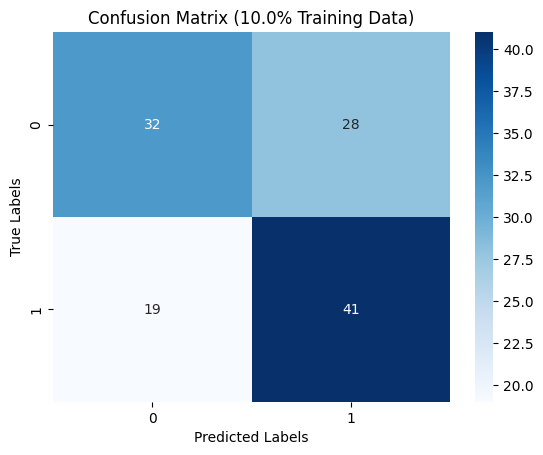

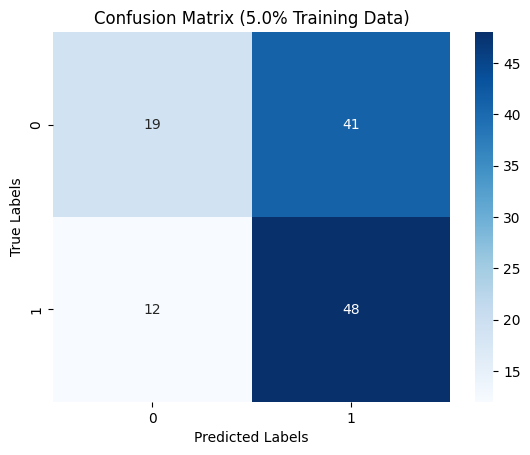

In [62]:
evaluate_con_mat(train_set, y_test, pred_RF)

In [63]:
del acc_RF, pred_RF, train_data, pred_proba_RF, best_params, clf_RF

## Support Vector Classifier

### Support Vector Classifier without hyperparameter tuning

In [64]:
eval_mod=evaluate_model(SVC(kernel='sigmoid', probability=True, C = 100, gamma='auto'), train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.500000 with 70.0% training records
Accuracy score(SVC model): 0.500000 with 50.0% training records
Accuracy score(SVC model): 0.500000 with 10.0% training records
Accuracy score(SVC model): 0.500000 with 5.0% training records


In [65]:
#==========================Hyperparameter Tuning==========================
clf_SVM = SVC(probability=True)
param_grid = {
    'C': [1, 10, 100],  # Reduce the range of C
    'kernel': ['sigmoid','rbf'],  # Focus on one kernel type
    'gamma': [0.01, 0.1]  # Keep a smaller range of gamma
}
grid_search = GridSearchCV(estimator=clf_SVM, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}


Using 280 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/120 [00:00<?, ?it/s]

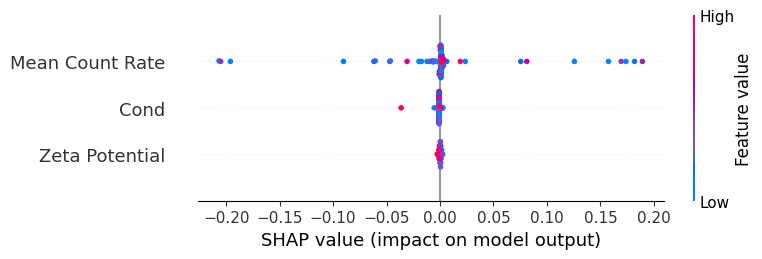

In [66]:
best_model = grid_search.best_estimator_
explainer_svc = shap.KernelExplainer(best_model.predict_proba, X_train)
shap_values_svc = explainer_svc(X_test)
shap_values_svc_class_1 = shap_values_svc.values[..., 1]
shap.summary_plot(shap_values_svc_class_1, X_test)

### Support Vector Classifier with hyperparameter tuning

In [70]:
acc_SVC, pred_SVC, train_data, pred_proba_SVC=evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.500000 with 70.0% training records
Accuracy score(SVC model): 0.483333 with 50.0% training records
Accuracy score(SVC model): 0.483333 with 10.0% training records
Accuracy score(SVC model): 0.500000 with 5.0% training records


### Learning Curve for Support Vector Classifier

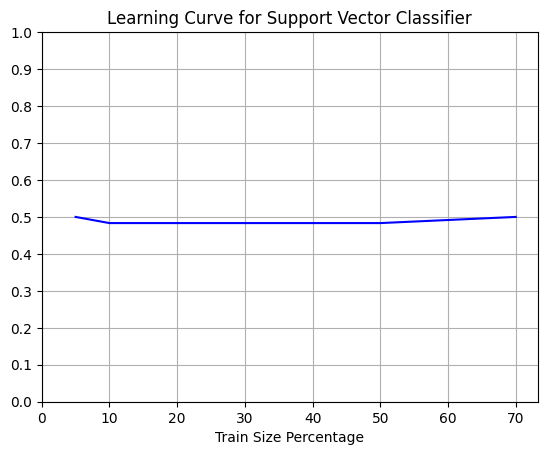

In [71]:
#===============================Learning Curve for SVC===========================================
plt.plot(training_sample,acc_SVC, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for Support Vector Classifier')
plt.show()

### ROC Curve for Support Vector Classifier

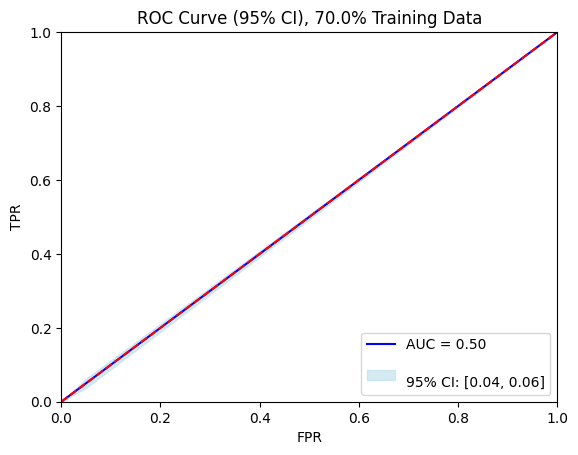

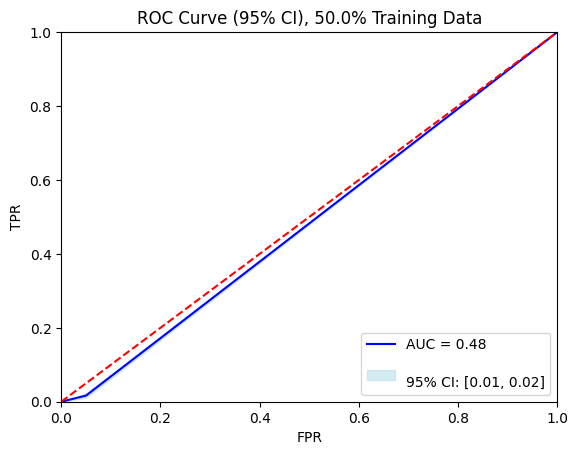

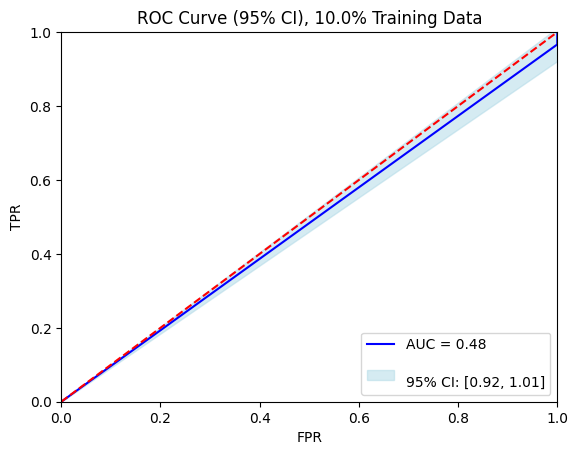

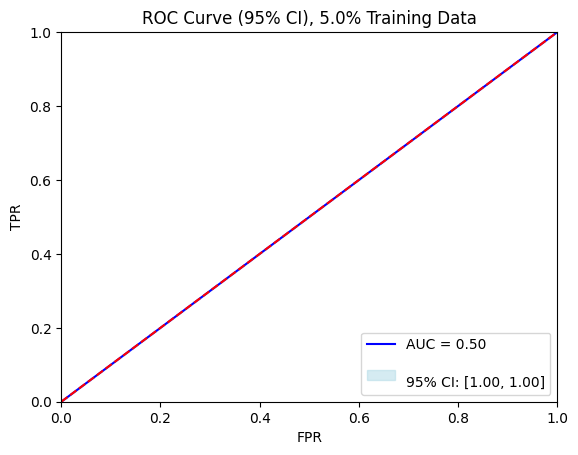

In [72]:
evaluate_ROC(train_set, y_test, pred_SVC)

### Confusion Matrix for Support Vector Classifier

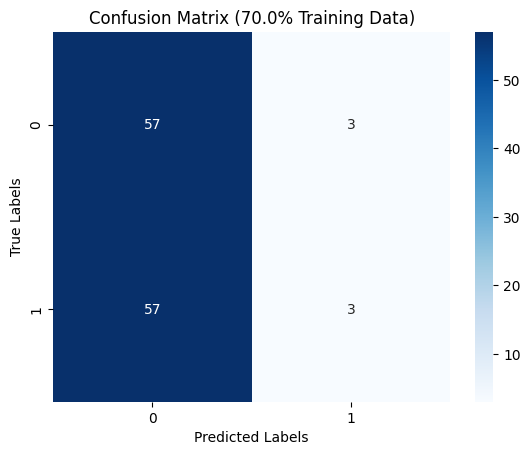

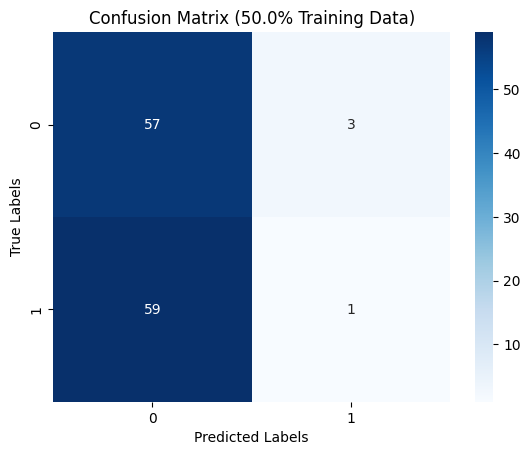

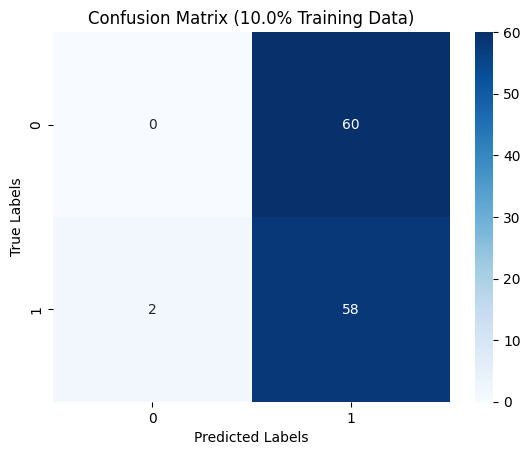

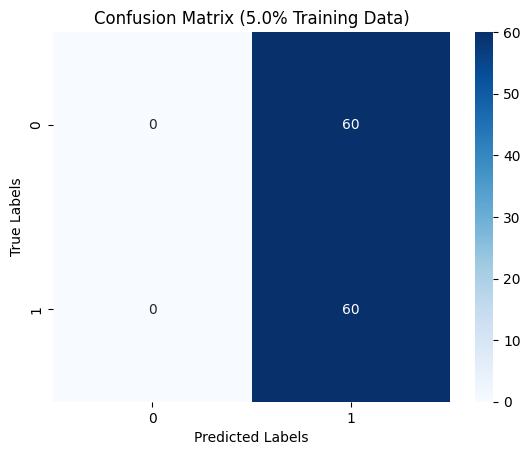

In [73]:
evaluate_con_mat(train_set, y_test, pred_SVC)

In [74]:
del acc_SVC, pred_SVC, train_data, pred_proba_SVC, best_params, clf_SVM

## Vector Quantum Classifier

In [49]:
#=====================Vector Quantum Classifier Model with different training sets================
train_features = MinMaxScaler().fit_transform(X_train)
train_labels = y_train
test_features = MinMaxScaler().fit_transform(X_test)
test_labels = y_test
num_features = train_features.shape[1]
feature_map = ZZFeatureMap(feature_dimension=num_features, reps=1)

In [50]:
del X_train, y_train

In [69]:
ansatz = RealAmplitudes(num_qubits=num_features, entanglement='linear')

In [70]:
optimizer = op.UMDA(maxiter=50)

In [71]:
sampler = Sampler()

### Vector Quantum Classifier with Hyperparameter Tuning

In [72]:
#======================================VQC=================================================
clf_vqc = VQC(
    sampler=sampler,
    feature_map=feature_map,
    ansatz=ansatz,
    loss = 'squared_error',
    optimizer=optimizer
)
acc_vqtask1 = []
pred_vqtask1 = []
for elm in train_set:
    vqc = copy.copy(clf_vqc)
    X_t, dummy_x, y_t, dummy_y = train_test_split(train_features, train_labels, train_size=elm, random_state=algorithm_globals.random_seed)
    vqc.fit(X_t, y_t.values)
    pred = vqc.predict(test_features)
    accuracy = accuracy_score(test_labels.values, pred)
    pred_vqtask1.append(pred)
    acc_vqtask1.append(accuracy)
    print(f'Accuracy score(VQC Model): {accuracy} with {elm*100}% training records')
#======================================VQC=================================================

Accuracy score(VQC Model): 0.5416666666666666 with 70.0% training records
Accuracy score(VQC Model): 0.525 with 50.0% training records
Accuracy score(VQC Model): 0.5083333333333333 with 10.0% training records
Accuracy score(VQC Model): 0.5833333333333334 with 5.0% training records


## Learning Curve for VQC

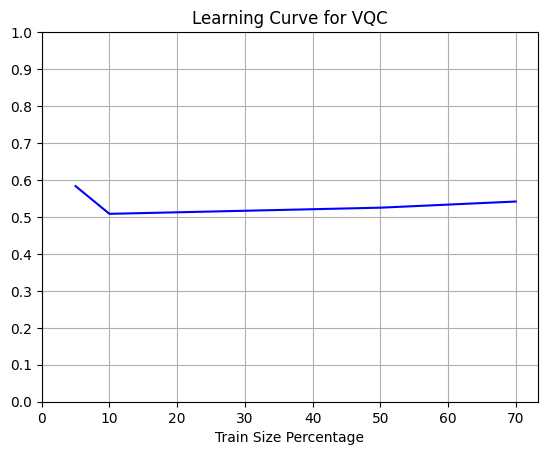

In [73]:
#===============================Learning Curve for VQC===========================================
plt.plot(training_sample,acc_vqtask1, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for VQC')
plt.show()

### 3D Scatter Plot for VQC Model

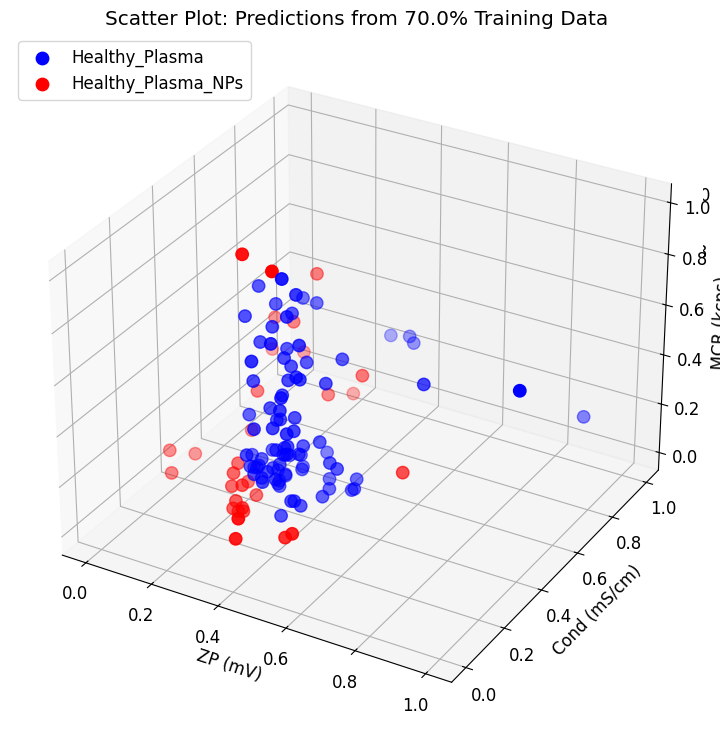

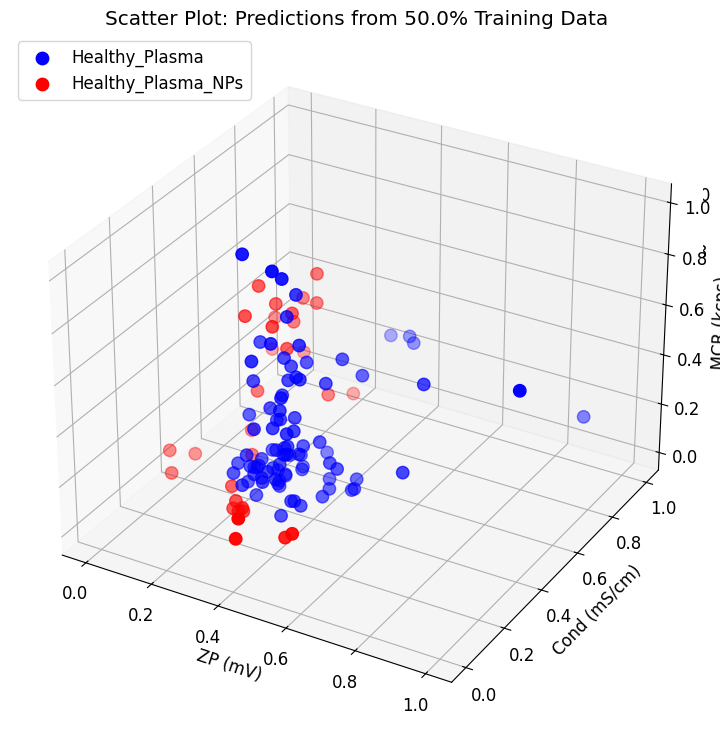

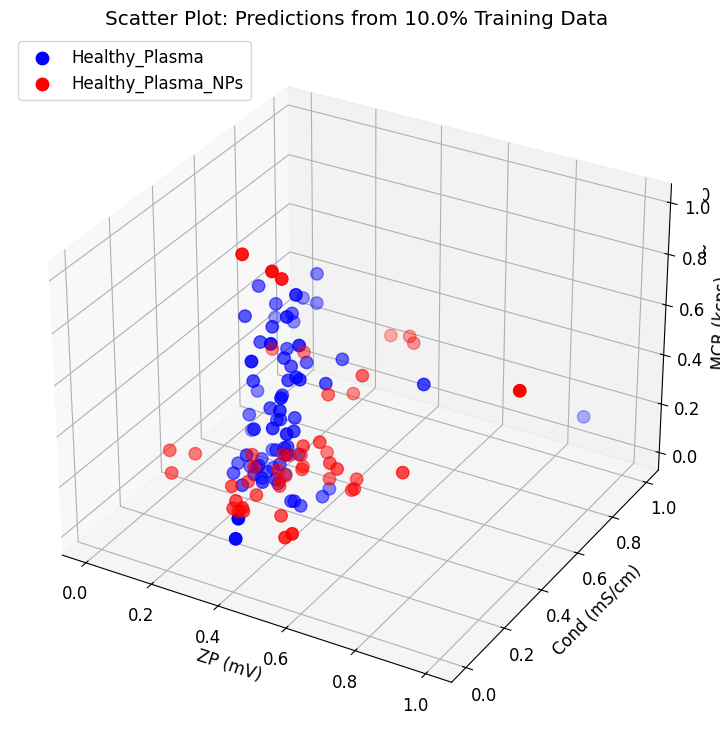

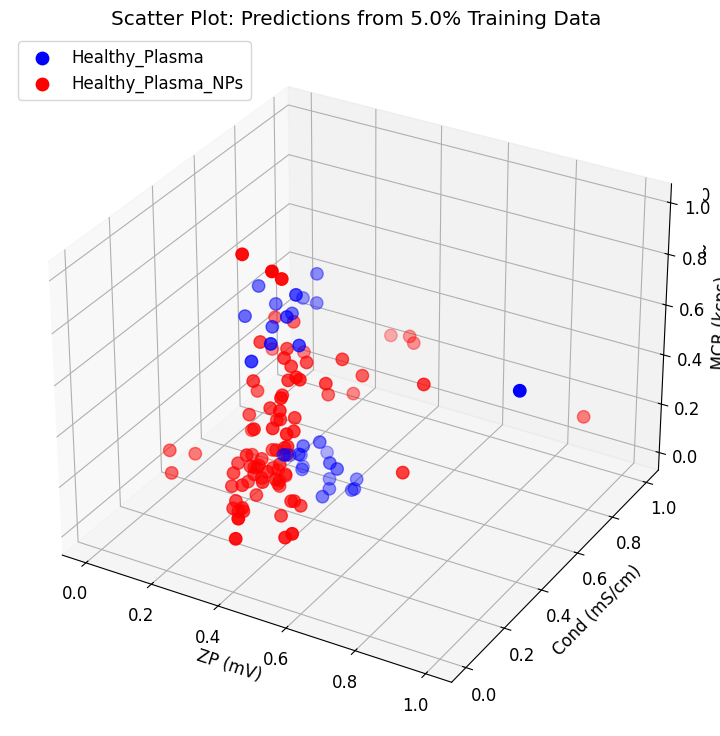

In [74]:
#=======================================3D Scatter Plot===============================
for i in range(len(train_set)):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(9,9))
    ax = plt.subplot(1,1,1,projection='3d')
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(test_features[pred_vqtask1[i]==0,0], test_features[pred_vqtask1[i]==0,1], test_features[pred_vqtask1[i]==0,2], c='blue', marker='o', label='Healthy_Plasma', s=80)
    ax.scatter(test_features[pred_vqtask1[i]==1,0], test_features[pred_vqtask1[i]==1,1], test_features[pred_vqtask1[i]==1,2], c='red', marker='o', label='Healthy_Plasma_NPs',s=80)
    # Set labels for each axis
    ax.set_xlabel('ZP (mV)')
    ax.set_ylabel('Cond (mS/cm)')
    ax.set_zlabel('MCR (kcps)')
    ax.set_title(f'Scatter Plot: Predictions from {train_set[i]*100}% Training Data')
    ax.tick_params("z", which="major",length=15,width = 2.0)
    ax.legend(loc='upper left')
    plt.show()

### ROC Curve for Vector Quantum Classifier

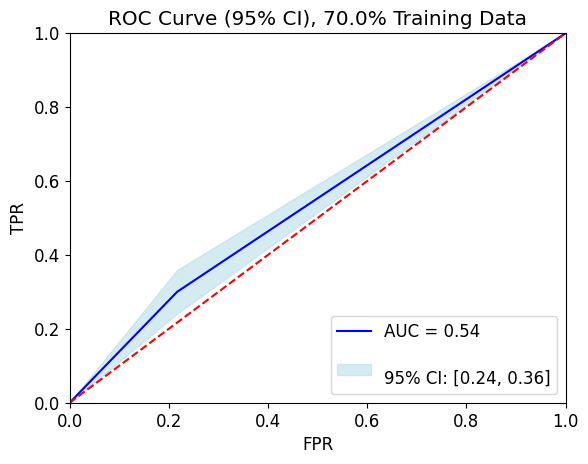

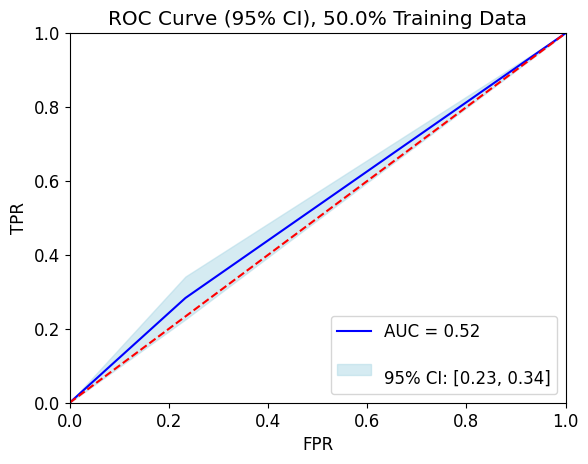

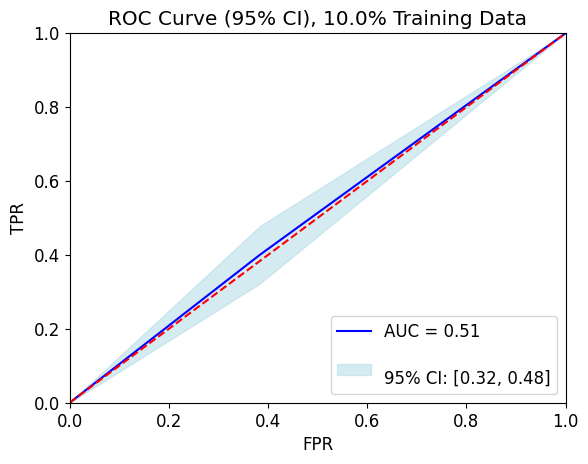

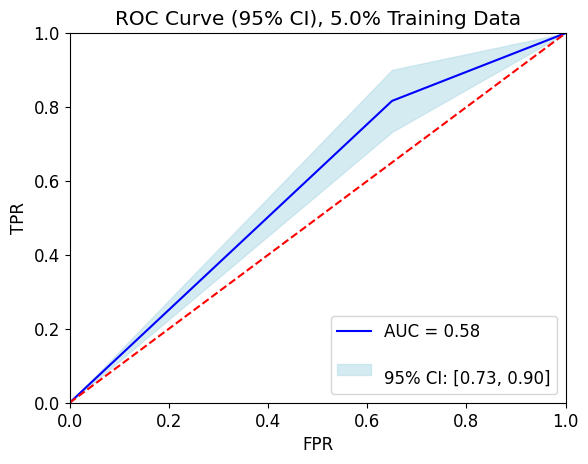

In [75]:
evaluate_ROC(train_set, test_labels, pred_vqtask1)

### Confusion Matrix for Vector Quantum Classifier

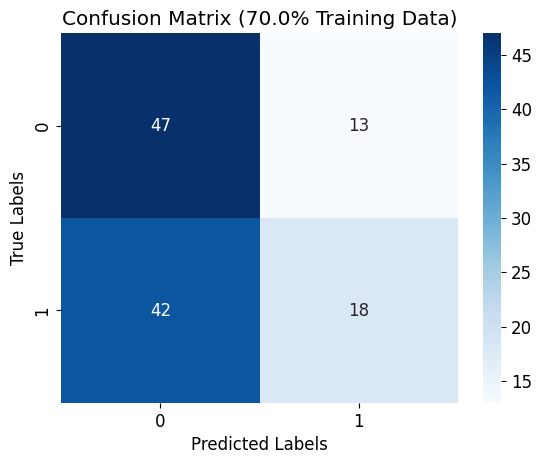

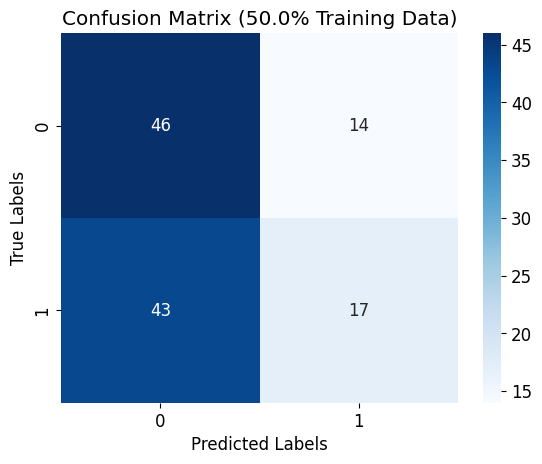

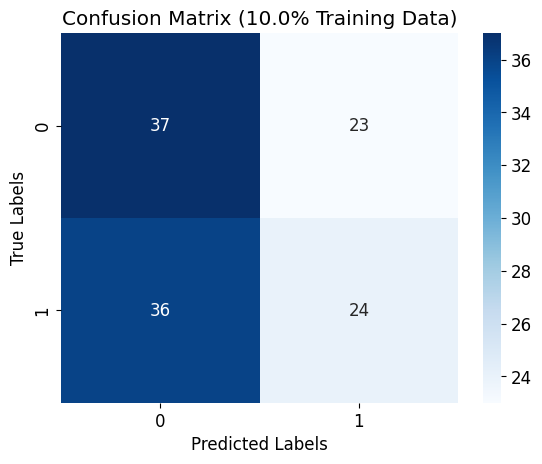

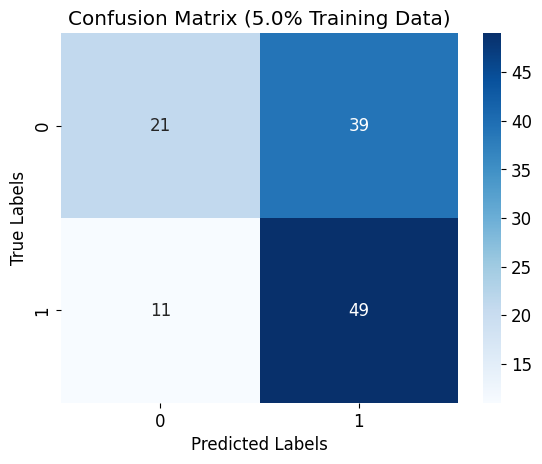

In [76]:
evaluate_con_mat(train_set, test_labels, pred_vqtask1)

# <center><h1><b>Task 5 (Cancer_Plasma vs Cancer_Plasma_NPs)</b></h1></center>

In [47]:
#==================Predictor Variables for dataset 5===================================
X = dataset5[['Zeta Potential', 'Cond', 'Mean Count Rate']]
#===================Output Variable==================================a======
y = dataset5['Sample Name']
y = y.map(lambda x: 1 if x == 7 else 0)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=algorithm_globals.random_seed)

## Logistic Regression

### Logistic Regression without hyperparameter tuning

In [48]:
#=====================Logistic Regression Model with different training sets================
eval_mod=evaluate_model(LogisticRegression(solver='lbfgs', max_iter=1000), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.500000 with 70.0% training records
Accuracy score(LogisticRegression model): 0.500000 with 50.0% training records
Accuracy score(LogisticRegression model): 0.458333 with 10.0% training records
Accuracy score(LogisticRegression model): 0.450000 with 5.0% training records


In [49]:
#===============================Hyperparameter Tuning================================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
clf_LR = LogisticRegression(solver = 'lbfgs', max_iter=1000)
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],'penalty': ['l2'], 'solver': ['newton-cg','lbfgs' ,'liblinear', 'saga']}
grid_search = GridSearchCV(clf_LR, param_grid, cv=10, verbose=0 ,scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 0.001, 'penalty': 'l2', 'solver': 'saga'}


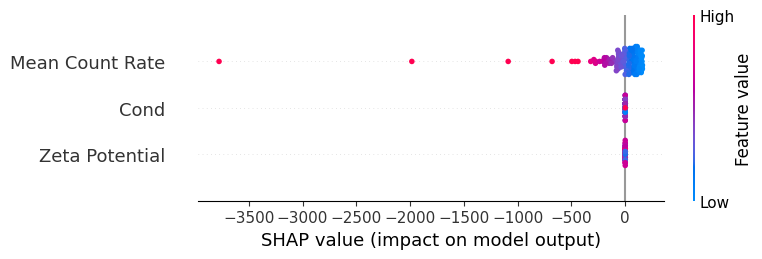

In [50]:
best_model = grid_search.best_estimator_
# Use SHAP's LinearExplainer with the best model
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    explainer = shap.LinearExplainer(best_model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

### Logistic Regression with hyperparameter tuning

In [51]:
#==============================Logistic Regression Model with Hyperparameter Tuning===========================
acc_LR, pred_LR, train_data, pred_proba_LR = evaluate_model(LogisticRegression(solver = best_params['solver'], penalty=best_params['penalty'], C = best_params['C']), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.500000 with 70.0% training records
Accuracy score(LogisticRegression model): 0.500000 with 50.0% training records
Accuracy score(LogisticRegression model): 0.500000 with 10.0% training records
Accuracy score(LogisticRegression model): 0.500000 with 5.0% training records


### Learning Curve for Logistic Regression

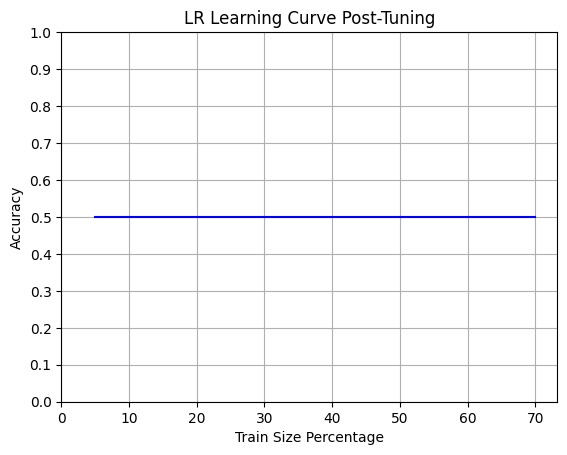

In [52]:
#===============================Learning Curve for LR===========================================
plt.plot(training_sample,acc_LR, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Logistic Regression

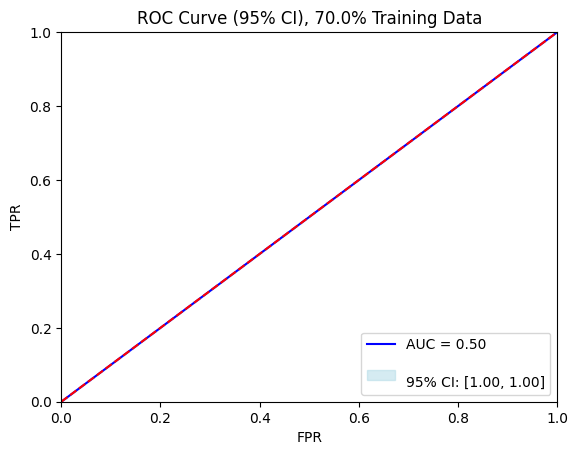

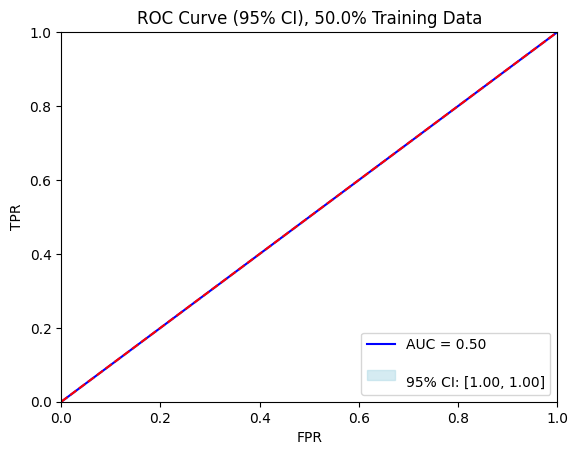

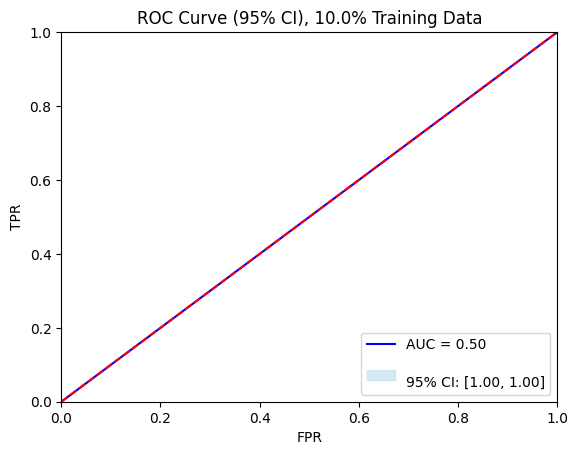

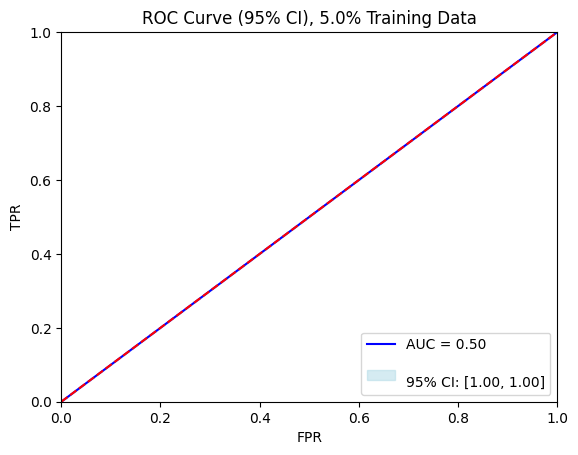

In [53]:
evaluate_ROC(train_set, y_test, pred_LR)

### Confusion Matrix for Logistic Regression

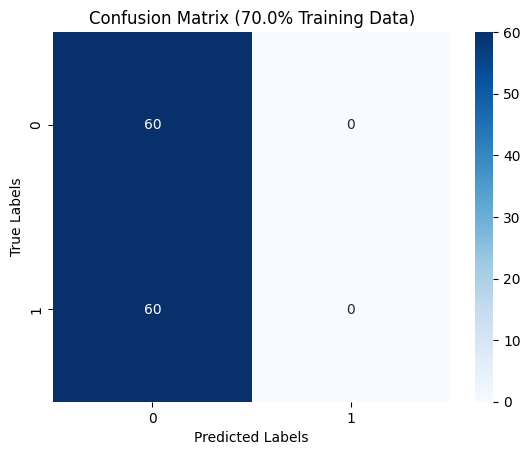

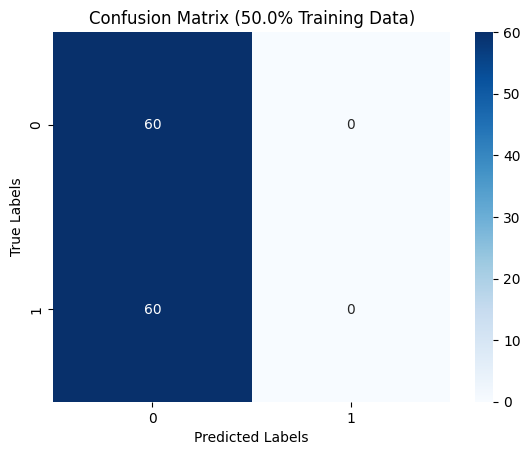

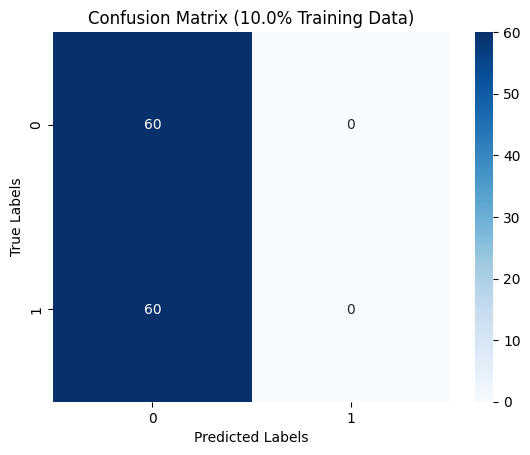

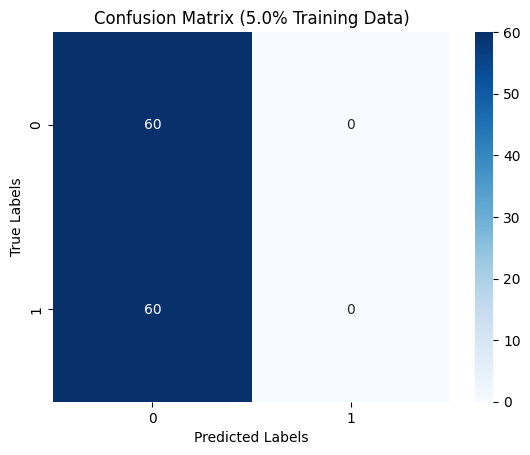

In [54]:
evaluate_con_mat(train_set, y_test, pred_LR)

In [55]:
del acc_LR, pred_LR, train_data, pred_proba_LR, best_params, clf_LR

## Random Forest

### Random Forest without hyperparameter tuning

In [56]:
eval_mod=evaluate_model(RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10), train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.633333 with 70.0% training records
Accuracy score(RandomForestClassifier model): 0.608333 with 50.0% training records
Accuracy score(RandomForestClassifier model): 0.525000 with 10.0% training records
Accuracy score(RandomForestClassifier model): 0.550000 with 5.0% training records


In [57]:
#==============================Hyperparameter  Tuning======================================
clf_RF = RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=clf_RF, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 300}


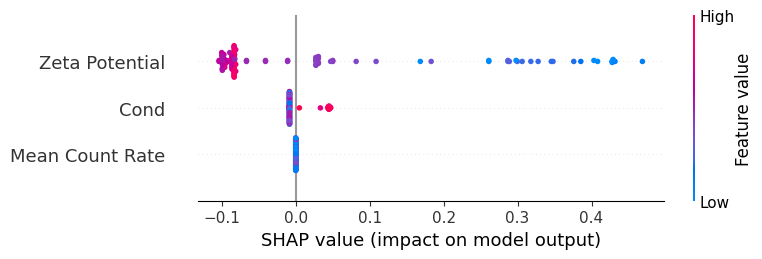

In [58]:
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_norm = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
explainer_rf = shap.Explainer(grid_search.best_estimator_, X_train_norm)
shap_values_rf = explainer_rf(X_test_norm)
shap_values_class_1 = shap_values_rf.values[..., 1]
shap.summary_plot(shap_values_class_1, X_test_norm)

### Random Forest with hyperparameter tuning

In [59]:
#==============================Random Forest Model with Hyperparameter Tuning===========================
acc_RF, pred_RF, train_data, pred_proba_RF = evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.650000 with 70.0% training records
Accuracy score(RandomForestClassifier model): 0.616667 with 50.0% training records
Accuracy score(RandomForestClassifier model): 0.525000 with 10.0% training records
Accuracy score(RandomForestClassifier model): 0.466667 with 5.0% training records


### Learning Curve for Random Forest

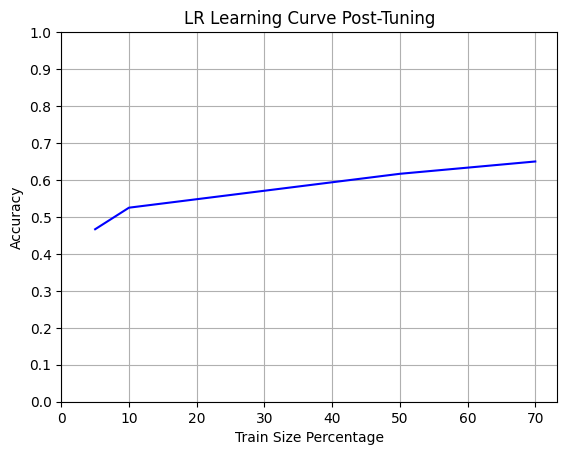

In [60]:
#===============================Learning Curve for Random Forest===========================================
plt.plot(training_sample,acc_RF, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Random Forest

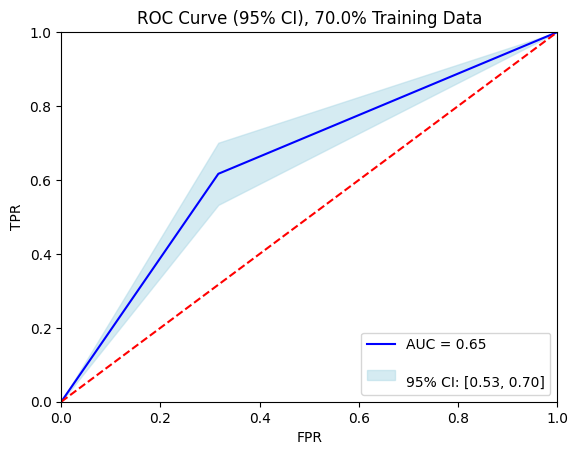

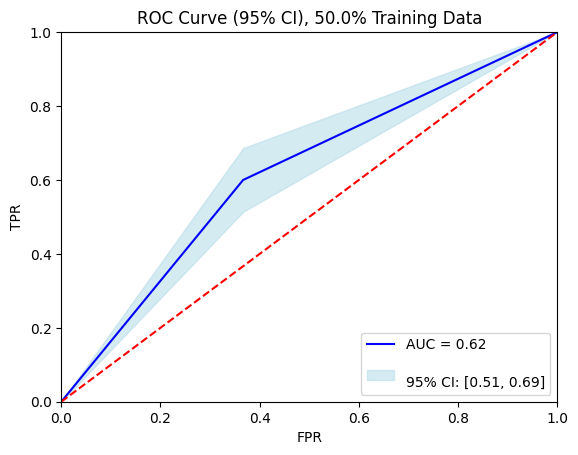

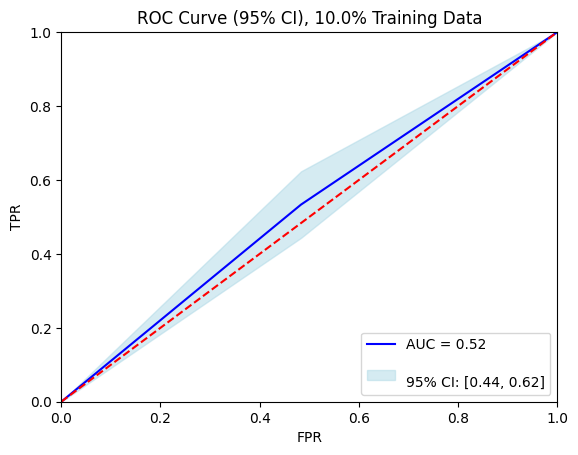

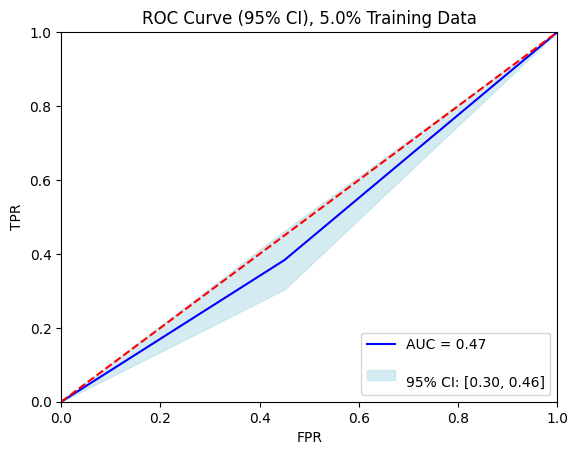

In [61]:
evaluate_ROC(train_set, y_test, pred_RF)

### Confusion Matrix for Random Forest

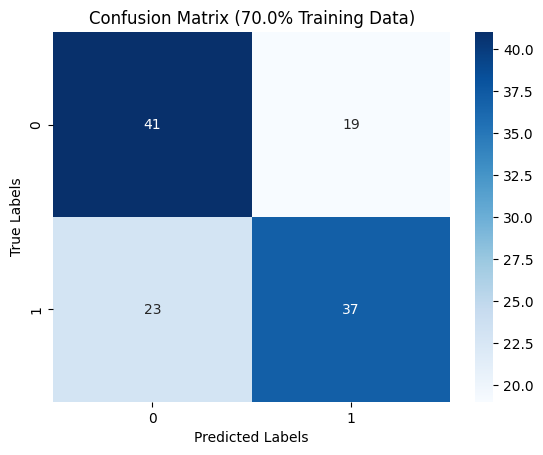

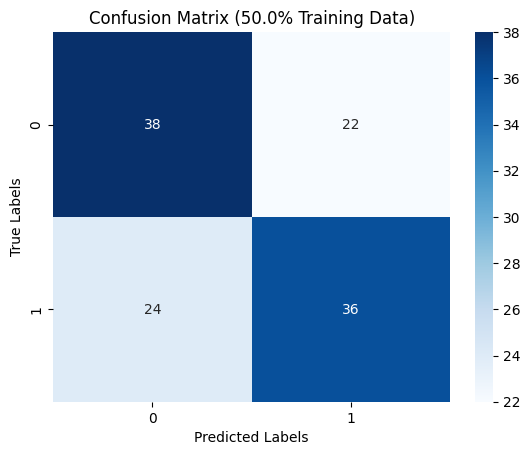

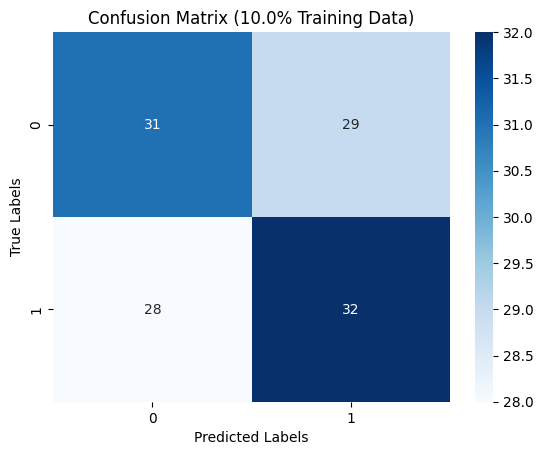

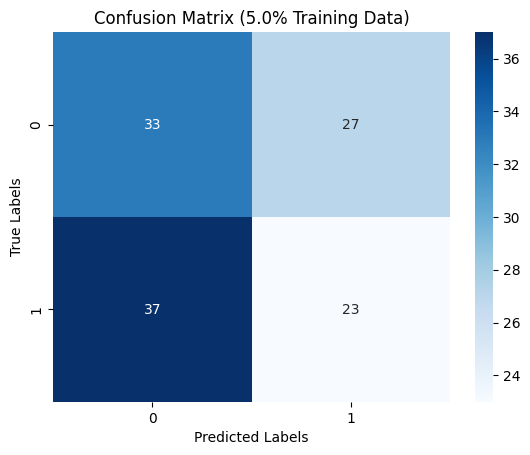

In [62]:
evaluate_con_mat(train_set, y_test, pred_RF)

In [63]:
del acc_RF, pred_RF, train_data, pred_proba_RF, best_params, clf_RF

## Support Vector Classifier

### Support Vector Classifier without hyperparameter tuning

In [64]:
eval_mod=evaluate_model(SVC(kernel='sigmoid', probability=True, C = 100, gamma='auto'), train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.500000 with 70.0% training records
Accuracy score(SVC model): 0.500000 with 50.0% training records
Accuracy score(SVC model): 0.500000 with 10.0% training records
Accuracy score(SVC model): 0.500000 with 5.0% training records


In [65]:
#==========================Hyperparameter Tuning==========================
clf_SVM = SVC(probability=True)
param_grid = {
    'C': [1, 10, 100],  # Reduce the range of C
    'kernel': ['sigmoid','rbf'],  # Focus on one kernel type
    'gamma': [0.01, 0.1]  # Keep a smaller range of gamma
}
grid_search = GridSearchCV(estimator=clf_SVM, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


Using 280 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/120 [00:00<?, ?it/s]

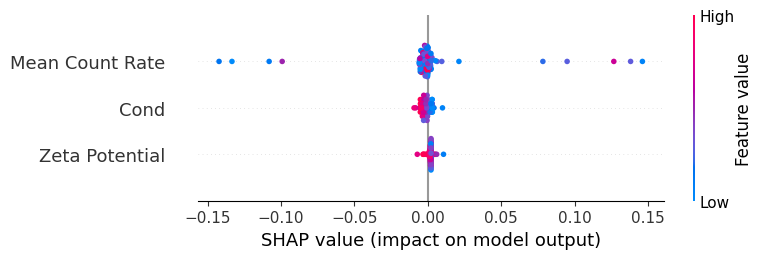

In [66]:
best_model = grid_search.best_estimator_
explainer_svc = shap.KernelExplainer(best_model.predict_proba, X_train)
shap_values_svc = explainer_svc(X_test)
shap_values_svc_class_1 = shap_values_svc.values[..., 1]
shap.summary_plot(shap_values_svc_class_1, X_test)

### Support Vector Classifier with hyperparameter tuning

In [67]:
acc_SVC, pred_SVC, train_data, pred_proba_SVC=evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.491667 with 70.0% training records
Accuracy score(SVC model): 0.500000 with 50.0% training records
Accuracy score(SVC model): 0.500000 with 10.0% training records
Accuracy score(SVC model): 0.500000 with 5.0% training records


### Learning Curve for Support Vector Classifier

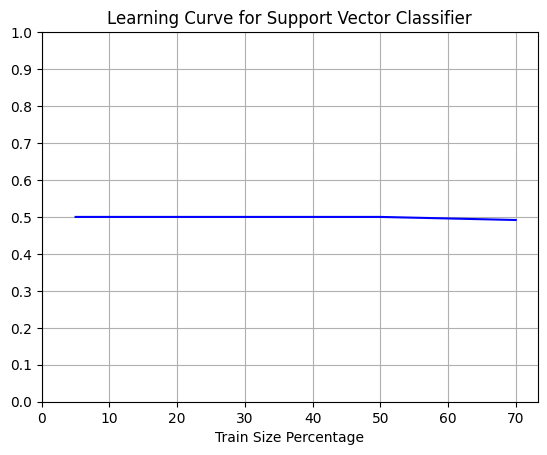

In [68]:
#===============================Learning Curve for SVC===========================================
plt.plot(training_sample,acc_SVC, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for Support Vector Classifier')
plt.show()

### ROC Curve for Support Vector Classifier

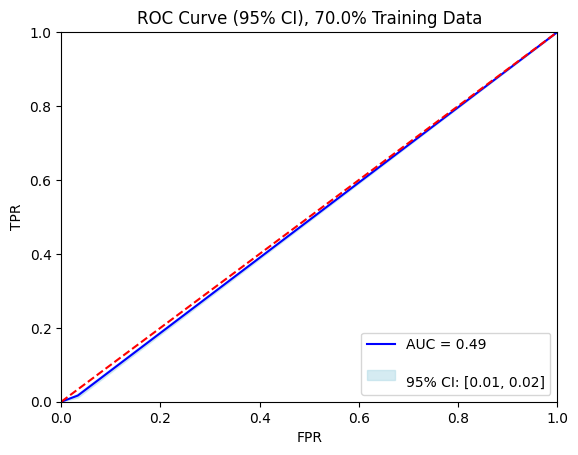

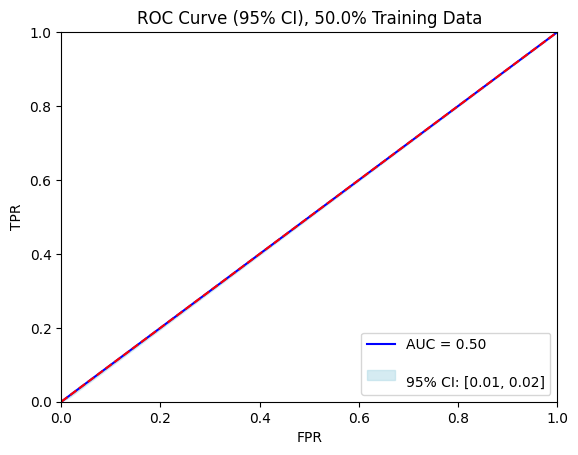

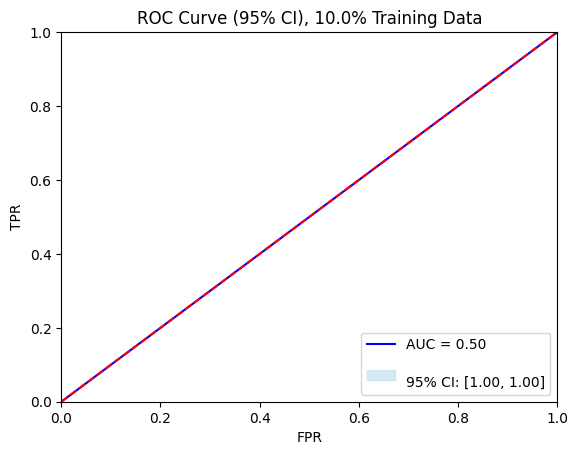

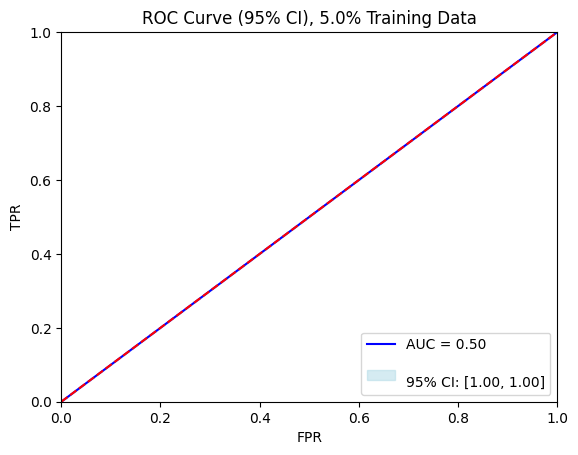

In [69]:
evaluate_ROC(train_set, y_test, pred_SVC)

### Confusion Matrix for Support Vector Classifier

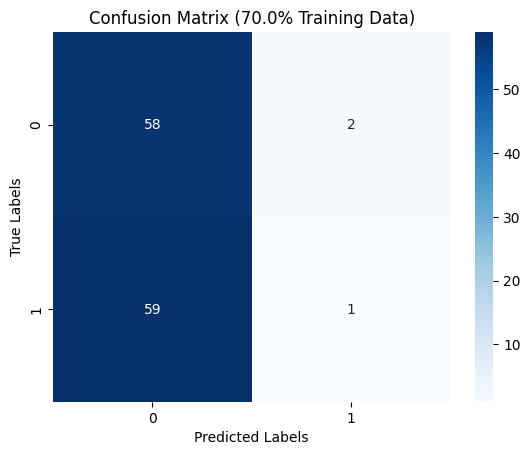

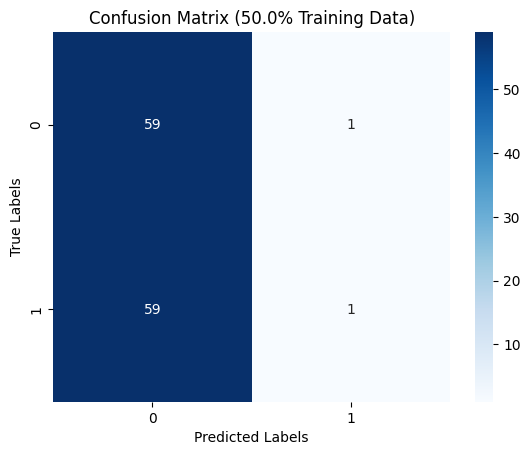

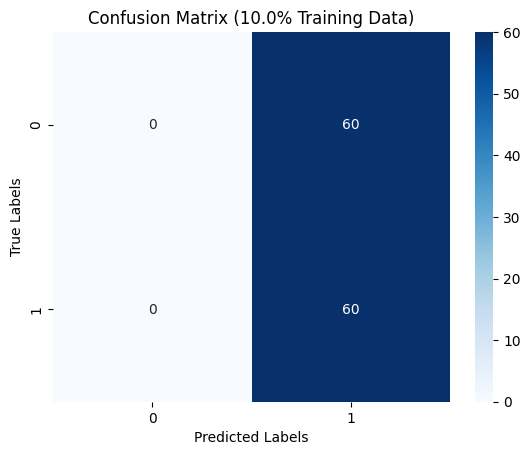

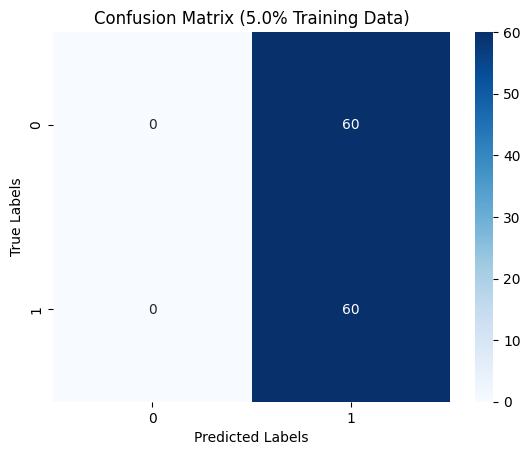

In [70]:
evaluate_con_mat(train_set, y_test, pred_SVC)

In [71]:
del acc_SVC, pred_SVC, train_data, pred_proba_SVC, best_params, clf_SVM

## Vector Quantum Classifier

In [48]:
#=====================Vector Quantum Classifier Model with different training sets================
train_features = MinMaxScaler().fit_transform(X_train)
train_labels = y_train
test_features = MinMaxScaler().fit_transform(X_test)
test_labels = y_test
num_features = train_features.shape[1]
feature_map = ZZFeatureMap(feature_dimension=num_features, reps=1)

In [49]:
# del X_train, y_train

In [50]:
ansatz = EfficientSU2(num_qubits=num_features, reps=3, entanglement = 'full')

In [51]:
optimizer = op.UMDA(maxiter=50)

In [52]:
sampler = Sampler()

### Vector Quantum Classifier with Hyperparameter Tuning

In [53]:
#======================================VQC=================================================
clf_vqc = VQC(
    sampler=sampler,
    feature_map=feature_map,
    ansatz=ansatz,
    loss = 'squared_error',
    optimizer=optimizer
)
acc_vqtask1 = []
pred_vqtask1 = []
for elm in train_set:
    vqc = copy.copy(clf_vqc)
    X_t, dummy_x, y_t, dummy_y = train_test_split(train_features, train_labels, train_size=elm, random_state=algorithm_globals.random_seed)
    vqc.fit(X_t, y_t.values)
    pred = vqc.predict(test_features)
    accuracy = accuracy_score(test_labels.values, pred)
    pred_vqtask1.append(pred)
    acc_vqtask1.append(accuracy)
    print(f'Accuracy score(VQC Model): {accuracy} with {elm*100}% training records')
#======================================VQC=================================================

Accuracy score(VQC Model): 0.6083333333333333 with 70.0% training records
Accuracy score(VQC Model): 0.5166666666666667 with 50.0% training records
Accuracy score(VQC Model): 0.475 with 10.0% training records
Accuracy score(VQC Model): 0.5 with 5.0% training records


## Learning Curve for VQC

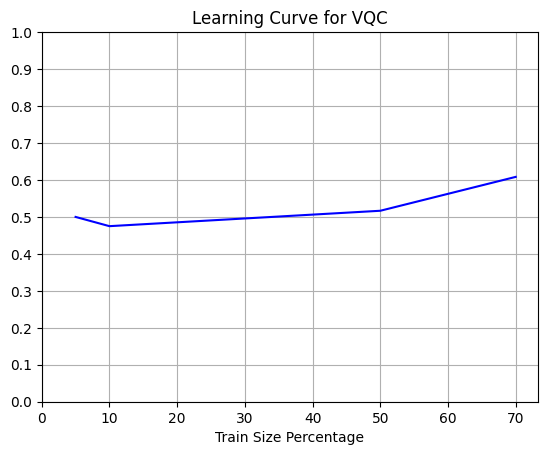

In [54]:
#===============================Learning Curve for VQC===========================================
plt.plot(training_sample,acc_vqtask1, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for VQC')
plt.show()

### 3D Scatter Plot for VQC Model

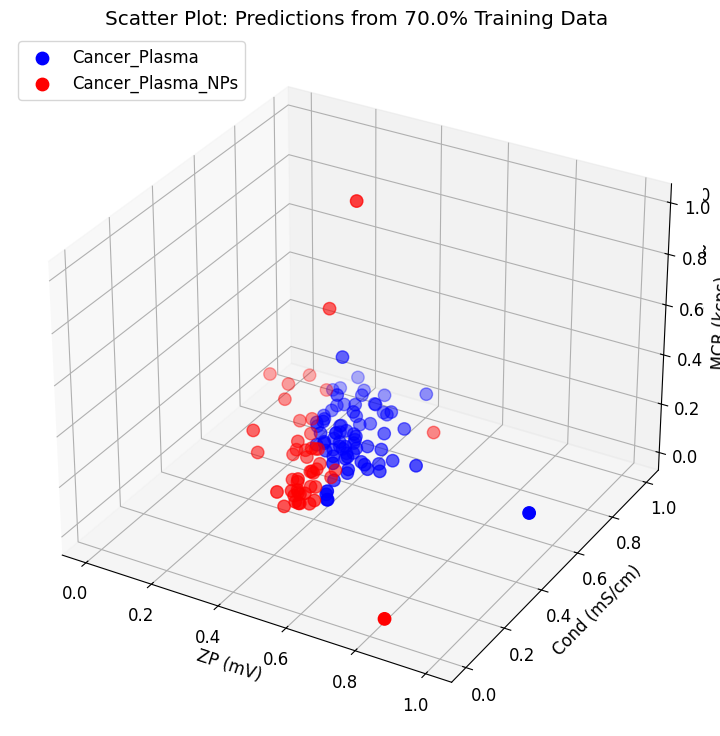

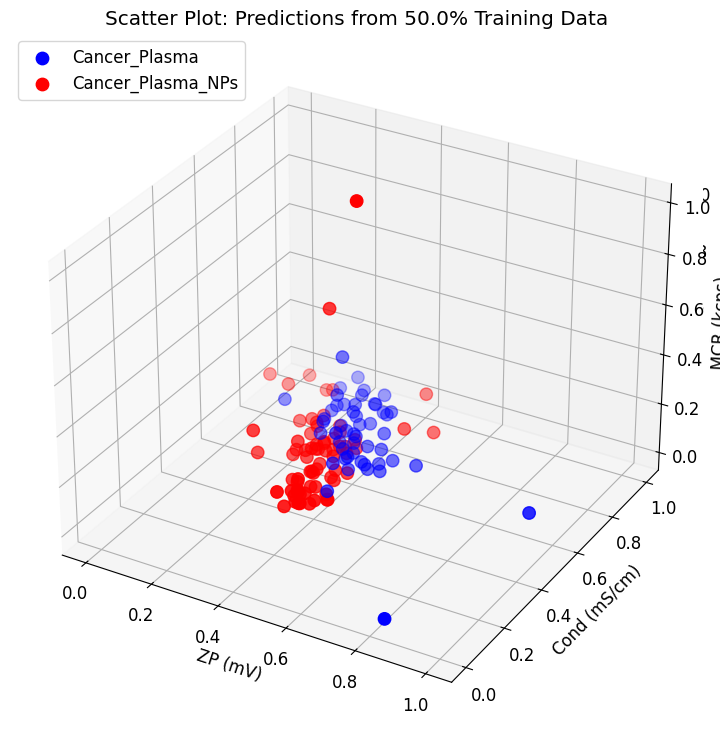

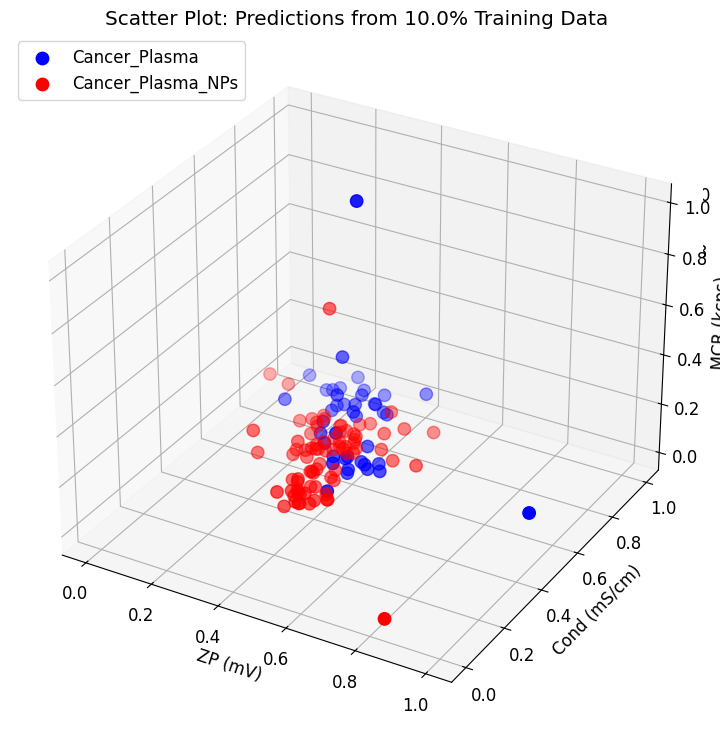

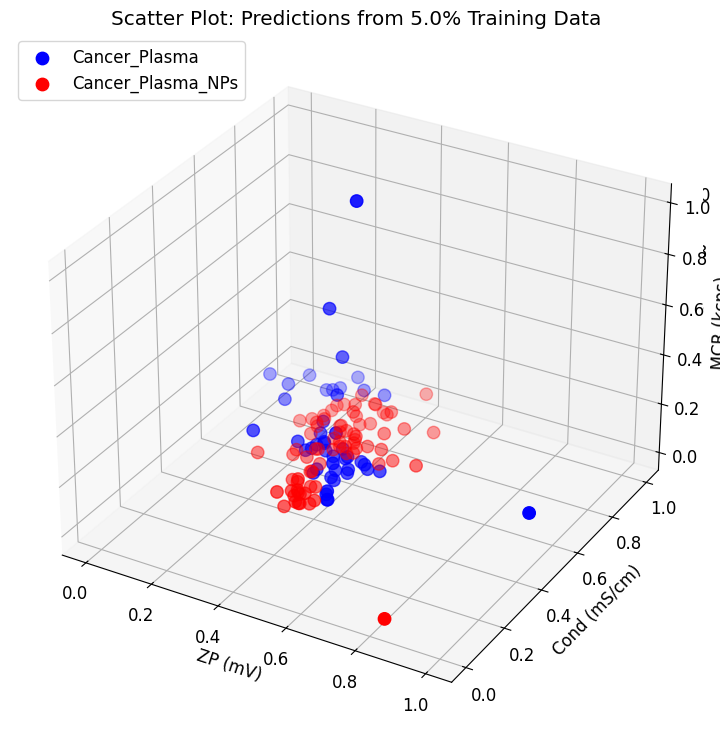

In [55]:
#=======================================3D Scatter Plot===============================
for i in range(len(train_set)):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(9,9))
    ax = plt.subplot(1,1,1,projection='3d')
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(test_features[pred_vqtask1[i]==0,0], test_features[pred_vqtask1[i]==0,1], test_features[pred_vqtask1[i]==0,2], c='blue', marker='o', label='Cancer_Plasma', s=80)
    ax.scatter(test_features[pred_vqtask1[i]==1,0], test_features[pred_vqtask1[i]==1,1], test_features[pred_vqtask1[i]==1,2], c='red', marker='o', label='Cancer_Plasma_NPs',s=80)
  # Set labels for each axis
    ax.set_xlabel('ZP (mV)')
    ax.set_ylabel('Cond (mS/cm)')
    ax.set_zlabel('MCR (kcps)')
    ax.set_title(f'Scatter Plot: Predictions from {train_set[i]*100}% Training Data')
    ax.tick_params("z", which="major",length=15,width = 2.0)
    ax.legend(loc='upper left')
    plt.show()

### ROC Curve for Vector Quantum Classifier

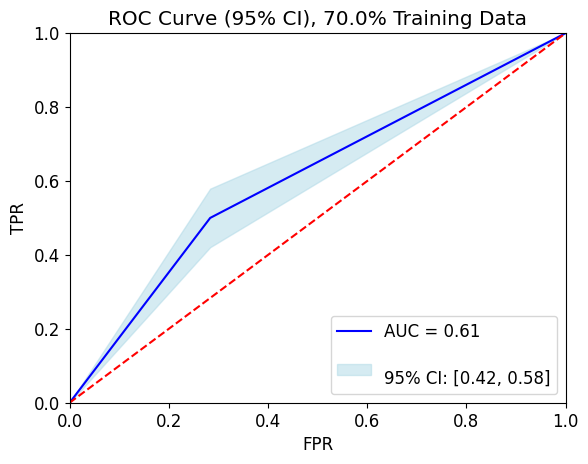

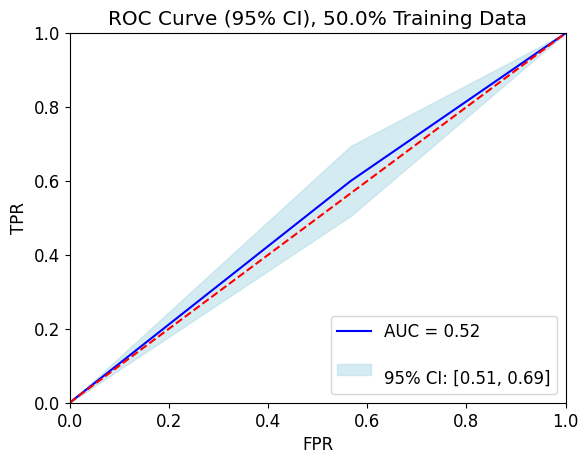

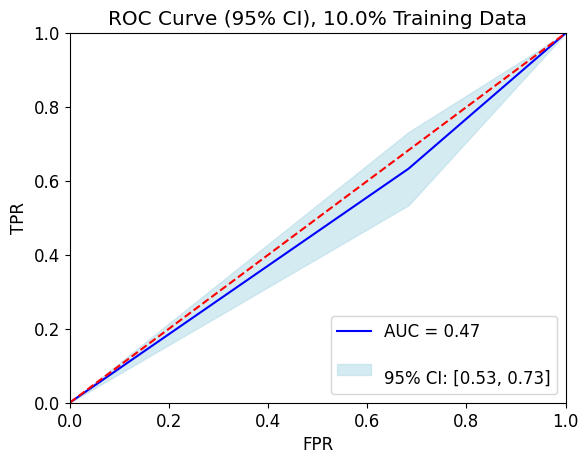

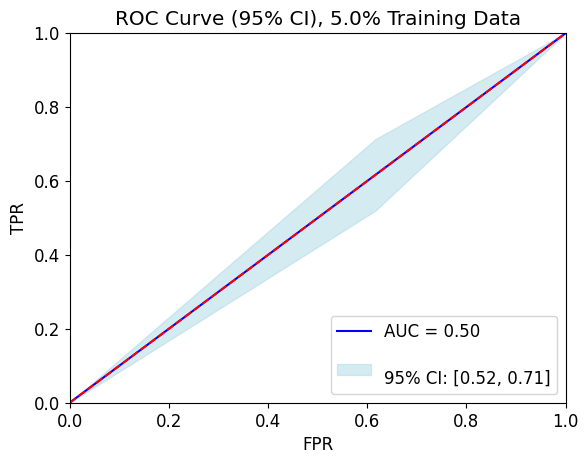

In [56]:
evaluate_ROC(train_set, test_labels, pred_vqtask1)

### Confusion Matrix for Vector Quantum Classifier

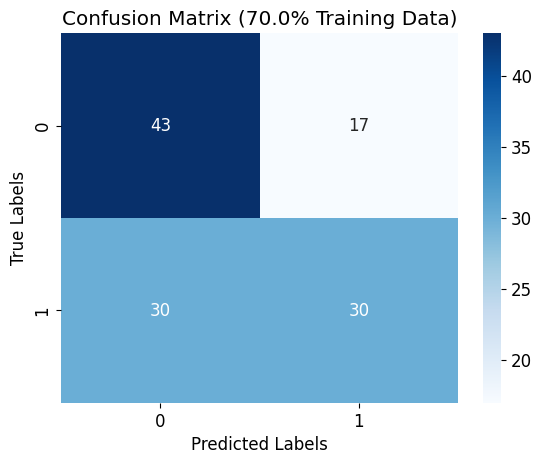

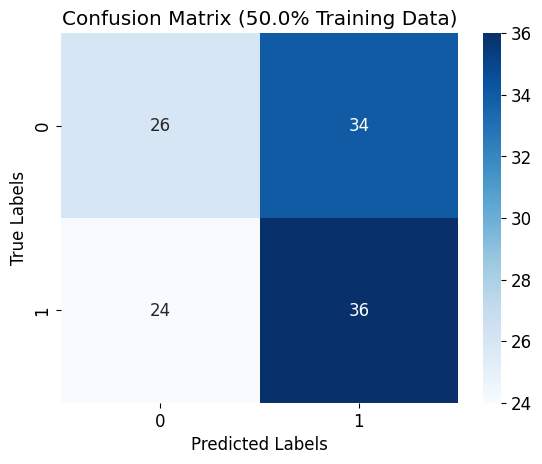

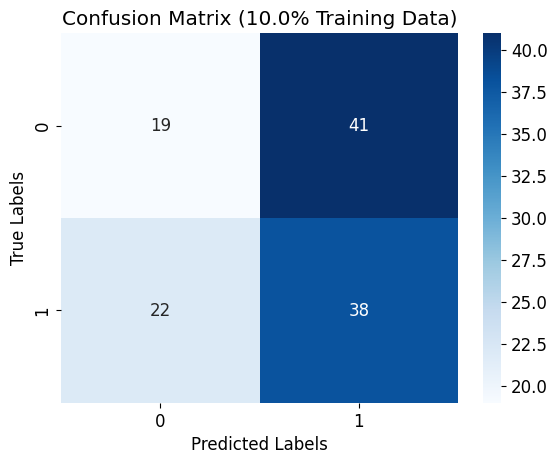

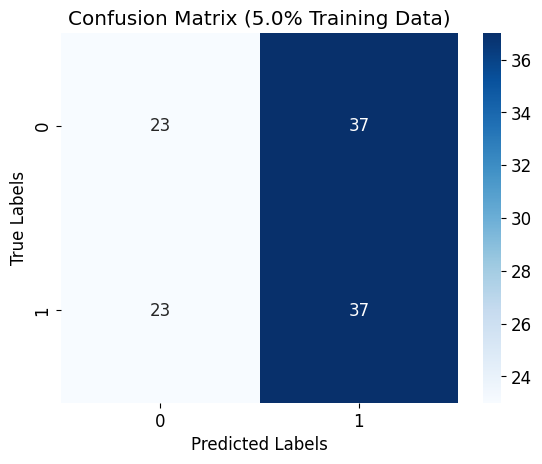

In [57]:
evaluate_con_mat(train_set, test_labels, pred_vqtask1)